In [1]:
device="cuda"
batch_size = 512

train_data_path   = 'datasets/MNIST/train-images.idx3-ubyte'
train_labels_path = 'datasets/MNIST/train-labels.idx1-ubyte'
test_data_path    = 'datasets/MNIST/t10k-images.idx3-ubyte'
test_labels_path  = 'datasets/MNIST/t10k-labels.idx1-ubyte'

Label: 9
Matrix: [[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0  55 148 210 253 253 113
   87 148  55   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0  

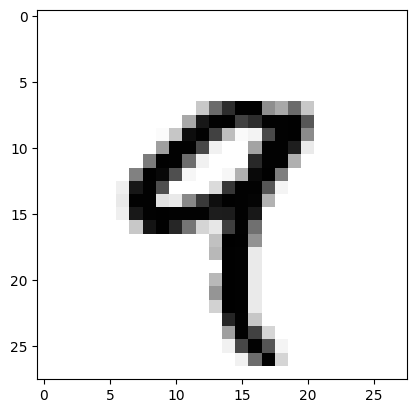

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import pandas as pd
from tqdm.notebook import tqdm, trange
import os
import numpy as np
import idx2numpy
import matplotlib.pyplot as plt

train_imagearray = idx2numpy.convert_from_file(train_data_path)
train_labels =     idx2numpy.convert_from_file(train_labels_path)
test_imagearray =  idx2numpy.convert_from_file(test_data_path)
test_labels =      idx2numpy.convert_from_file(test_labels_path)


plt.imshow(train_imagearray[4], cmap=plt.cm.binary)
print("Label:", train_labels[4])
print("Matrix:", train_imagearray[4])


In [3]:
num_classes = 10

#train_labels = np.eye(num_classes, dtype=int)[train_labels]
#test_labels = np.eye(num_classes, dtype=int)[test_labels]
#print(train_labels[4])
#print(train_labels[4].shape)

train_labels = torch.tensor(train_labels, device=device)
test_labels = torch.tensor(test_labels, device=device)
print(train_labels.shape)
print(train_labels[4])

torch.Size([60000])
tensor(9, device='cuda:0', dtype=torch.uint8)


In [4]:
print(train_imagearray.shape)

train_imagearray = torch.tensor(train_imagearray, device=device)
train_imagearray = train_imagearray.flatten(start_dim=-2)
print(train_imagearray.shape)

test_imagearray = torch.tensor(test_imagearray, device=device)
test_imagearray = test_imagearray.flatten(start_dim=-2)
print(test_imagearray.shape)

train_imagearray = train_imagearray / 255
test_imagearray = test_imagearray / 255

(60000, 28, 28)
torch.Size([60000, 784])
torch.Size([10000, 784])


In [5]:
train_imagearray = train_imagearray.unsqueeze(-1)  # shape (60000, 784, 1)
test_imagearray = test_imagearray.unsqueeze(-1)    # shape (10000, 784, 1)

In [6]:
def data_to_batched(data, data_labels, batch_size):

    num_batches = len(data)//batch_size
    seq_loss = len(data)%batch_size

    result_data = []
    result_labels = []

    print(f"Samples lost: {seq_loss}")
    print(f"Target batches: {num_batches}")
    print(f"Source dataset size: {len(data)}")
    print(f"Target dataset size: {len(data)-seq_loss}")

    for i in trange(num_batches):
        batch = data[i*batch_size:(i+1)*batch_size, :]
        batch_labels = data_labels[i*batch_size:(i+1)*batch_size]

        result_data.append(batch)
        result_labels.append(batch_labels)

    print(f"Data len: {len(result_data)}")
    print(f"Data element shape: {result_data[0].shape}")
    
    print(f"Labels len: {len(result_labels)}")
    print(f"Labels element shape: {result_labels[0].shape}")

    return result_data, result_labels

In [7]:
train_data_batched, train_labels_batched = data_to_batched(train_imagearray, train_labels, batch_size)
test_data_batched, test_labels_batched = data_to_batched(test_imagearray, test_labels, batch_size)

Samples lost: 96
Target batches: 117
Source dataset size: 60000
Target dataset size: 59904


  0%|          | 0/117 [00:00<?, ?it/s]

Data len: 117
Data element shape: torch.Size([512, 784, 1])
Labels len: 117
Labels element shape: torch.Size([512])
Samples lost: 272
Target batches: 19
Source dataset size: 10000
Target dataset size: 9728


  0%|          | 0/19 [00:00<?, ?it/s]

Data len: 19
Data element shape: torch.Size([512, 784, 1])
Labels len: 19
Labels element shape: torch.Size([512])


## Training

In [8]:
def save_model(model, optimizer, epoch_saved, model_name, note):
    checkpoint = {
        "epoch_saved": epoch_saved,
        "model_state_dict": model.state_dict(),
        "optimizer_state_dict": optimizer.state_dict()
    }
    name = '_'.join(model_name.split()) + "_" + '_'.join(note.split()) + "_epoch_" + str(epoch_saved) + ".pt"
    torch.save(checkpoint, name)


def load_model(filename, device, model, optimizer):
    checkpoint = torch.load(filename, map_location=device)
    model.load_state_dict(checkpoint["model_state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
    start_epoch = checkpoint["epoch_saved"] + 1
    return start_epoch

In [9]:
def plot_loss_curves(steps, train_history, test_history, model_name="Model"):
    plt.figure(figsize=(8, 5))
    plt.plot(steps, train_history, label='Train Loss', color='teal', linewidth=2)
    plt.plot(steps, test_history, label='Test Loss', color='orange', linestyle='--', linewidth=2)
    plt.xlabel('Training Steps')
    plt.ylabel('Cross-Entropy Loss')
    plt.title(f'{model_name} MNIST Losses')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

In [10]:
def evaluate_model(model, batch_size, batched_testing_data, batched_testing_labels, device):
    model.eval()
    with torch.no_grad():

        loss_sum = 0
        sum_test_acc = 0

        for i in trange(len(batched_testing_data)//10):

            inputs = batched_testing_data[i]
            outputs= batched_testing_labels[i]
            
            logits = model.forward(inputs)
            loss_t = F.cross_entropy(logits, outputs)

            loss_sum = loss_sum + loss_t.item()

            preds = torch.argmax(logits, dim=-1)
            correct = (preds == outputs).sum().item()

            test_accuracy = (correct / len(inputs)) * 100.0
            sum_test_acc = sum_test_acc + test_accuracy



        loss_avg = loss_sum/(len(batched_testing_data)/10)
        acc_avg = sum_test_acc/(len(batched_testing_data)/10)
        
    model.train()

    return loss_avg, acc_avg

In [11]:
def train_model(model, model_name, opt, training_data_batched, training_labels_batched, testing_data_batched, testing_labels_batched, train_loss_history, test_loss_history, acc_history, start_step, recorded_steps, break_time, hid, device):
    
    step = start_step

    for i in trange(len(training_data_batched)):

        inputs = training_data_batched[i]
        outputs = training_labels_batched[i]

        opt.zero_grad()
    
        logits = model.forward(inputs)
        loss_t = F.cross_entropy(logits, outputs)
    
        loss_t.backward()

        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
    
        opt.step()

        if step % 100 ==0 and step !=0:
            save_model(model, opt, step, model_name, note="MNIST")

        if step % break_time ==0:
            eval_loss, eval_acc = evaluate_model(
                model=model,
                batch_size=batch_size,
                batched_testing_data=testing_data_batched,
                batched_testing_labels=testing_labels_batched,
                device=device
            )

            train_loss_history.append(loss_t.item())
            test_loss_history.append(eval_loss)
            acc_history.append(eval_acc)
            recorded_steps.append(step)

            plot_loss_curves(recorded_steps, train_loss_history, test_loss_history, model_name=model_name)

            print(f"Step: {step}")
            print(f"Training loss: {loss_t.item()}")
            print(f"Validation loss: {eval_loss}")
            print(f"Accuracy measurement: {eval_acc}")

        step = step + 1

    return step
        

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

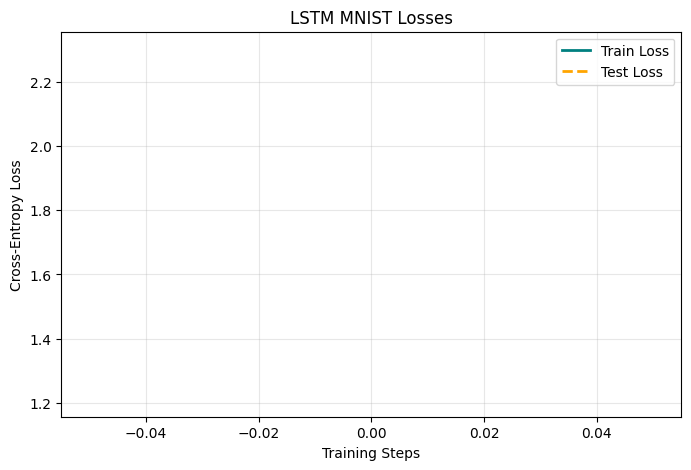

Step: 0
Training loss: 2.3029472827911377
Validation loss: 1.2106118704143325
Accuracy measurement: 5.6537828947368425


  0%|          | 0/1 [00:00<?, ?it/s]

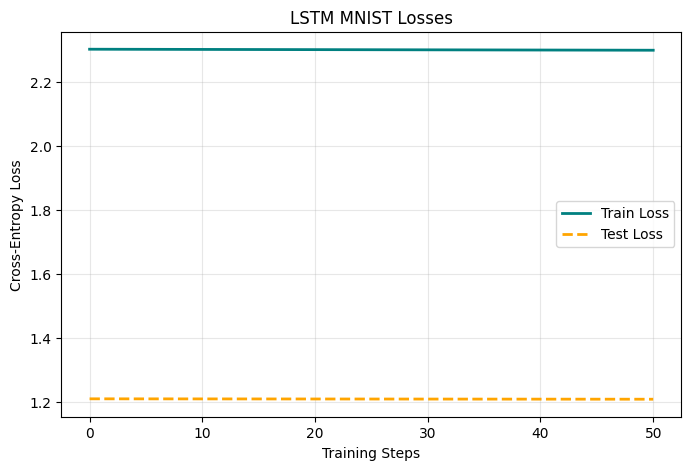

Step: 50
Training loss: 2.299787759780884
Validation loss: 1.2093606748079
Accuracy measurement: 7.092927631578948


  0%|          | 0/1 [00:00<?, ?it/s]

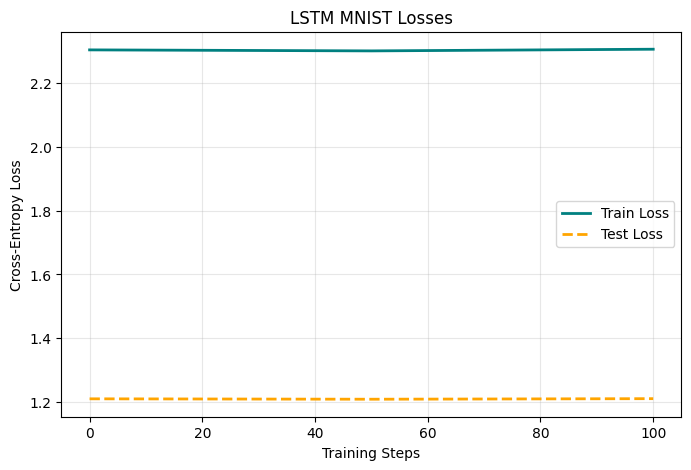

Step: 100
Training loss: 2.3050224781036377
Validation loss: 1.21110527138961
Accuracy measurement: 7.092927631578948


  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

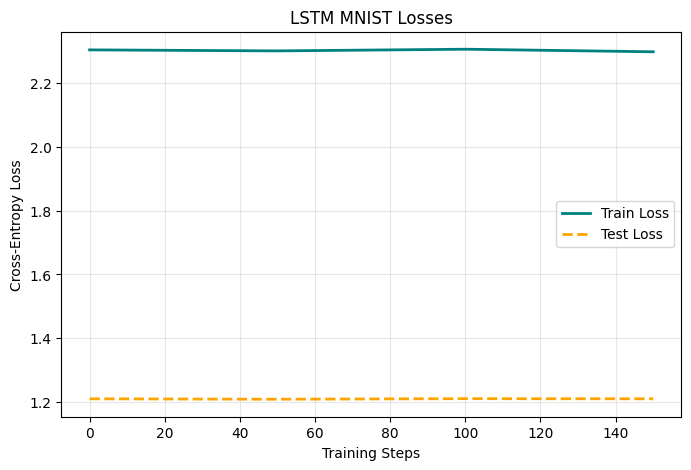

Step: 150
Training loss: 2.2969846725463867
Validation loss: 1.2106931836981523
Accuracy measurement: 7.092927631578948


  0%|          | 0/1 [00:00<?, ?it/s]

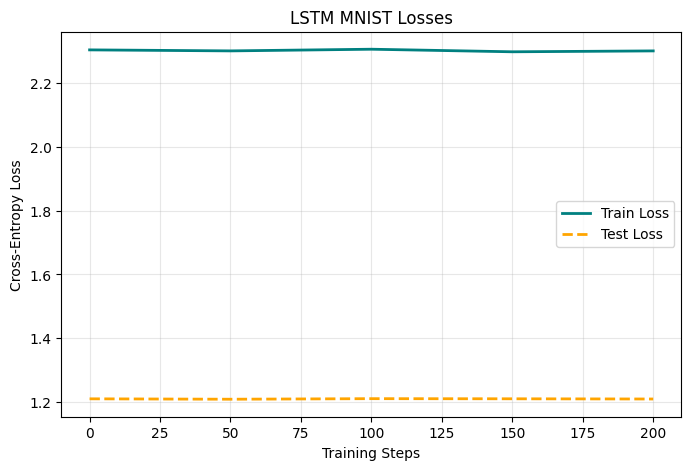

Step: 200
Training loss: 2.2997400760650635
Validation loss: 1.210039540341026
Accuracy measurement: 7.092927631578948


  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

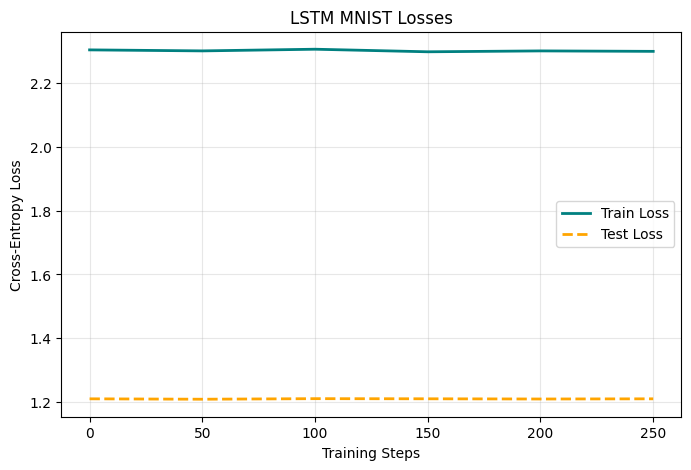

Step: 250
Training loss: 2.2983388900756836
Validation loss: 1.2106147565339742
Accuracy measurement: 7.092927631578948


  0%|          | 0/1 [00:00<?, ?it/s]

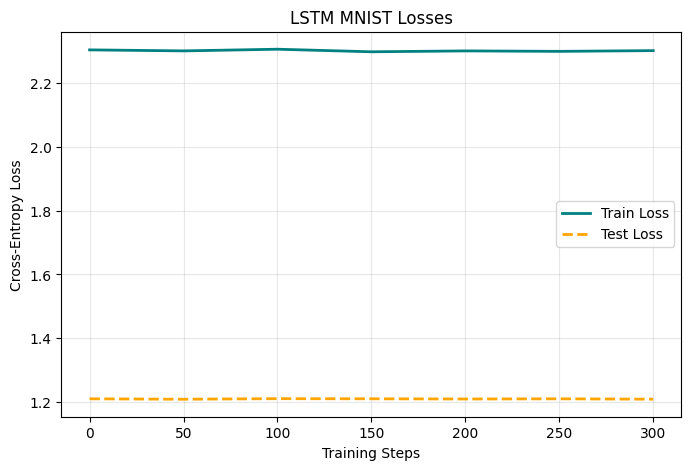

Step: 300
Training loss: 2.300640821456909
Validation loss: 1.209537857457211
Accuracy measurement: 7.092927631578948


  0%|          | 0/1 [00:00<?, ?it/s]

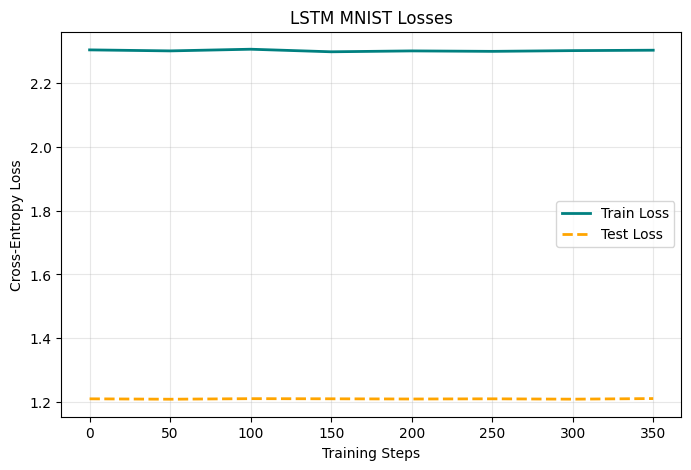

Step: 350
Training loss: 2.3019230365753174
Validation loss: 1.2114233719675165
Accuracy measurement: 7.1957236842105265


  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

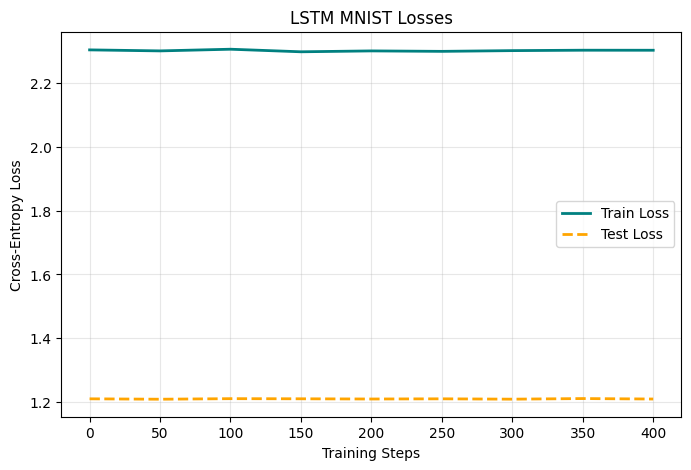

Step: 400
Training loss: 2.3018038272857666
Validation loss: 1.2099912292078923
Accuracy measurement: 7.092927631578948


  0%|          | 0/1 [00:00<?, ?it/s]

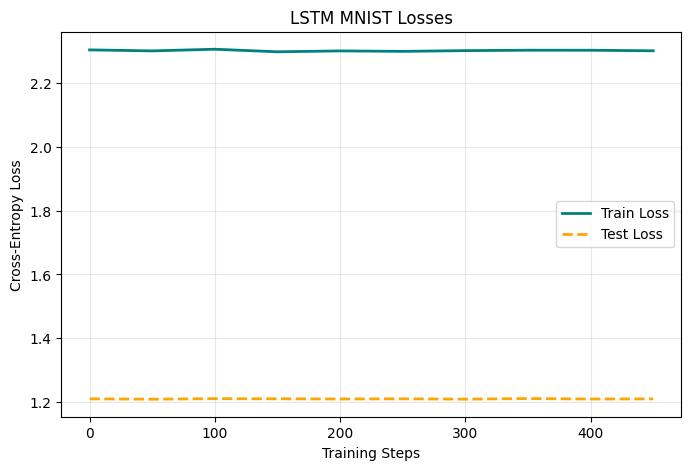

Step: 450
Training loss: 2.3000950813293457
Validation loss: 1.2103796005249023
Accuracy measurement: 7.092927631578948


  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

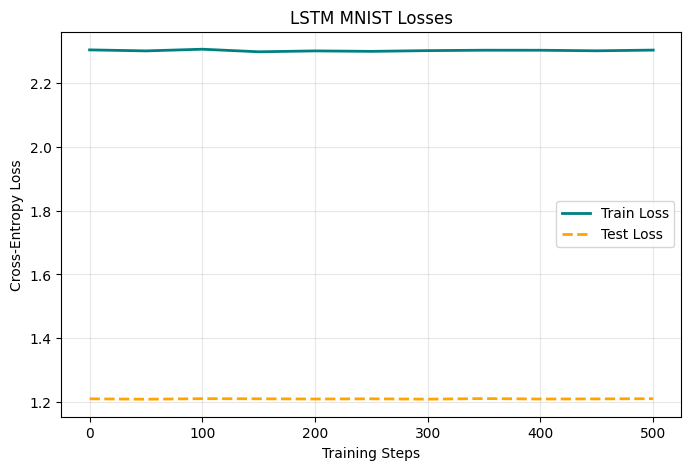

Step: 500
Training loss: 2.3023009300231934
Validation loss: 1.2110641128138493
Accuracy measurement: 7.092927631578948


  0%|          | 0/1 [00:00<?, ?it/s]

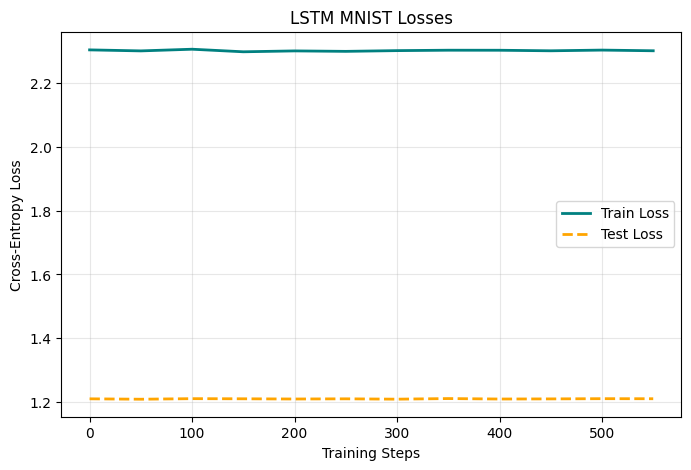

Step: 550
Training loss: 2.3001699447631836
Validation loss: 1.2108664763601202
Accuracy measurement: 7.092927631578948


  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

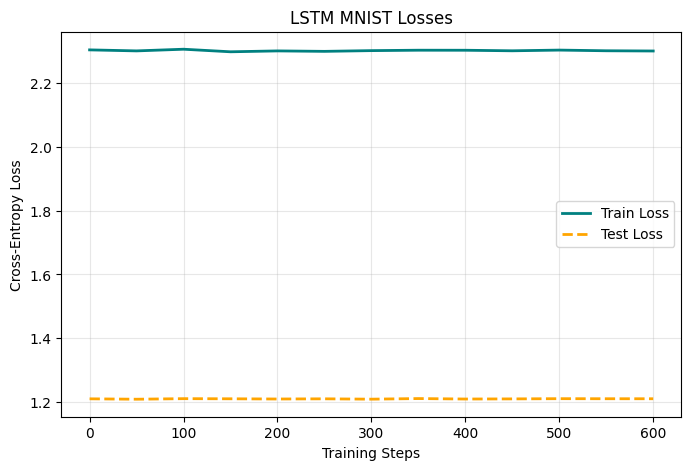

Step: 600
Training loss: 2.2994561195373535
Validation loss: 1.2108145262065688
Accuracy measurement: 7.092927631578948


  0%|          | 0/1 [00:00<?, ?it/s]

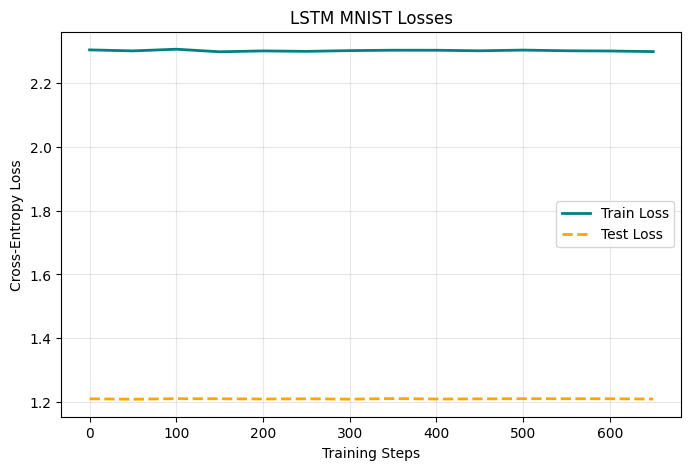

Step: 650
Training loss: 2.2975730895996094
Validation loss: 1.2098478016100431
Accuracy measurement: 7.092927631578948


  0%|          | 0/1 [00:00<?, ?it/s]

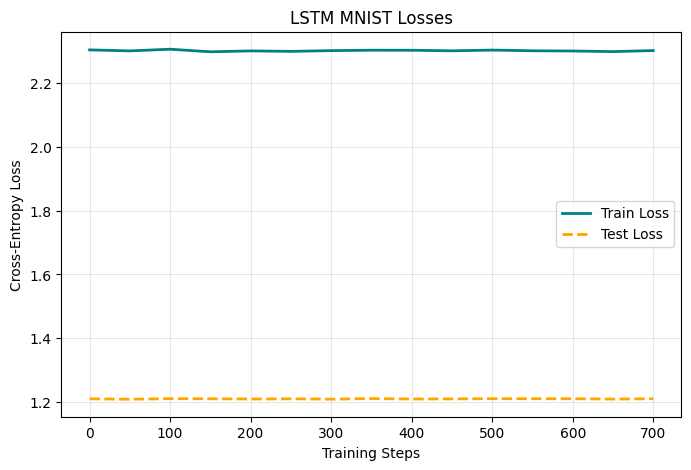

Step: 700
Training loss: 2.300832986831665
Validation loss: 1.2108609550877623
Accuracy measurement: 7.092927631578948


  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

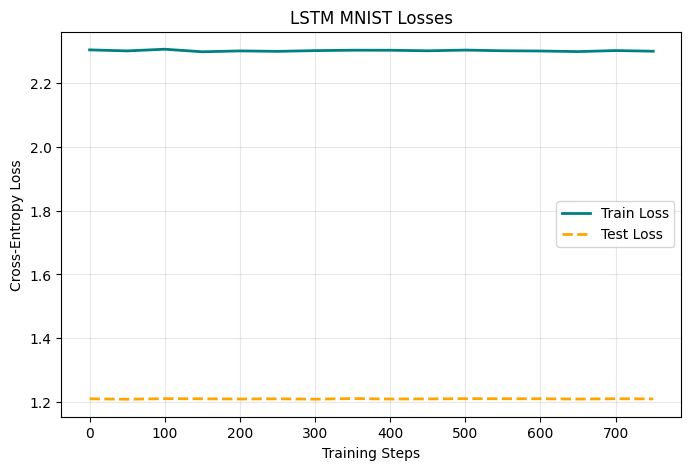

Step: 750
Training loss: 2.2987380027770996
Validation loss: 1.2103325442263955
Accuracy measurement: 7.092927631578948


  0%|          | 0/1 [00:00<?, ?it/s]

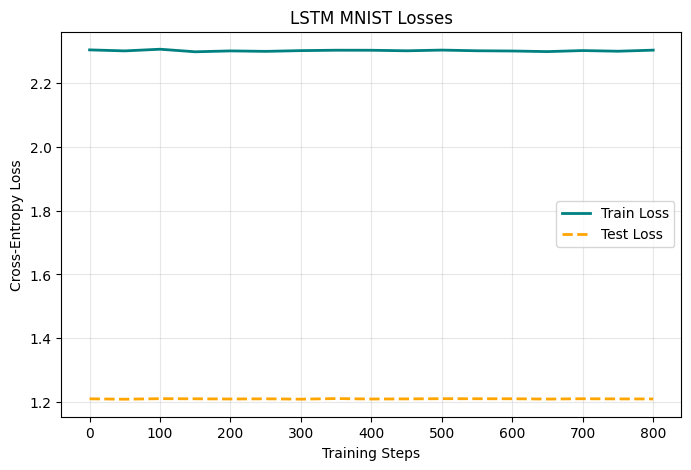

Step: 800
Training loss: 2.3021323680877686
Validation loss: 1.2101986533717106
Accuracy measurement: 7.092927631578948


  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

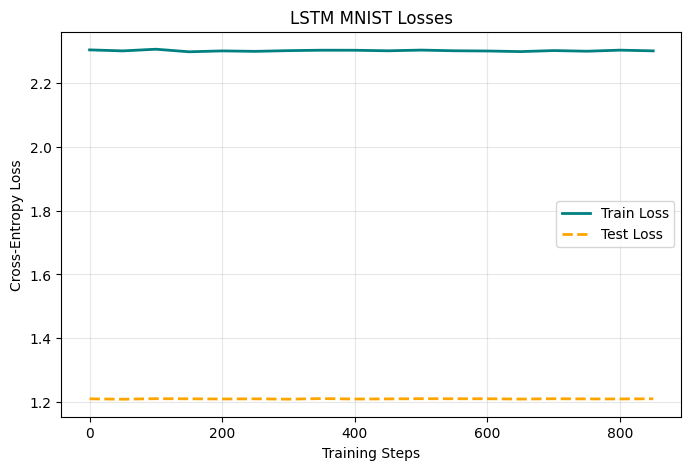

Step: 850
Training loss: 2.2998344898223877
Validation loss: 1.2107588115491366
Accuracy measurement: 7.092927631578948


  0%|          | 0/1 [00:00<?, ?it/s]

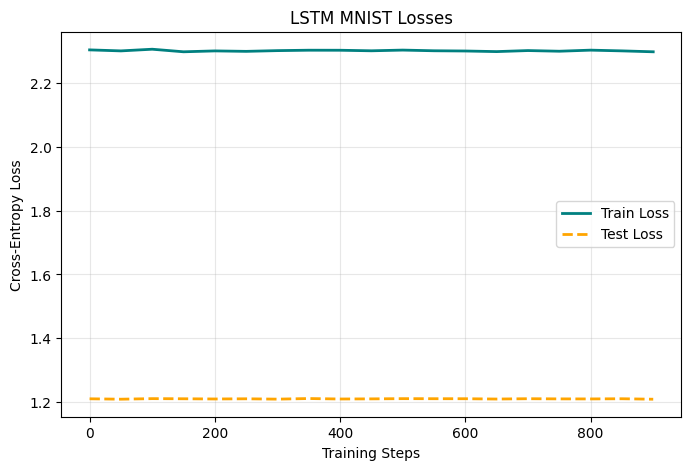

Step: 900
Training loss: 2.296964168548584
Validation loss: 1.2092786086233038
Accuracy measurement: 7.401315789473685


  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

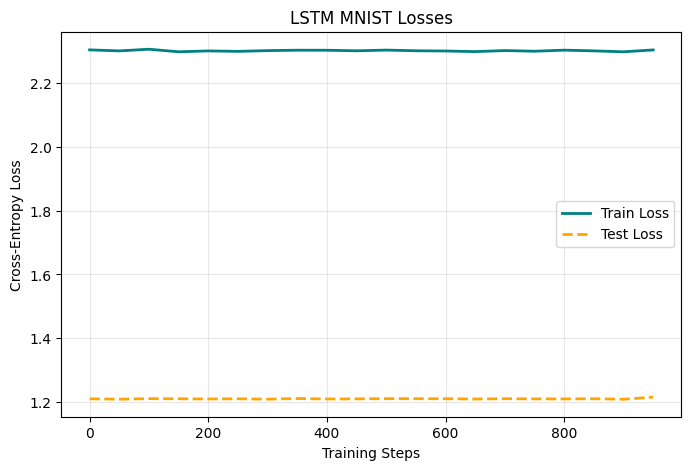

Step: 950
Training loss: 2.302812099456787
Validation loss: 1.2158602162411338
Accuracy measurement: 4.934210526315789


  0%|          | 0/1 [00:00<?, ?it/s]

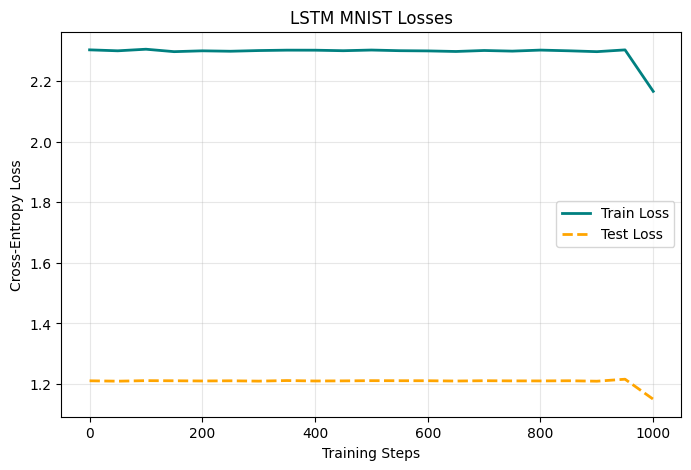

Step: 1000
Training loss: 2.1660101413726807
Validation loss: 1.1498102388883893
Accuracy measurement: 10.587993421052632


  0%|          | 0/1 [00:00<?, ?it/s]

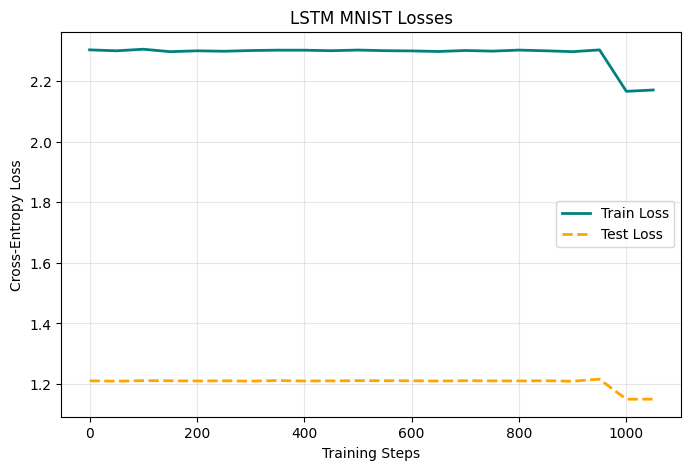

Step: 1050
Training loss: 2.1704742908477783
Validation loss: 1.1499344675164473
Accuracy measurement: 10.69078947368421


  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

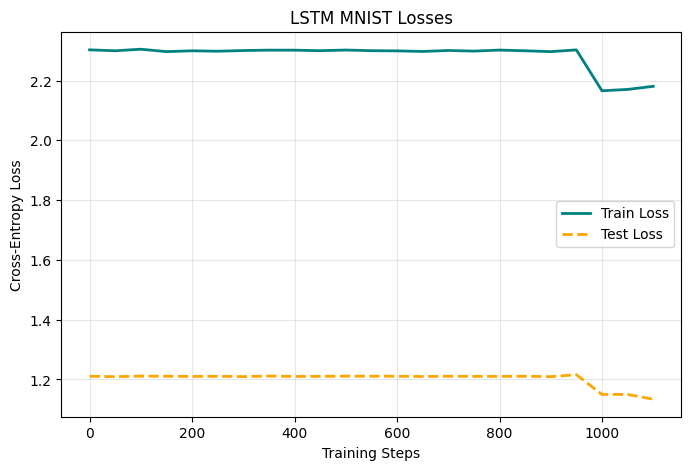

Step: 1100
Training loss: 2.1808712482452393
Validation loss: 1.1338361940885846
Accuracy measurement: 11.821546052631579


  0%|          | 0/1 [00:00<?, ?it/s]

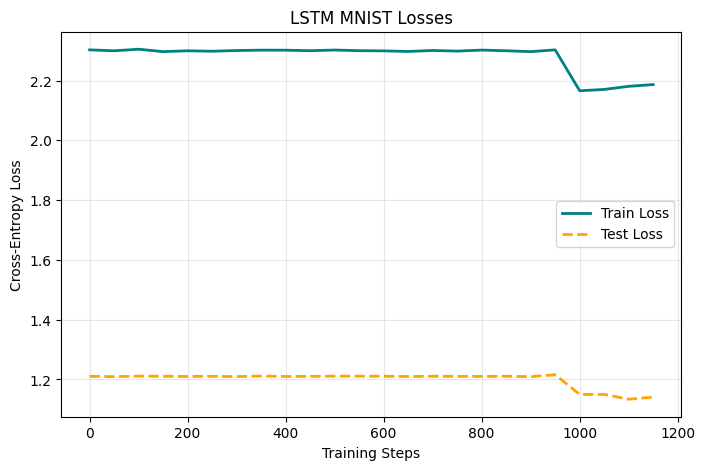

Step: 1150
Training loss: 2.1867616176605225
Validation loss: 1.1411119762219881
Accuracy measurement: 10.999177631578949


  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

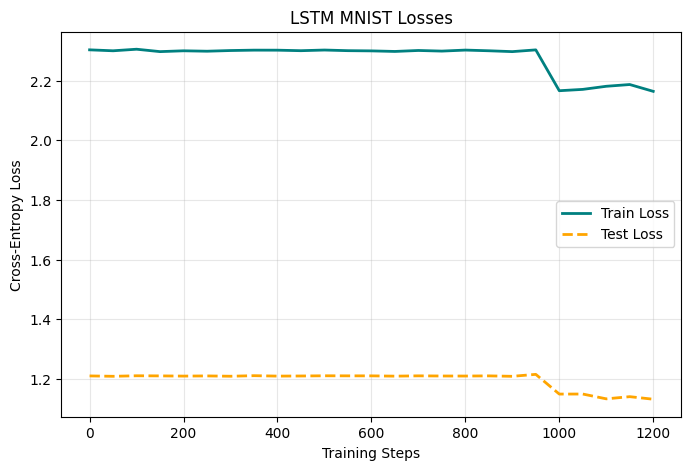

Step: 1200
Training loss: 2.163926839828491
Validation loss: 1.1325517453645406
Accuracy measurement: 11.204769736842106


  0%|          | 0/1 [00:00<?, ?it/s]

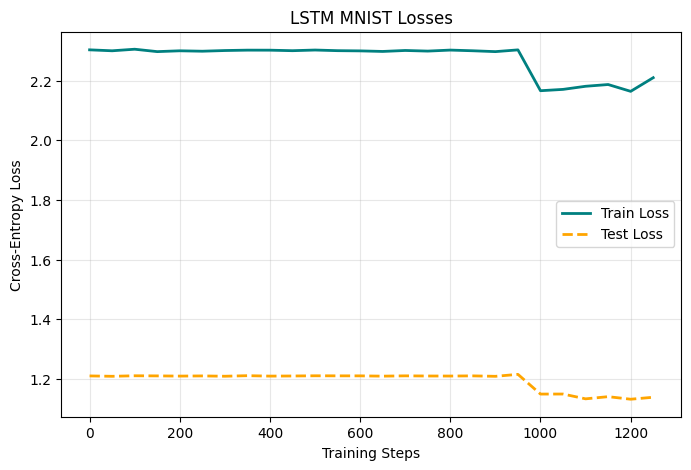

Step: 1250
Training loss: 2.2096426486968994
Validation loss: 1.1391386232878034
Accuracy measurement: 11.71875


  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

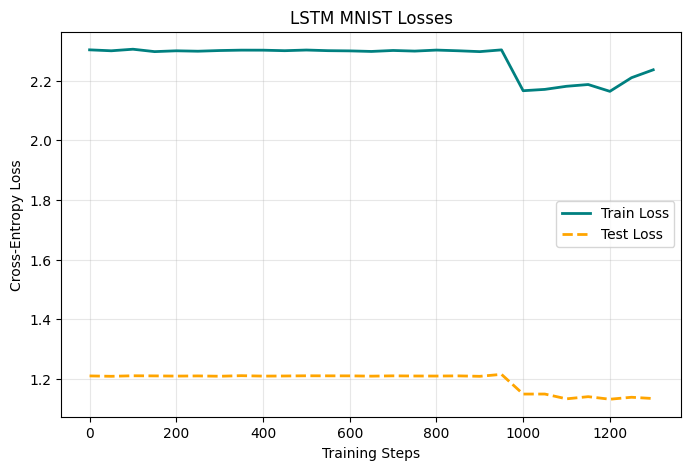

Step: 1300
Training loss: 2.2360851764678955
Validation loss: 1.134827262476871
Accuracy measurement: 11.204769736842106


  0%|          | 0/1 [00:00<?, ?it/s]

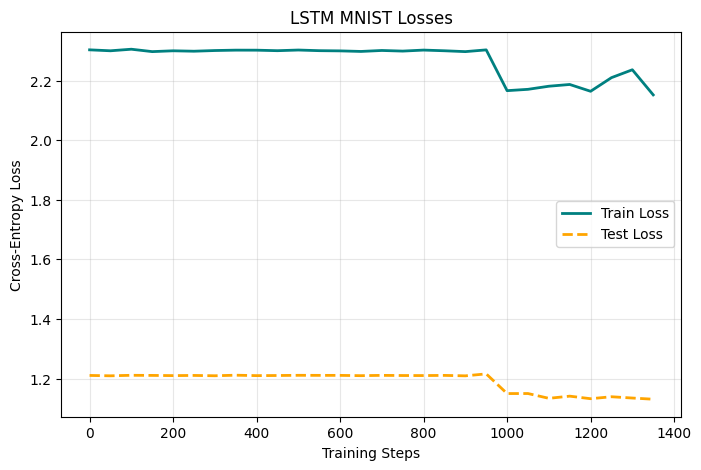

Step: 1350
Training loss: 2.1518797874450684
Validation loss: 1.1308298612895766
Accuracy measurement: 11.821546052631579


  0%|          | 0/1 [00:00<?, ?it/s]

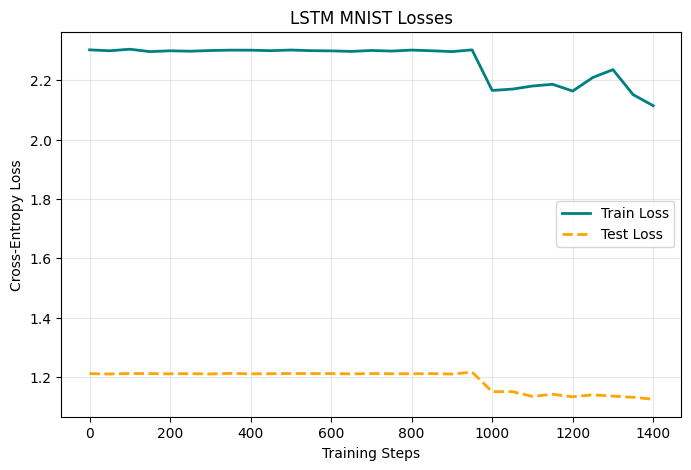

Step: 1400
Training loss: 2.1144676208496094
Validation loss: 1.1243212850470292
Accuracy measurement: 11.307565789473685


  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

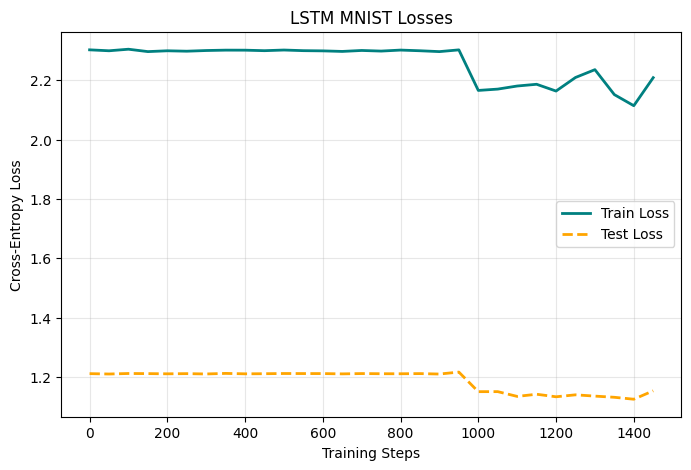

Step: 1450
Training loss: 2.209059238433838
Validation loss: 1.152692343059339
Accuracy measurement: 11.101973684210527


  0%|          | 0/1 [00:00<?, ?it/s]

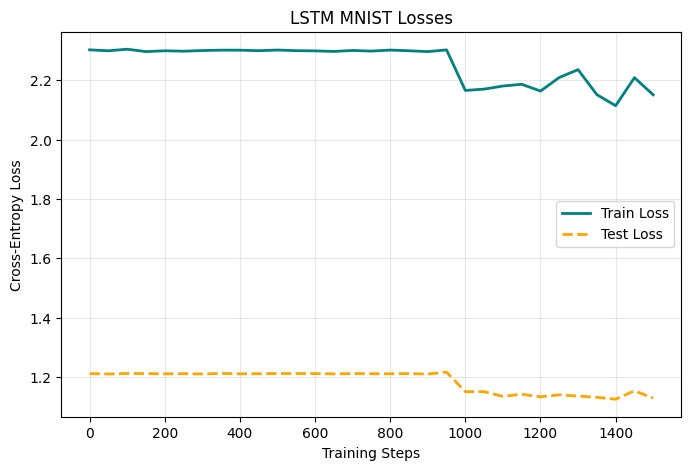

Step: 1500
Training loss: 2.1511926651000977
Validation loss: 1.1283386381048905
Accuracy measurement: 11.204769736842106


  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

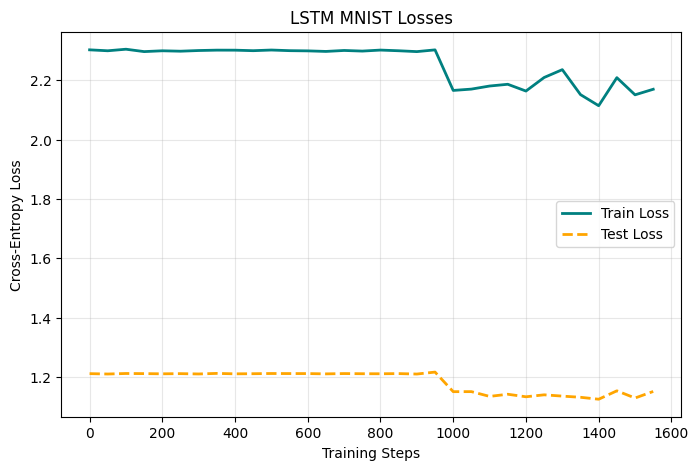

Step: 1550
Training loss: 2.169957160949707
Validation loss: 1.1505067975897538
Accuracy measurement: 10.999177631578949


  0%|          | 0/1 [00:00<?, ?it/s]

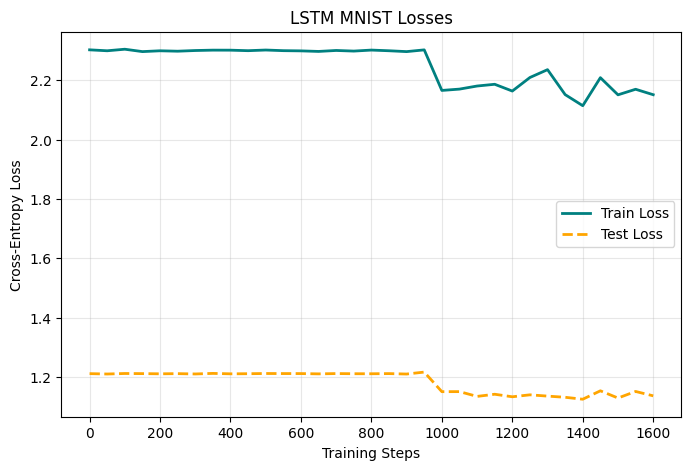

Step: 1600
Training loss: 2.1515560150146484
Validation loss: 1.1357131757234273
Accuracy measurement: 11.821546052631579


  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

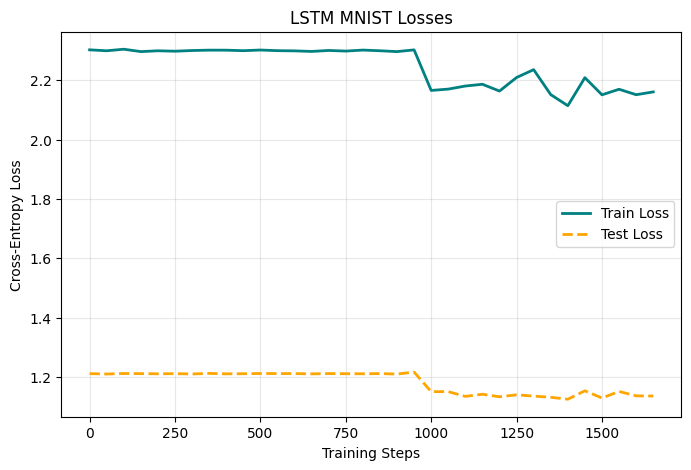

Step: 1650
Training loss: 2.1610610485076904
Validation loss: 1.1350664339567487
Accuracy measurement: 11.204769736842106


  0%|          | 0/1 [00:00<?, ?it/s]

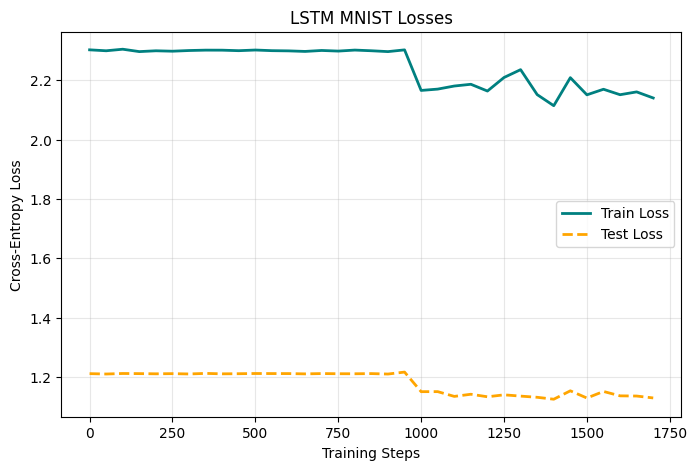

Step: 1700
Training loss: 2.1405391693115234
Validation loss: 1.1286390455145585
Accuracy measurement: 11.92434210526316


  0%|          | 0/1 [00:00<?, ?it/s]

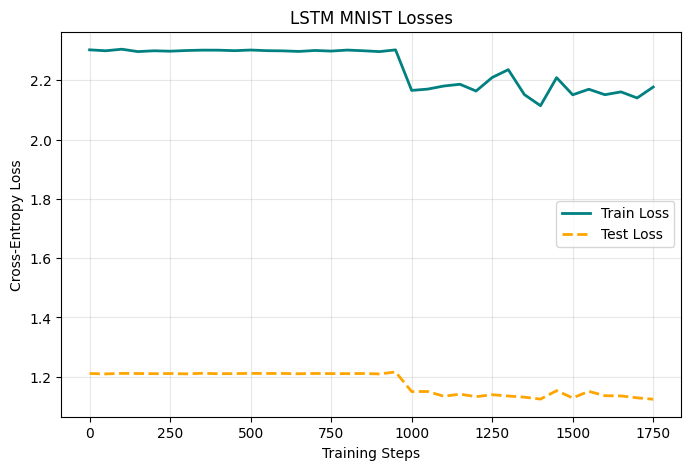

Step: 1750
Training loss: 2.177438735961914
Validation loss: 1.1239144676610044
Accuracy measurement: 11.410361842105264


  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

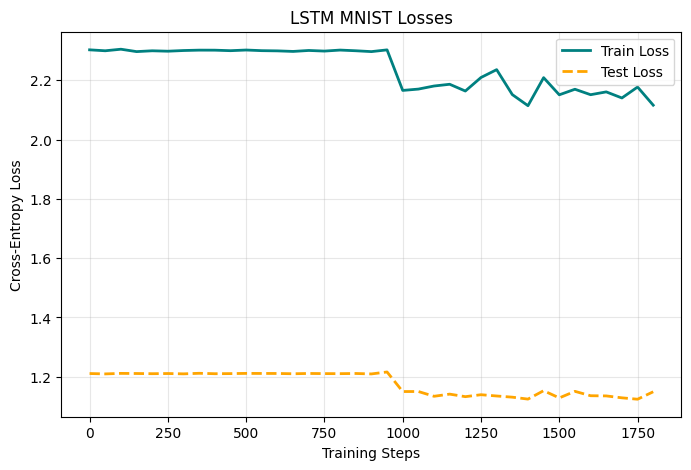

Step: 1800
Training loss: 2.1162009239196777
Validation loss: 1.149045040732936
Accuracy measurement: 11.307565789473685


  0%|          | 0/1 [00:00<?, ?it/s]

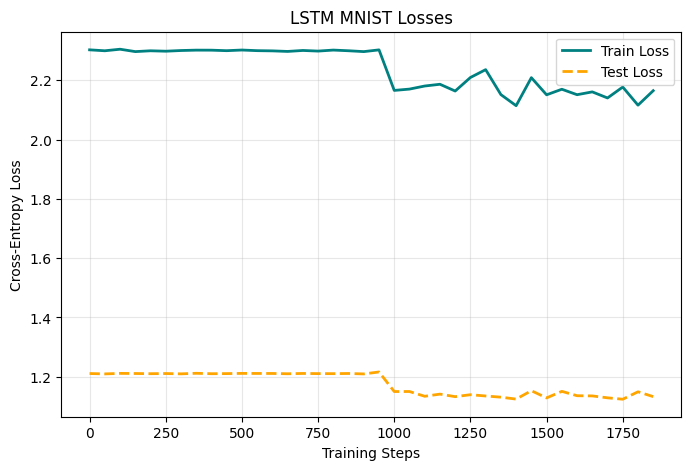

Step: 1850
Training loss: 2.1650705337524414
Validation loss: 1.1326505008496737
Accuracy measurement: 11.204769736842106


  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

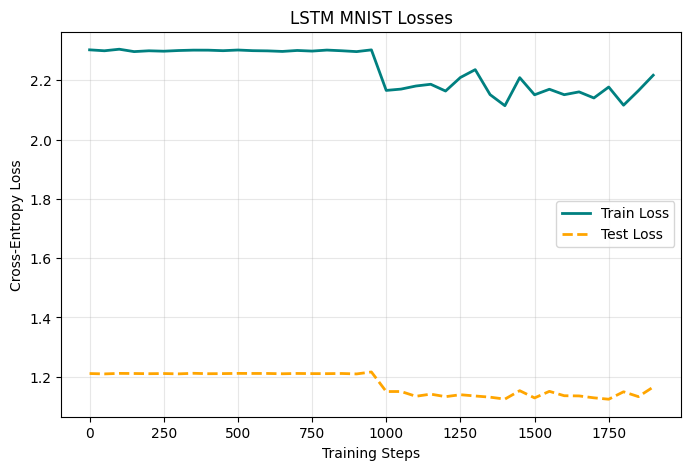

Step: 1900
Training loss: 2.217275857925415
Validation loss: 1.165106171055844
Accuracy measurement: 10.485197368421053


  0%|          | 0/1 [00:00<?, ?it/s]

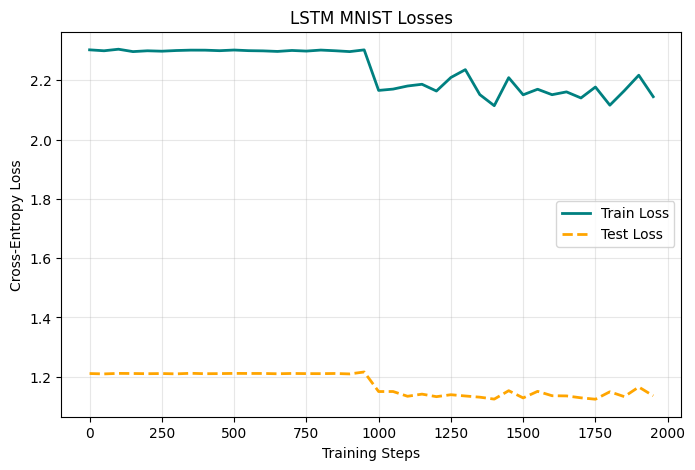

Step: 1950
Training loss: 2.1447999477386475
Validation loss: 1.1354890622590719
Accuracy measurement: 11.821546052631579


  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

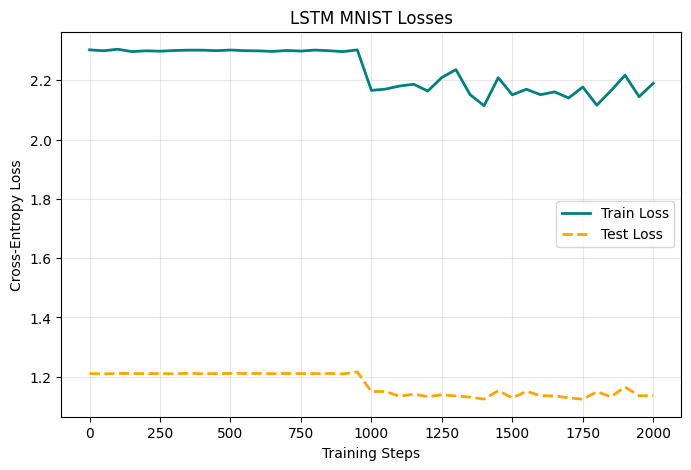

Step: 2000
Training loss: 2.1900882720947266
Validation loss: 1.1358692771510075
Accuracy measurement: 11.101973684210527


  0%|          | 0/1 [00:00<?, ?it/s]

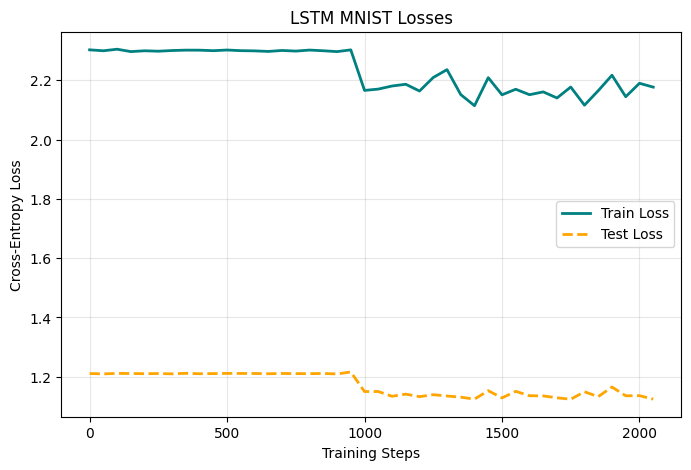

Step: 2050
Training loss: 2.177105665206909
Validation loss: 1.12423018405312
Accuracy measurement: 12.027138157894738


  0%|          | 0/1 [00:00<?, ?it/s]

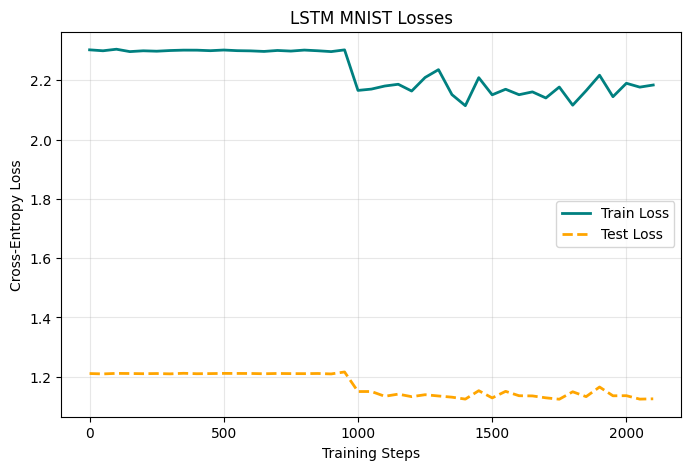

Step: 2100
Training loss: 2.184270143508911
Validation loss: 1.1252706929257041
Accuracy measurement: 11.307565789473685


  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

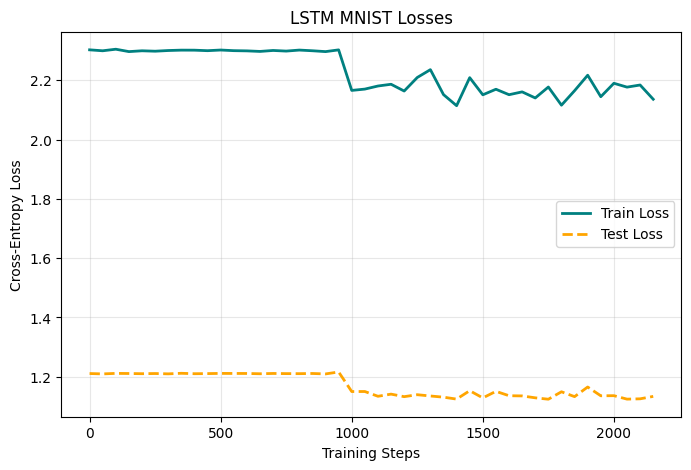

Step: 2150
Training loss: 2.136216640472412
Validation loss: 1.1334372821607088
Accuracy measurement: 11.92434210526316


  0%|          | 0/1 [00:00<?, ?it/s]

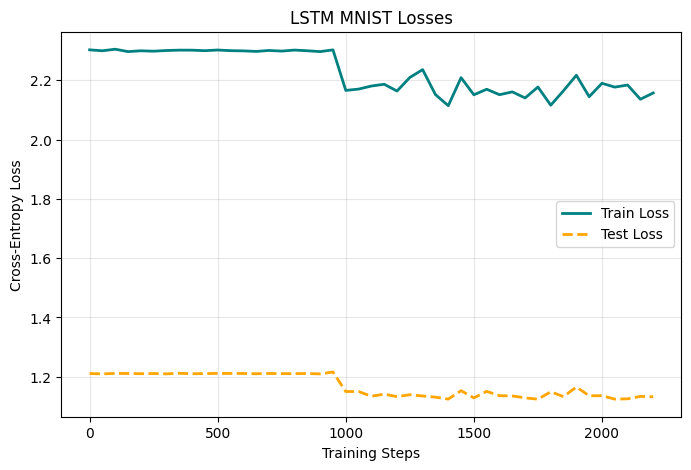

Step: 2200
Training loss: 2.1574275493621826
Validation loss: 1.1320068961695622
Accuracy measurement: 11.204769736842106


  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

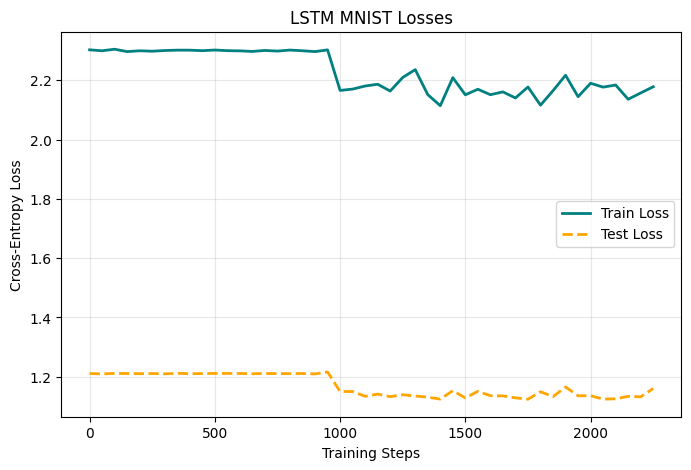

Step: 2250
Training loss: 2.1782827377319336
Validation loss: 1.16000865635119
Accuracy measurement: 10.485197368421053


  0%|          | 0/1 [00:00<?, ?it/s]

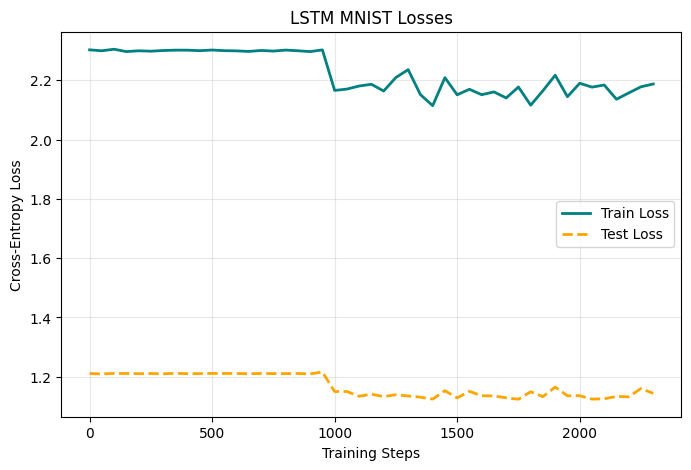

Step: 2300
Training loss: 2.187668561935425
Validation loss: 1.1436045797247636
Accuracy measurement: 11.410361842105264


  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

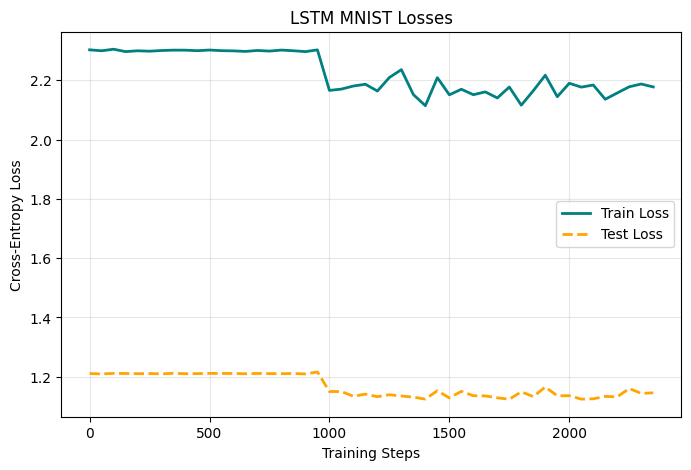

Step: 2350
Training loss: 2.1777236461639404
Validation loss: 1.1454360108626518
Accuracy measurement: 10.999177631578949


  0%|          | 0/1 [00:00<?, ?it/s]

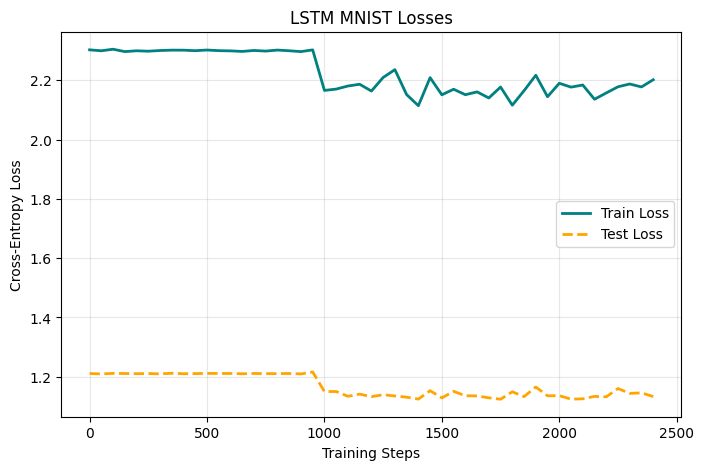

Step: 2400
Training loss: 2.2020373344421387
Validation loss: 1.132877876884059
Accuracy measurement: 11.821546052631579


  0%|          | 0/1 [00:00<?, ?it/s]

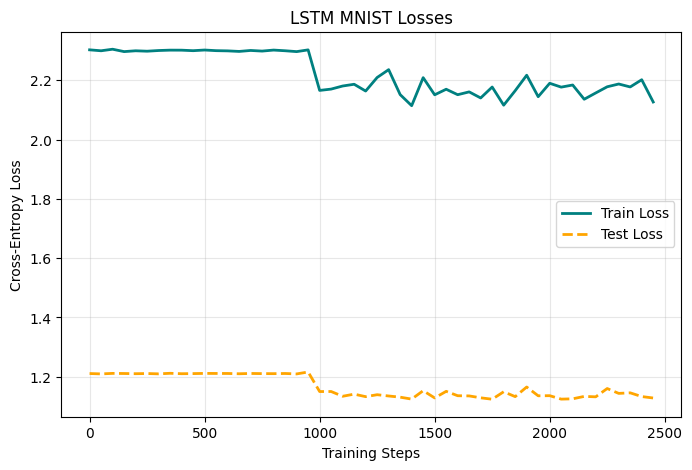

Step: 2450
Training loss: 2.126952886581421
Validation loss: 1.1280362229598198
Accuracy measurement: 11.204769736842106


  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

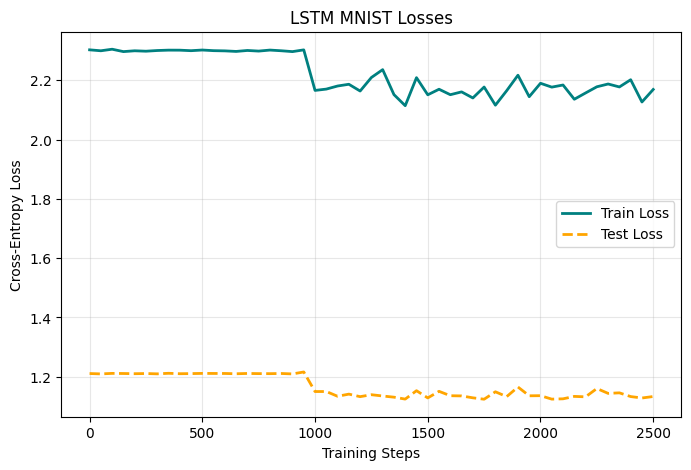

Step: 2500
Training loss: 2.1692147254943848
Validation loss: 1.1330899439359967
Accuracy measurement: 11.821546052631579


  0%|          | 0/1 [00:00<?, ?it/s]

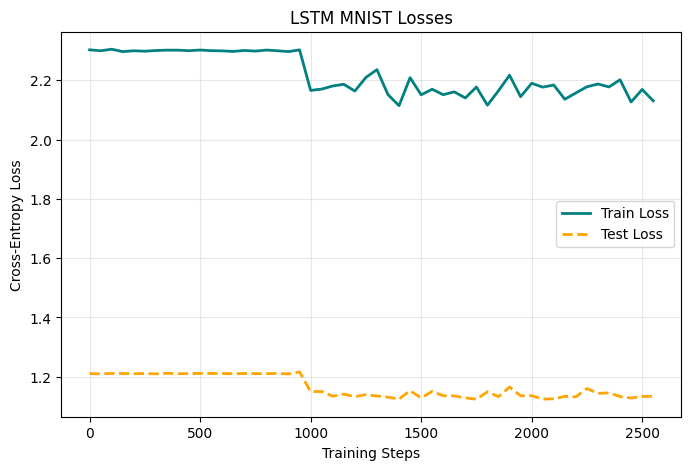

Step: 2550
Training loss: 2.1308679580688477
Validation loss: 1.1338589065953306
Accuracy measurement: 11.821546052631579


  0%|          | 0/117 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

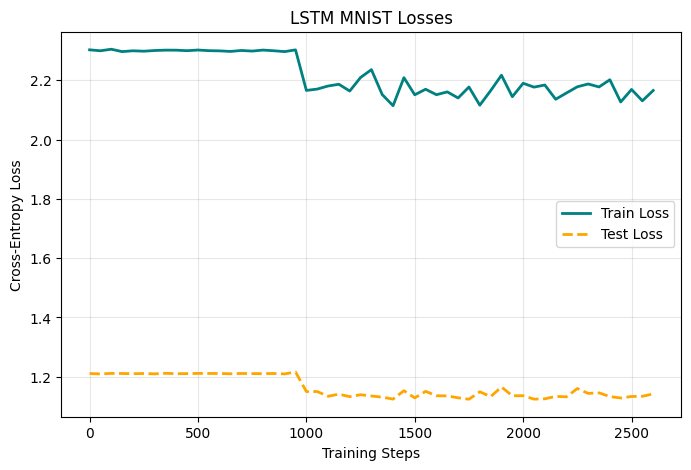

Step: 2600
Training loss: 2.16587495803833
Validation loss: 1.1417870772512335
Accuracy measurement: 10.999177631578949


  0%|          | 0/1 [00:00<?, ?it/s]

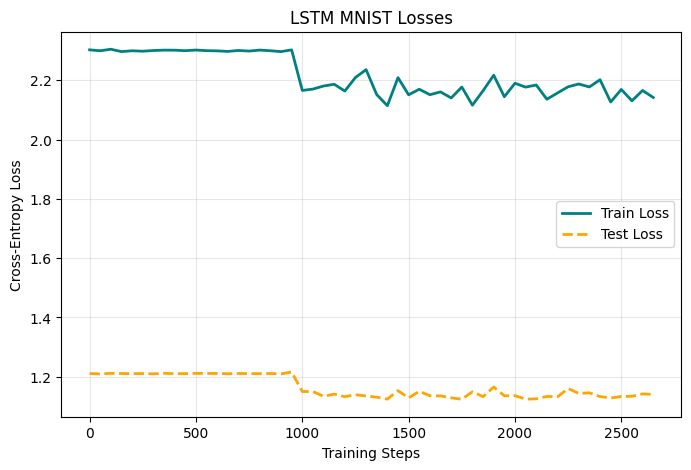

Step: 2650
Training loss: 2.1421923637390137
Validation loss: 1.1400354535956132
Accuracy measurement: 11.615953947368421


In [16]:
import custom_models_for_MNIST
import math

hid=256
lr=1e-3
epochs = 10
break_time=50
start_step =0

steps_history = []
train_history = []
test_history = []
acc_history=[]




LSTM_model = custom_models_for_MNIST.LSTM_LM(vocab_dim=10, hid=hid, emb=1, device='cuda')
opt_LSTM = torch.optim.Adam(LSTM_model.parameters(), lr=lr)
#_ = load_model("eGRU_wikitext2_epoch_10000.pt", device='cuda', model=eGRU_model, optimizer=opt_eGRU)



for epoch in trange(0, 23):

    start_step = train_model(
        model=LSTM_model,
        model_name="LSTM",
        opt=opt_LSTM,
        training_data_batched=train_data_batched,
        training_labels_batched=train_labels_batched,
        testing_data_batched=test_data_batched,
        testing_labels_batched=test_labels_batched,
        train_loss_history=train_history,
        test_loss_history=test_history,
        acc_history=acc_history,
        start_step=start_step,
        recorded_steps=steps_history,
        break_time=break_time,
        hid=hid,
        device=device
    )


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

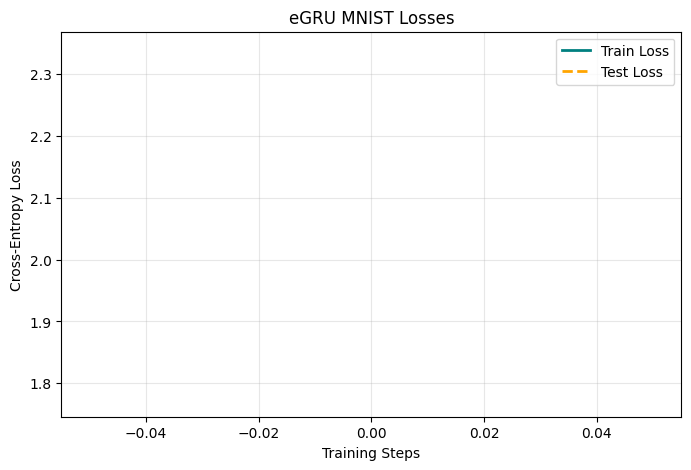

Step: 0
Training loss: 2.3396995067596436
Validation loss: 1.7743413264934833
Accuracy measurement: 9.314903846153847


  0%|          | 0/3 [00:00<?, ?it/s]

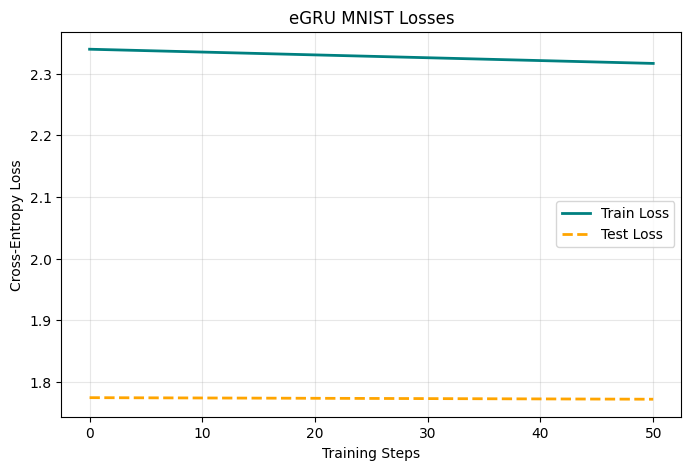

Step: 50
Training loss: 2.316659688949585
Validation loss: 1.7718061422690368
Accuracy measurement: 9.314903846153847


  0%|          | 0/3 [00:00<?, ?it/s]

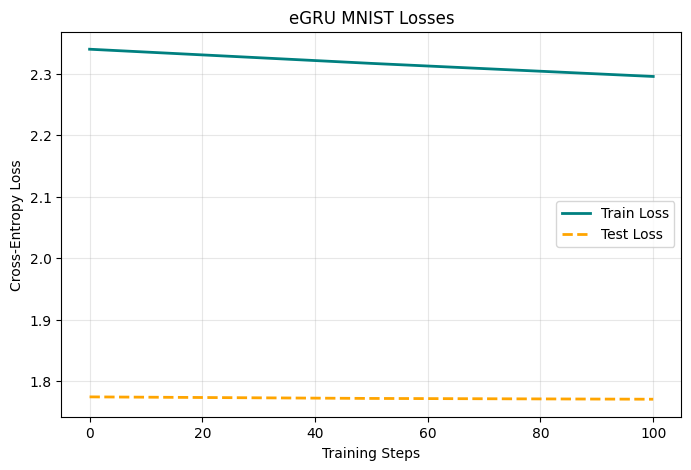

Step: 100
Training loss: 2.2953946590423584
Validation loss: 1.7705287688817735
Accuracy measurement: 9.314903846153847


  0%|          | 0/3 [00:00<?, ?it/s]

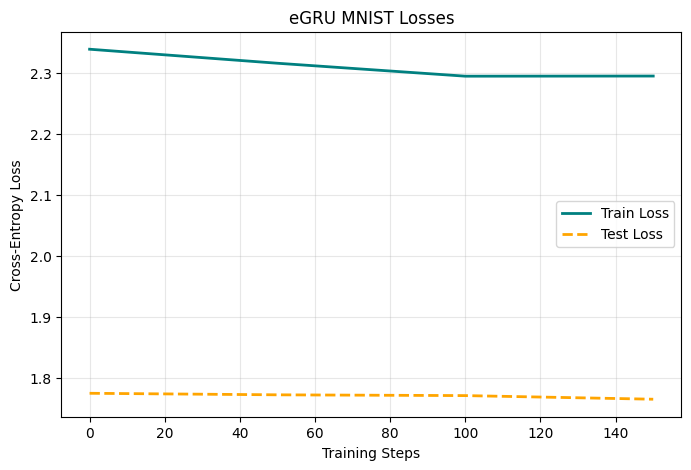

Step: 150
Training loss: 2.295631170272827
Validation loss: 1.7645809589288175
Accuracy measurement: 10.31650641025641


  0%|          | 0/3 [00:00<?, ?it/s]

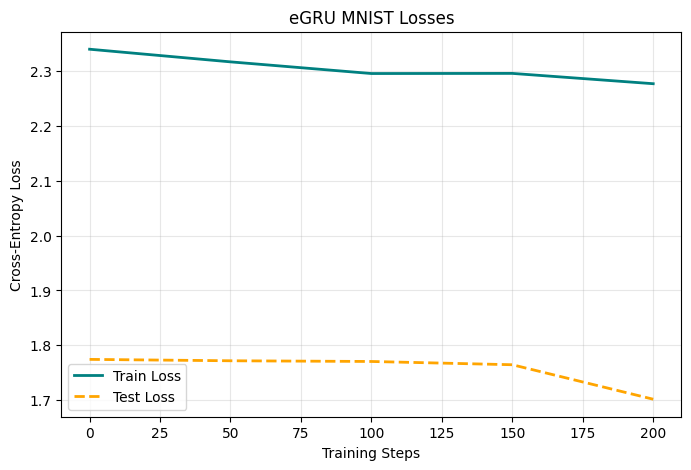

Step: 200
Training loss: 2.2768290042877197
Validation loss: 1.7017275247818384
Accuracy measurement: 11.117788461538462


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

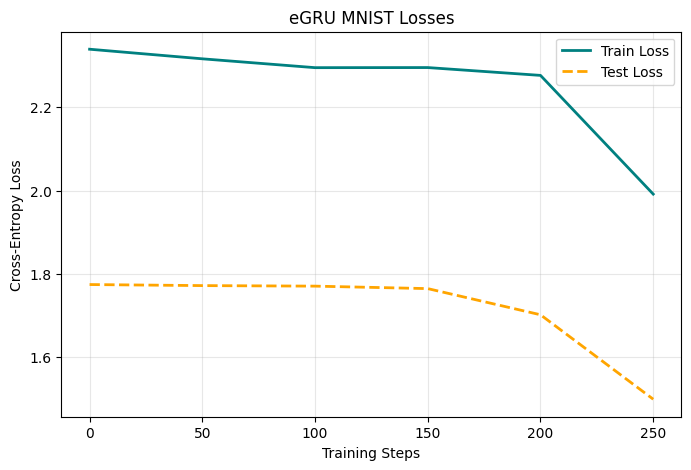

Step: 250
Training loss: 1.9916242361068726
Validation loss: 1.4988487500410814
Accuracy measurement: 17.327724358974358


  0%|          | 0/3 [00:00<?, ?it/s]

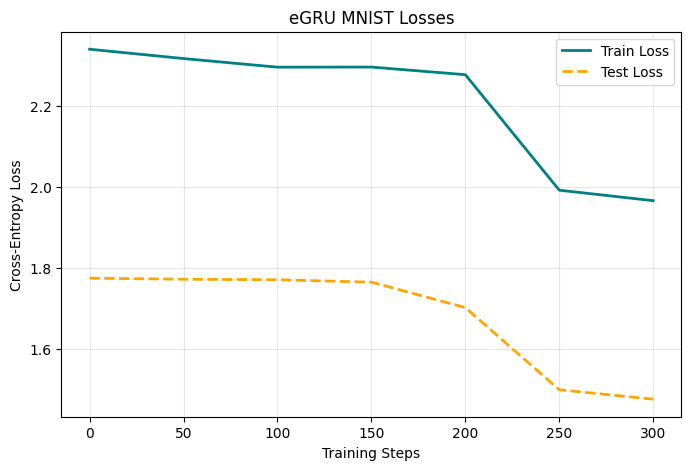

Step: 300
Training loss: 1.965762734413147
Validation loss: 1.4755545518337152
Accuracy measurement: 16.526442307692307


  0%|          | 0/3 [00:00<?, ?it/s]

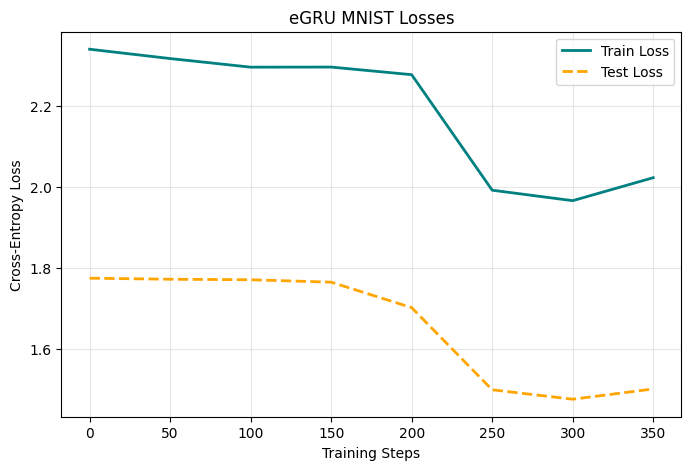

Step: 350
Training loss: 2.022507667541504
Validation loss: 1.5008562039106321
Accuracy measurement: 16.42628205128205


  0%|          | 0/3 [00:00<?, ?it/s]

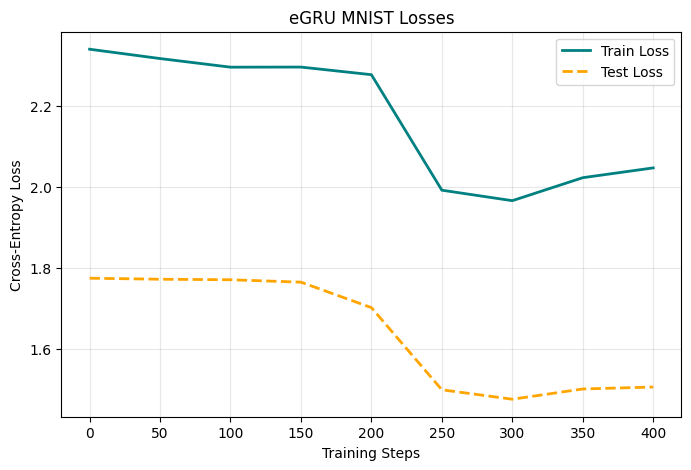

Step: 400
Training loss: 2.046698570251465
Validation loss: 1.505652482693012
Accuracy measurement: 18.329326923076923


  0%|          | 0/3 [00:00<?, ?it/s]

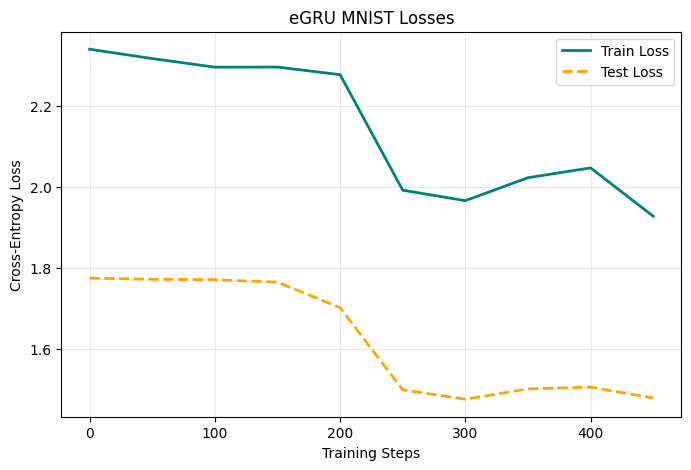

Step: 450
Training loss: 1.9273483753204346
Validation loss: 1.4783607996427097
Accuracy measurement: 21.133814102564102


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

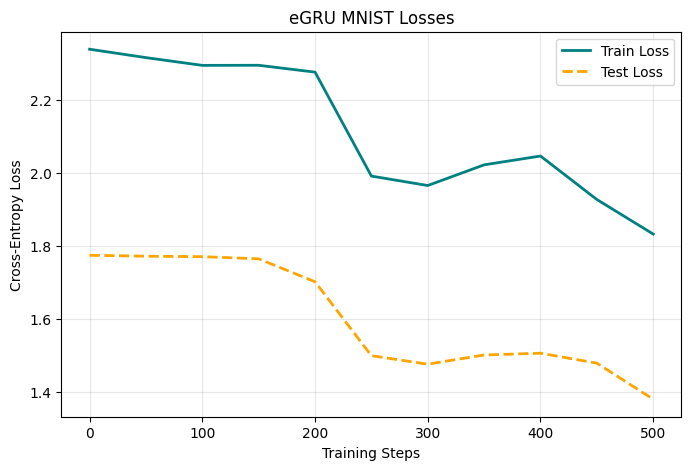

Step: 500
Training loss: 1.832532525062561
Validation loss: 1.3794315472627299
Accuracy measurement: 21.734775641025642


  0%|          | 0/3 [00:00<?, ?it/s]

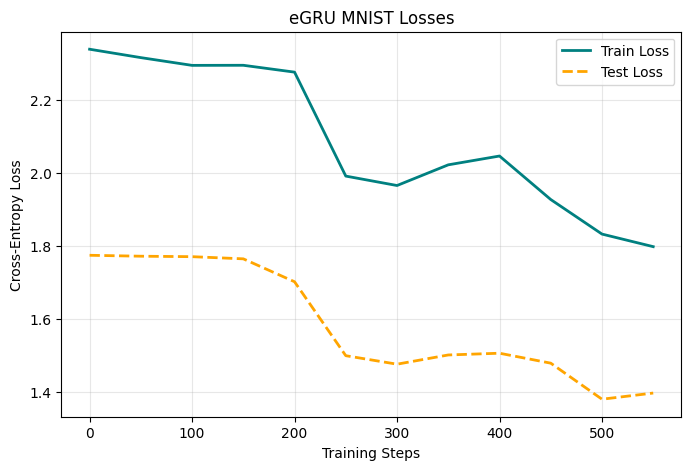

Step: 550
Training loss: 1.7980084419250488
Validation loss: 1.3963823135082538
Accuracy measurement: 24.739583333333332


  0%|          | 0/3 [00:00<?, ?it/s]

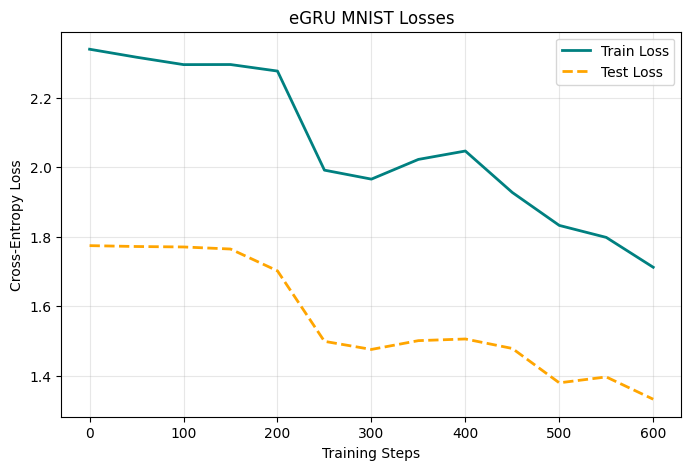

Step: 600
Training loss: 1.71208655834198
Validation loss: 1.3322461262727396
Accuracy measurement: 27.14342948717949


  0%|          | 0/3 [00:00<?, ?it/s]

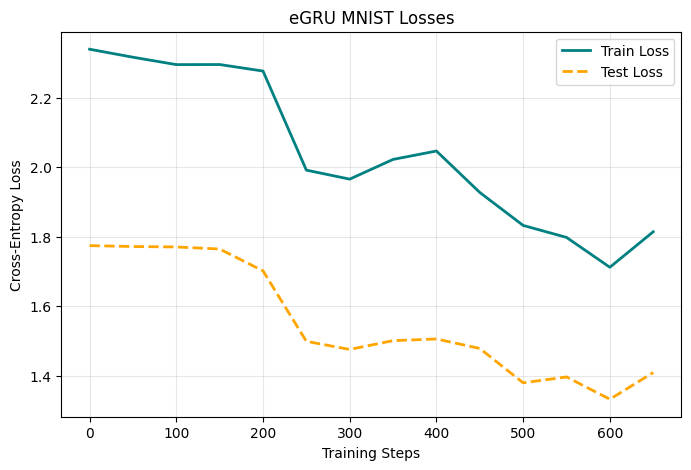

Step: 650
Training loss: 1.8142352104187012
Validation loss: 1.4090148302224967
Accuracy measurement: 26.342147435897438


  0%|          | 0/3 [00:00<?, ?it/s]

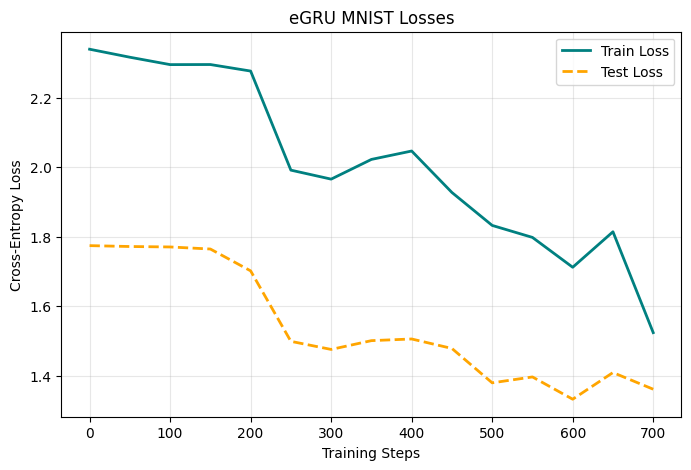

Step: 700
Training loss: 1.523909330368042
Validation loss: 1.3610401826027112
Accuracy measurement: 30.548878205128204


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

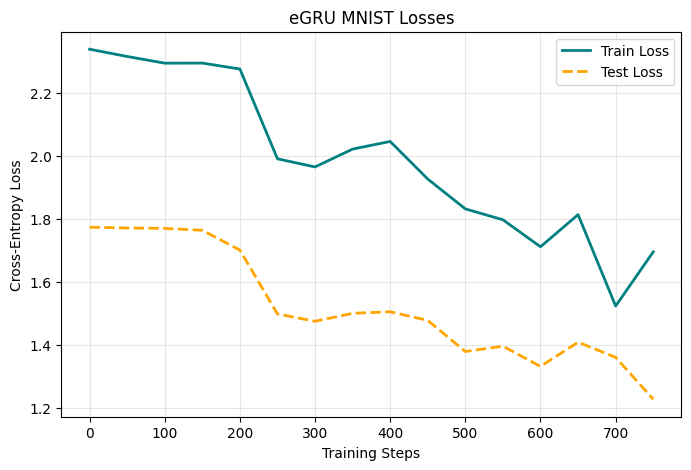

Step: 750
Training loss: 1.6958917379379272
Validation loss: 1.227938609245496
Accuracy measurement: 30.649038461538463


  0%|          | 0/3 [00:00<?, ?it/s]

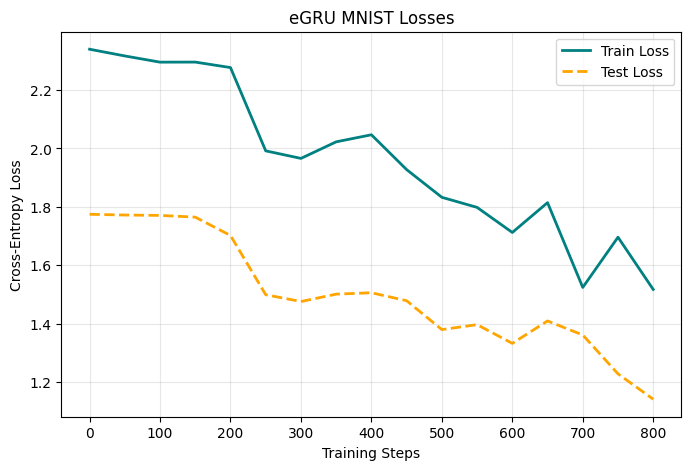

Step: 800
Training loss: 1.5169504880905151
Validation loss: 1.1409750962868714
Accuracy measurement: 34.25480769230769


  0%|          | 0/3 [00:00<?, ?it/s]

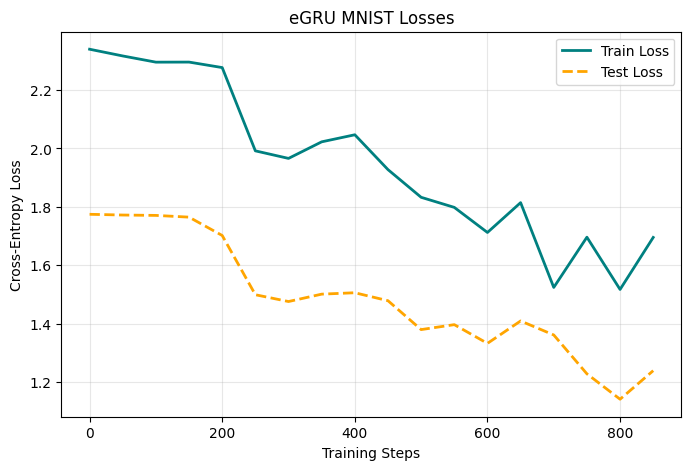

Step: 850
Training loss: 1.6950994729995728
Validation loss: 1.2387964053031726
Accuracy measurement: 34.85576923076923


  0%|          | 0/3 [00:00<?, ?it/s]

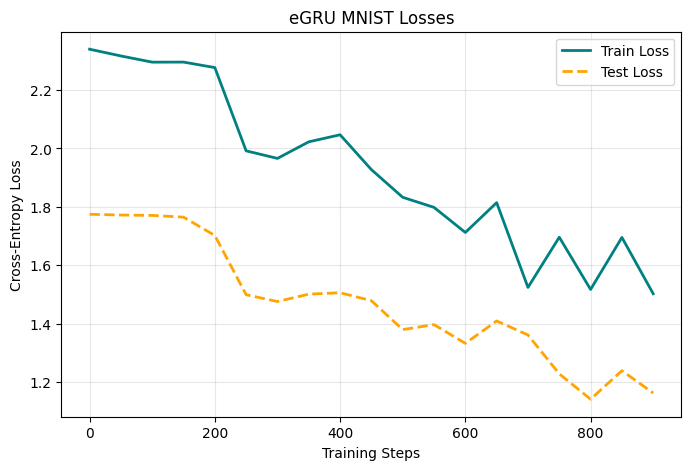

Step: 900
Training loss: 1.5021533966064453
Validation loss: 1.1620983404990954
Accuracy measurement: 36.15785256410256


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

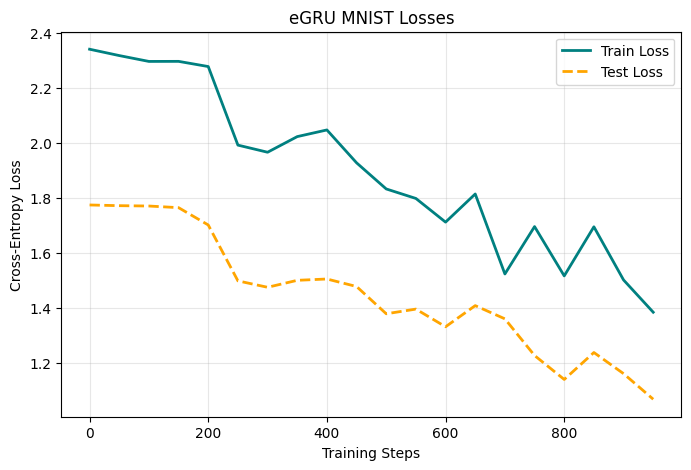

Step: 950
Training loss: 1.3850491046905518
Validation loss: 1.0692623945382926
Accuracy measurement: 37.15945512820513


  0%|          | 0/3 [00:00<?, ?it/s]

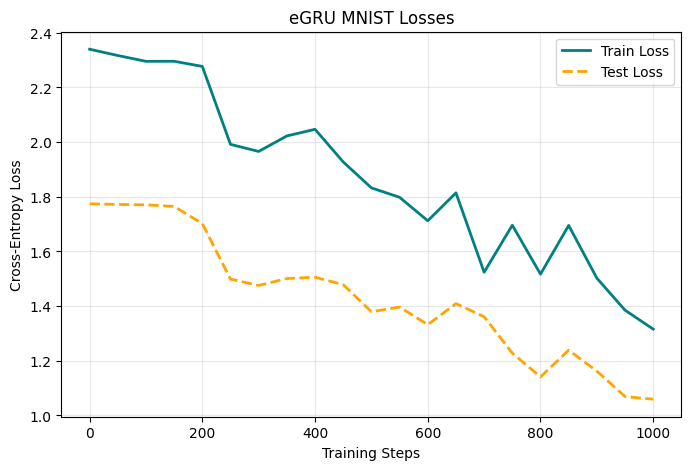

Step: 1000
Training loss: 1.3157873153686523
Validation loss: 1.0593436925839155
Accuracy measurement: 38.86217948717949


  0%|          | 0/3 [00:00<?, ?it/s]

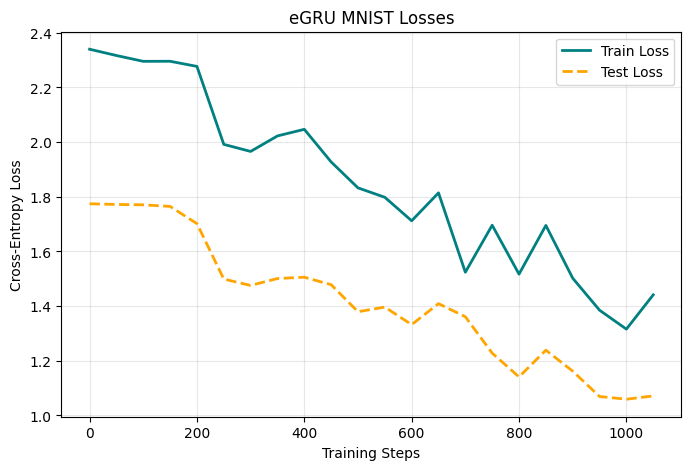

Step: 1050
Training loss: 1.4411548376083374
Validation loss: 1.0713332738631811
Accuracy measurement: 37.059294871794876


  0%|          | 0/3 [00:00<?, ?it/s]

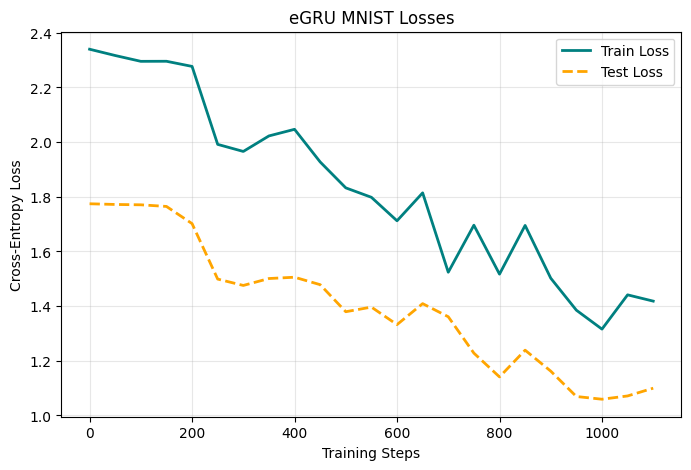

Step: 1100
Training loss: 1.4181941747665405
Validation loss: 1.0997420702225122
Accuracy measurement: 38.86217948717949


  0%|          | 0/3 [00:00<?, ?it/s]

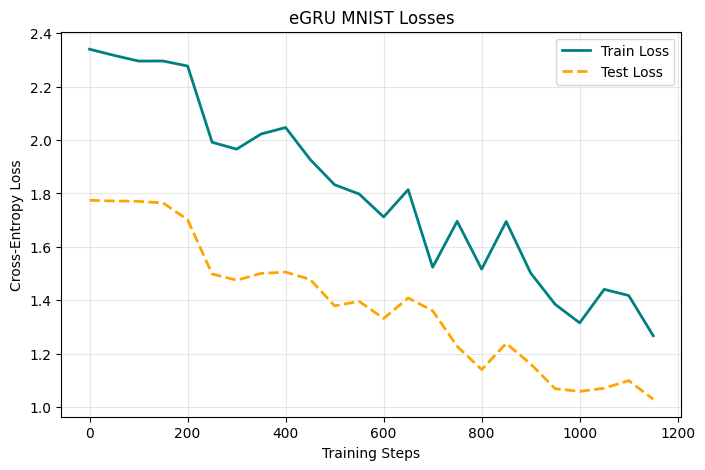

Step: 1150
Training loss: 1.267522931098938
Validation loss: 1.0301092037787805
Accuracy measurement: 42.06730769230769


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

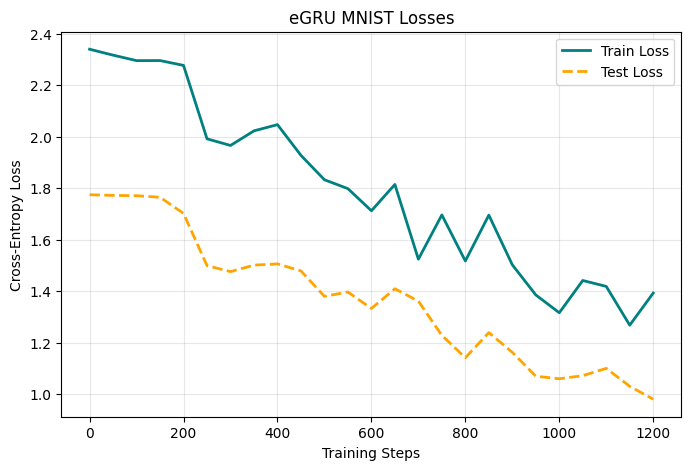

Step: 1200
Training loss: 1.3922600746154785
Validation loss: 0.9798507812695626
Accuracy measurement: 42.66826923076923


  0%|          | 0/3 [00:00<?, ?it/s]

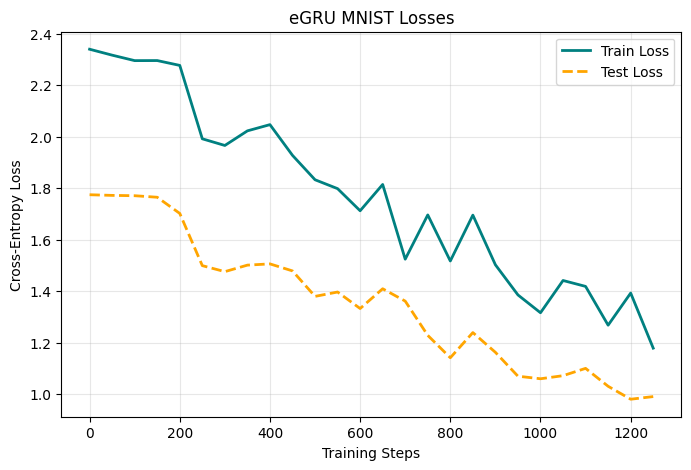

Step: 1250
Training loss: 1.1783077716827393
Validation loss: 0.9900974310361422
Accuracy measurement: 40.26442307692308


  0%|          | 0/3 [00:00<?, ?it/s]

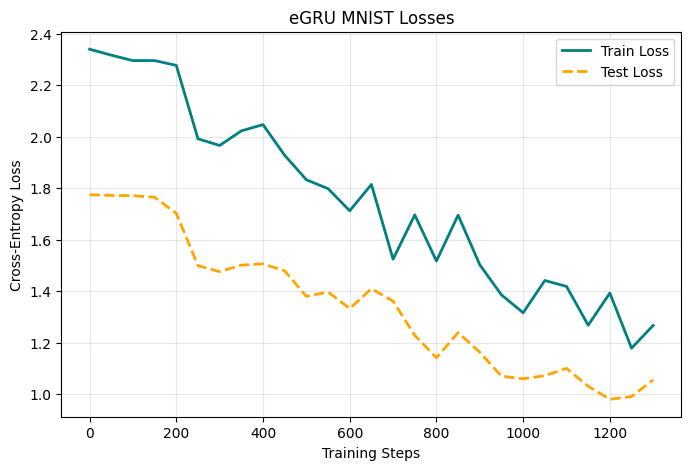

Step: 1300
Training loss: 1.2666029930114746
Validation loss: 1.0552771886189778
Accuracy measurement: 40.06410256410256


  0%|          | 0/3 [00:00<?, ?it/s]

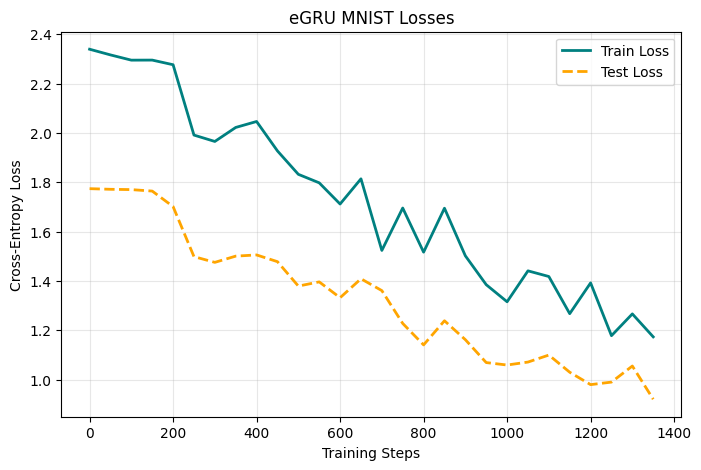

Step: 1350
Training loss: 1.1735297441482544
Validation loss: 0.9206877304957464
Accuracy measurement: 44.77163461538461


  0%|          | 0/3 [00:00<?, ?it/s]

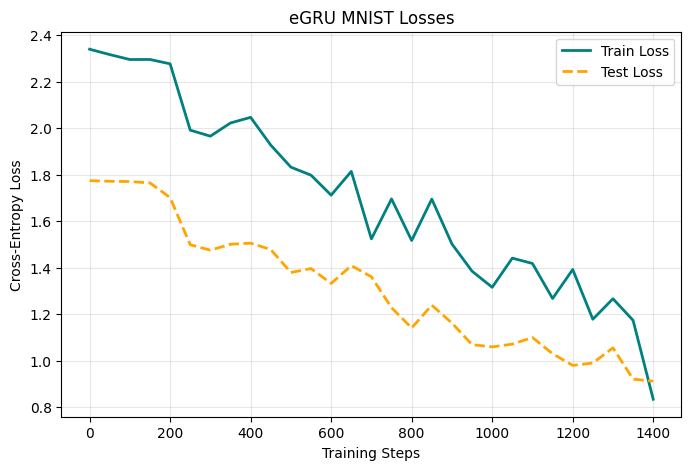

Step: 1400
Training loss: 0.8343721032142639
Validation loss: 0.9121800691653521
Accuracy measurement: 46.47435897435898


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

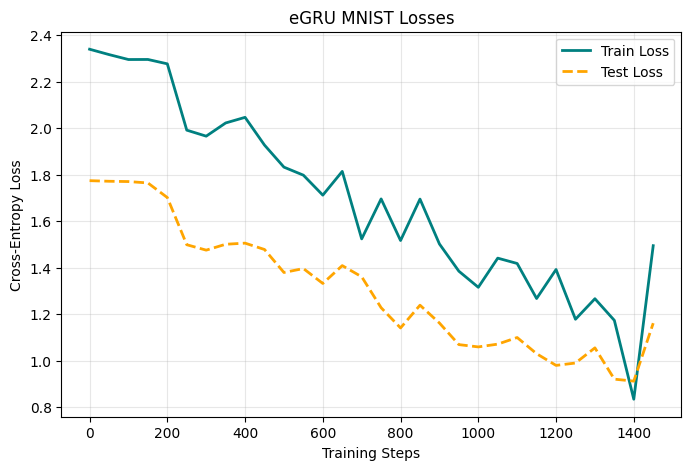

Step: 1450
Training loss: 1.4947082996368408
Validation loss: 1.1614833428309514
Accuracy measurement: 36.7588141025641


  0%|          | 0/3 [00:00<?, ?it/s]

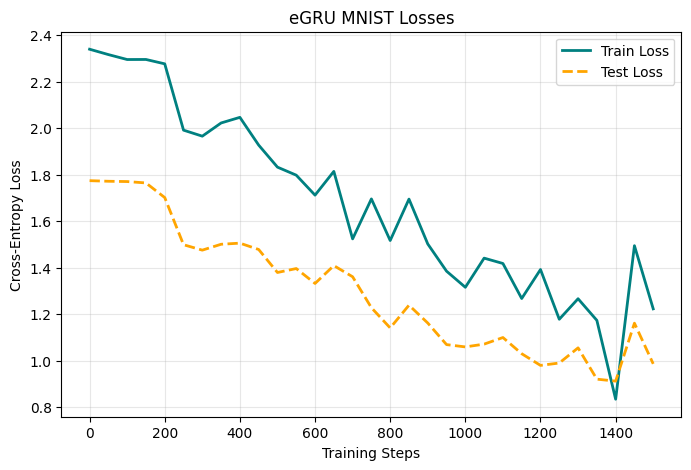

Step: 1500
Training loss: 1.2230563163757324
Validation loss: 0.9864723682403564
Accuracy measurement: 42.467948717948715


  0%|          | 0/3 [00:00<?, ?it/s]

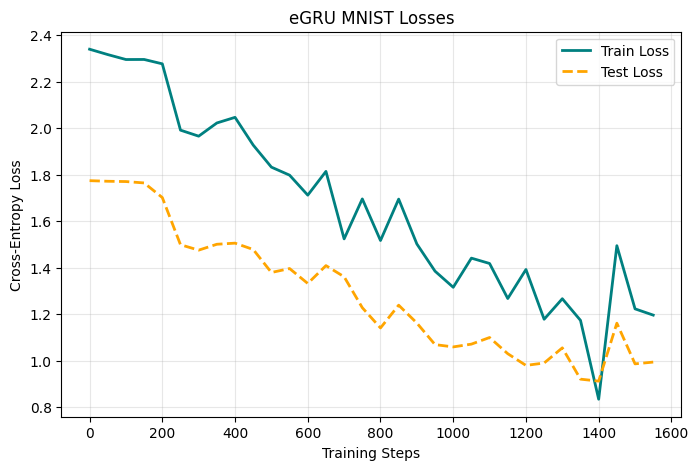

Step: 1550
Training loss: 1.196120262145996
Validation loss: 0.9940856236677904
Accuracy measurement: 43.56971153846154


  0%|          | 0/3 [00:00<?, ?it/s]

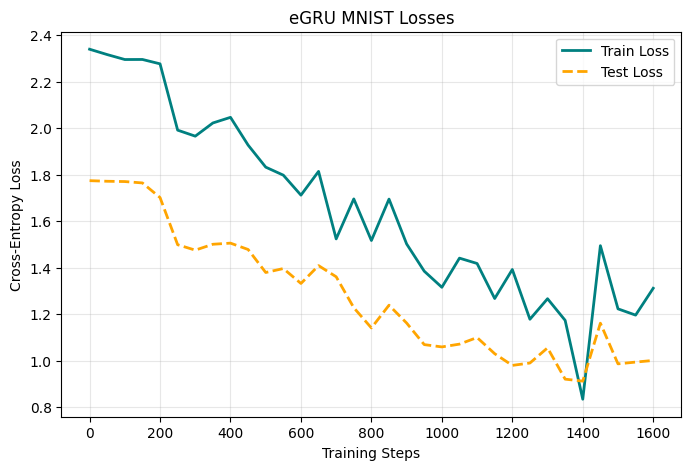

Step: 1600
Training loss: 1.3116388320922852
Validation loss: 1.0011782095982478
Accuracy measurement: 41.3661858974359


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

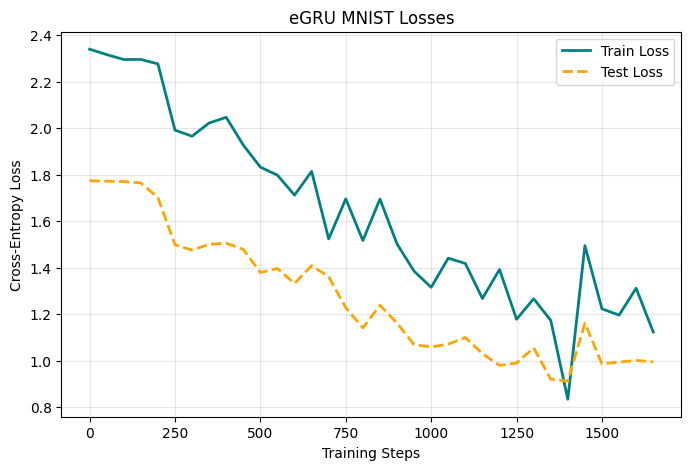

Step: 1650
Training loss: 1.1235437393188477
Validation loss: 0.9947424362867306
Accuracy measurement: 41.16586538461539


  0%|          | 0/3 [00:00<?, ?it/s]

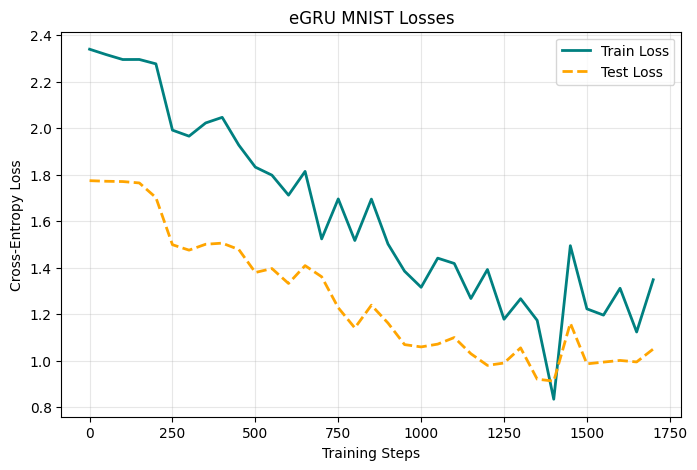

Step: 1700
Training loss: 1.3482847213745117
Validation loss: 1.0502095100207207
Accuracy measurement: 40.46474358974359


  0%|          | 0/3 [00:00<?, ?it/s]

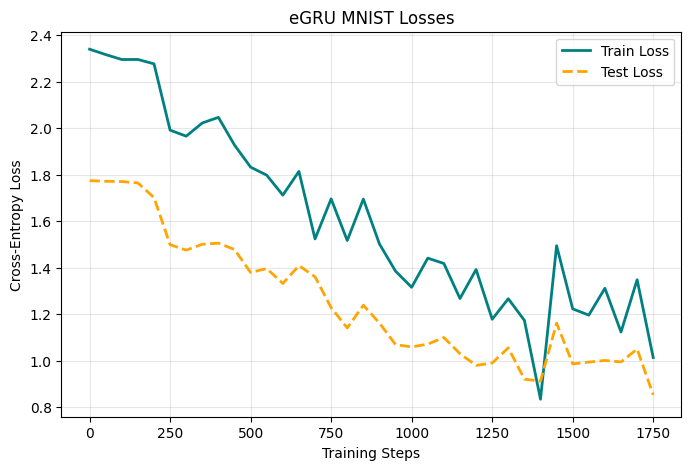

Step: 1750
Training loss: 1.0134329795837402
Validation loss: 0.8531857148194925
Accuracy measurement: 46.57451923076923


  0%|          | 0/3 [00:00<?, ?it/s]

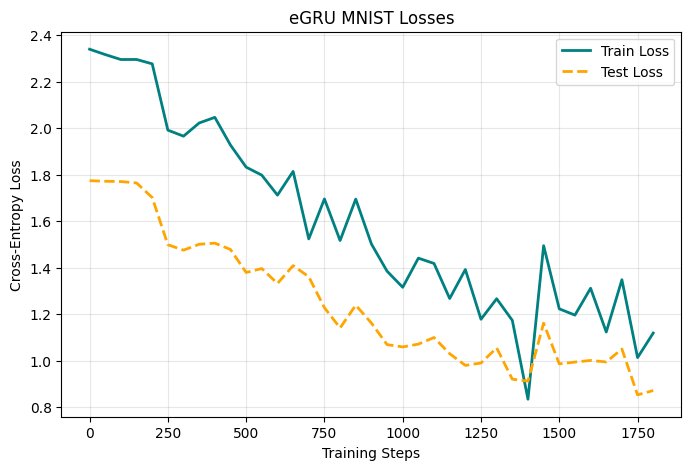

Step: 1800
Training loss: 1.1188929080963135
Validation loss: 0.8717598670568222
Accuracy measurement: 46.27403846153846


  0%|          | 0/3 [00:00<?, ?it/s]

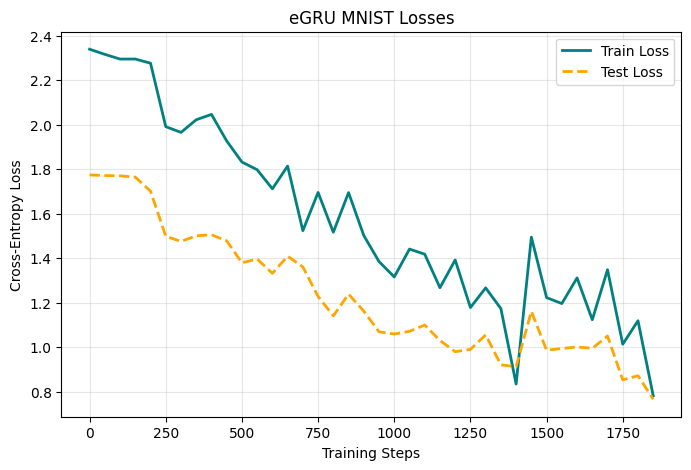

Step: 1850
Training loss: 0.7815462350845337
Validation loss: 0.766093685076787
Accuracy measurement: 53.38541666666667


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

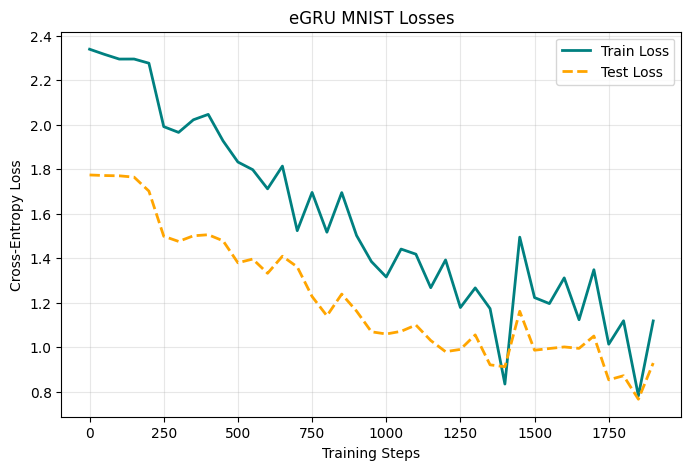

Step: 1900
Training loss: 1.1180886030197144
Validation loss: 0.9287863205640744
Accuracy measurement: 45.17227564102564


  0%|          | 0/3 [00:00<?, ?it/s]

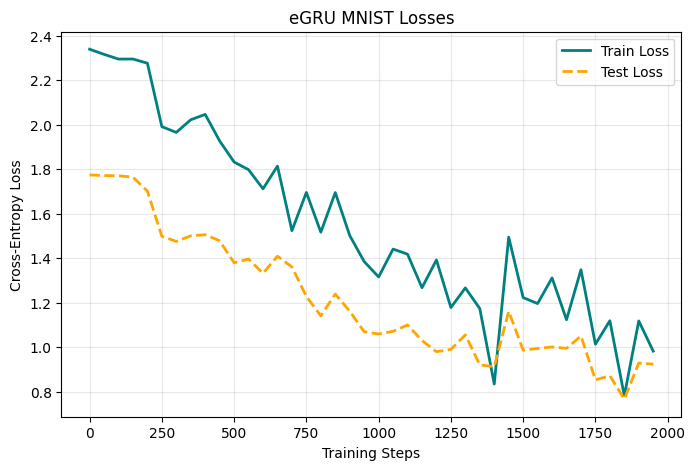

Step: 1950
Training loss: 0.9823317527770996
Validation loss: 0.9237277507781982
Accuracy measurement: 45.2724358974359


  0%|          | 0/3 [00:00<?, ?it/s]

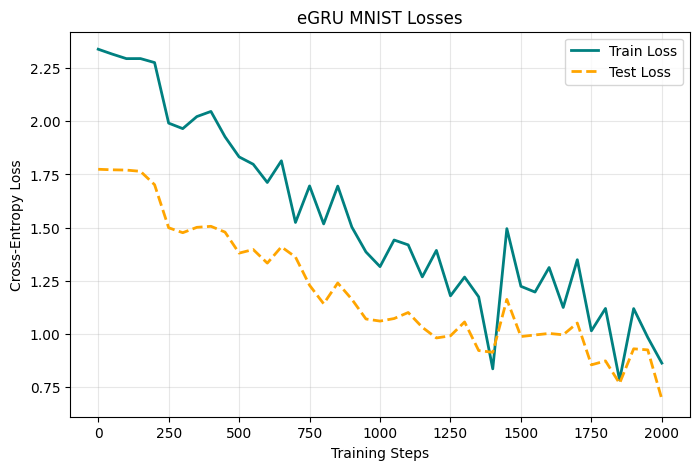

Step: 2000
Training loss: 0.8614401817321777
Validation loss: 0.6913609993763459
Accuracy measurement: 53.28525641025641


  0%|          | 0/3 [00:00<?, ?it/s]

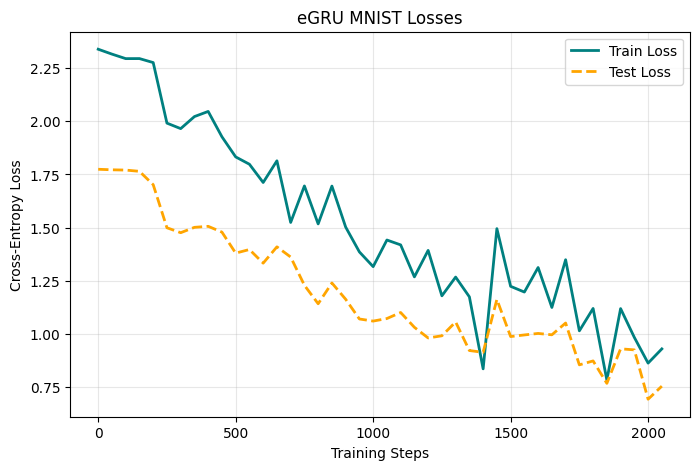

Step: 2050
Training loss: 0.9283848404884338
Validation loss: 0.7529802505786602
Accuracy measurement: 50.18028846153846


  0%|          | 0/3 [00:00<?, ?it/s]

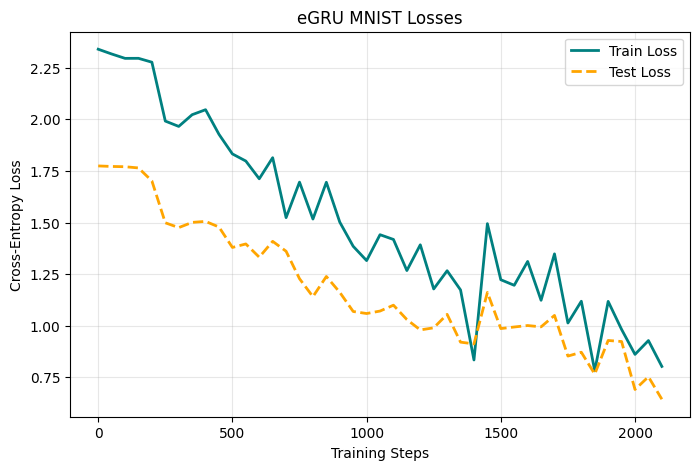

Step: 2100
Training loss: 0.8030521869659424
Validation loss: 0.6442071077151177
Accuracy measurement: 54.787660256410255


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

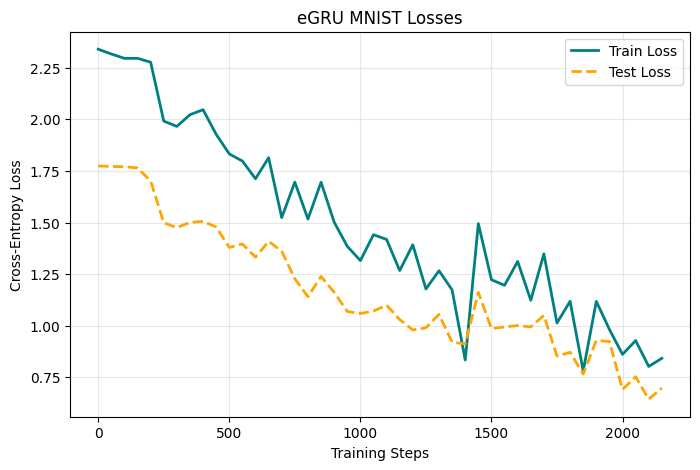

Step: 2150
Training loss: 0.842374861240387
Validation loss: 0.6982627281775842
Accuracy measurement: 54.18669871794872


  0%|          | 0/3 [00:00<?, ?it/s]

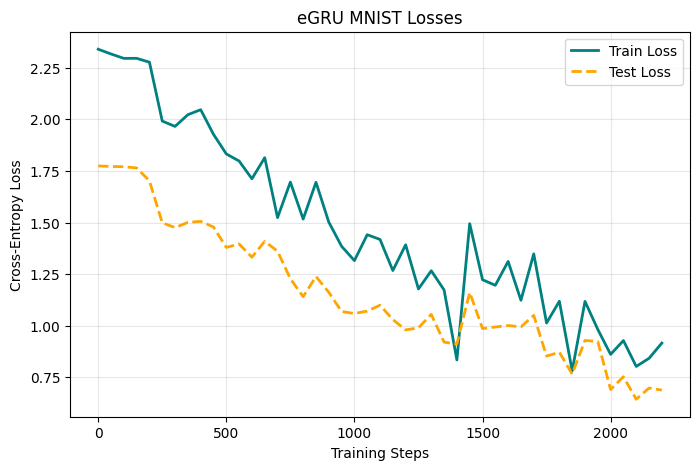

Step: 2200
Training loss: 0.9162701964378357
Validation loss: 0.6884078643260858
Accuracy measurement: 52.58413461538461


  0%|          | 0/3 [00:00<?, ?it/s]

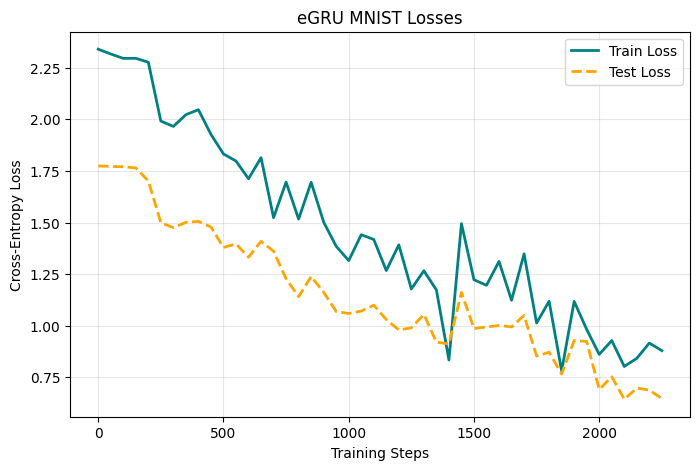

Step: 2250
Training loss: 0.8797283172607422
Validation loss: 0.6476503610610962
Accuracy measurement: 55.789262820512825


  0%|          | 0/3 [00:00<?, ?it/s]

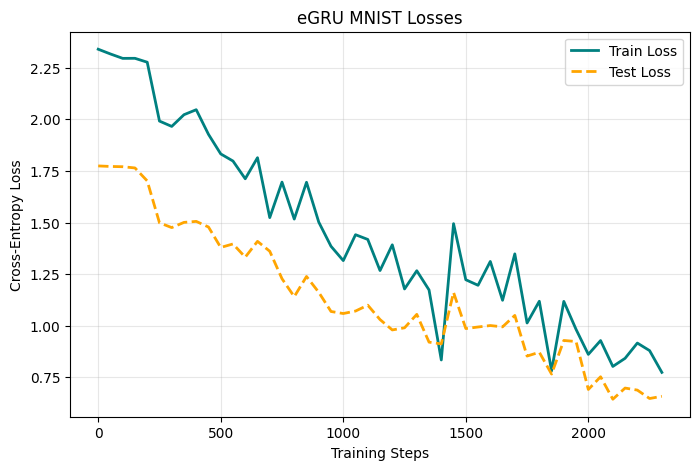

Step: 2300
Training loss: 0.7742097973823547
Validation loss: 0.6584236866388565
Accuracy measurement: 55.08814102564103


In [12]:
import custom_models_for_MNIST
import math

hid=256
lr=1e-3
epochs = 10
break_time=50
start_step =0

steps_history = []
train_history = []
test_history = []
acc_history=[]




eGRU_model = custom_models_for_MNIST.eGRU(vocab_dim=10, hid=hid, emb=1, device='cuda')
opt_eGRU = torch.optim.Adam(eGRU_model.parameters(), lr=lr)
#_ = load_model("eGRU_wikitext2_epoch_10000.pt", device='cuda', model=eGRU_model, optimizer=opt_eGRU)



for epoch in trange(10, 20):

    start_step = train_model(
        model=eGRU_model,
        model_name="eGRU",
        opt=opt_eGRU,
        training_data_batched=train_data_batched,
        training_labels_batched=train_labels_batched,
        testing_data_batched=test_data_batched,
        testing_labels_batched=test_labels_batched,
        train_loss_history=train_history,
        test_loss_history=test_history,
        acc_history=acc_history,
        start_step=start_step,
        recorded_steps=steps_history,
        break_time=break_time,
        hid=hid,
        device=device
    )


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

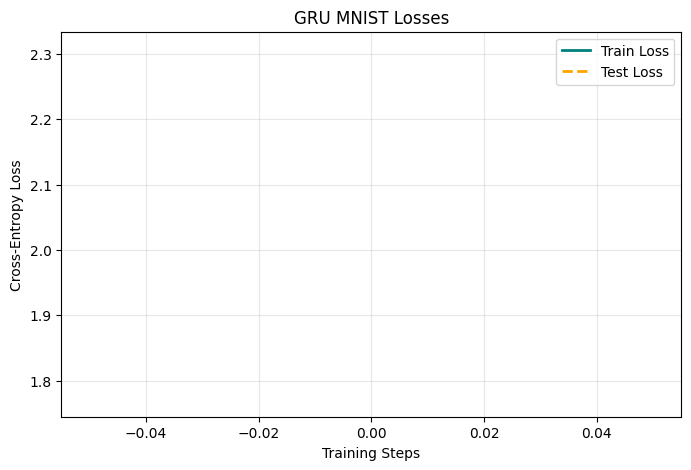

Step: 0
Training loss: 2.307161808013916
Validation loss: 1.7715631387172601
Accuracy measurement: 8.413461538461538


  0%|          | 0/3 [00:00<?, ?it/s]

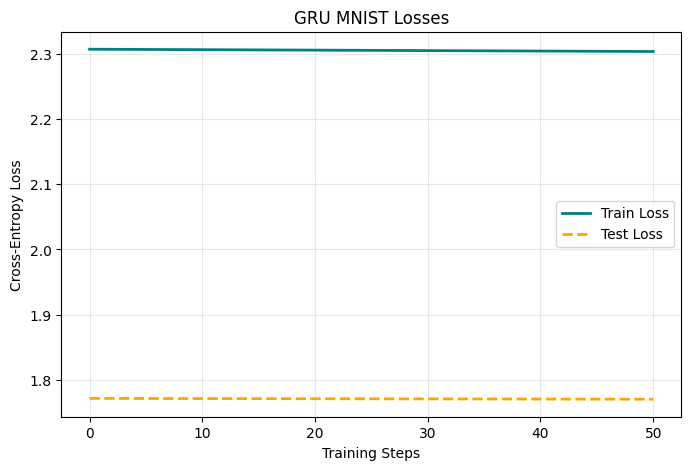

Step: 50
Training loss: 2.3036534786224365
Validation loss: 1.7703343049073832
Accuracy measurement: 9.314903846153847


  0%|          | 0/3 [00:00<?, ?it/s]

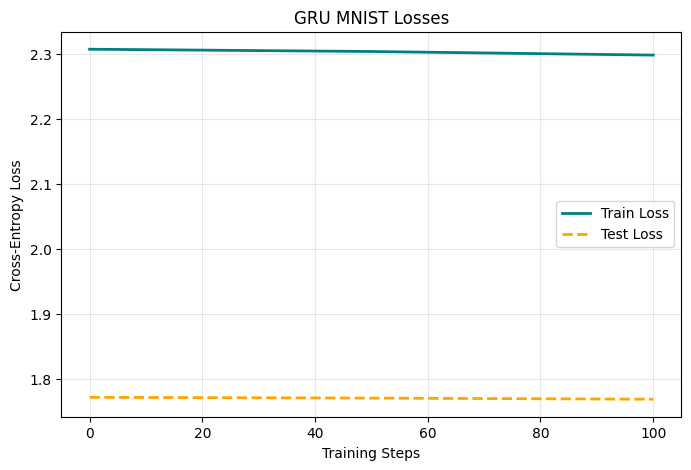

Step: 100
Training loss: 2.2981185913085938
Validation loss: 1.768628267141489
Accuracy measurement: 9.314903846153847


  0%|          | 0/3 [00:00<?, ?it/s]

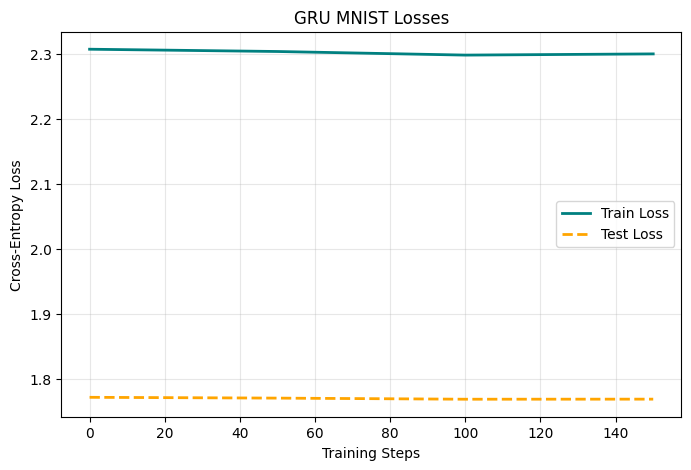

Step: 150
Training loss: 2.2999649047851562
Validation loss: 1.7687424023946128
Accuracy measurement: 9.615384615384615


  0%|          | 0/3 [00:00<?, ?it/s]

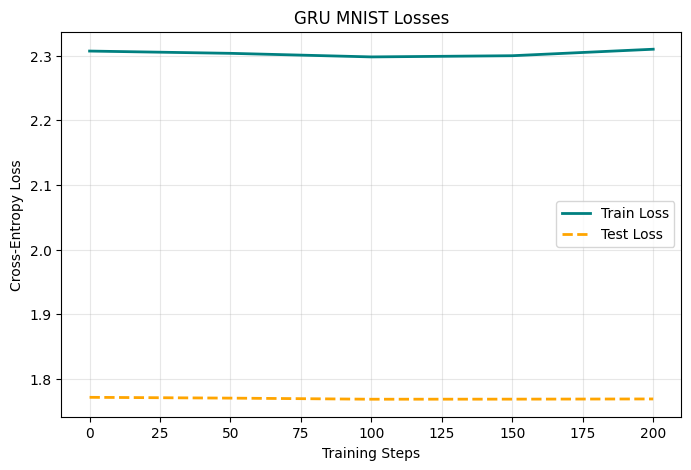

Step: 200
Training loss: 2.310011863708496
Validation loss: 1.7690430543361566
Accuracy measurement: 9.51522435897436


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

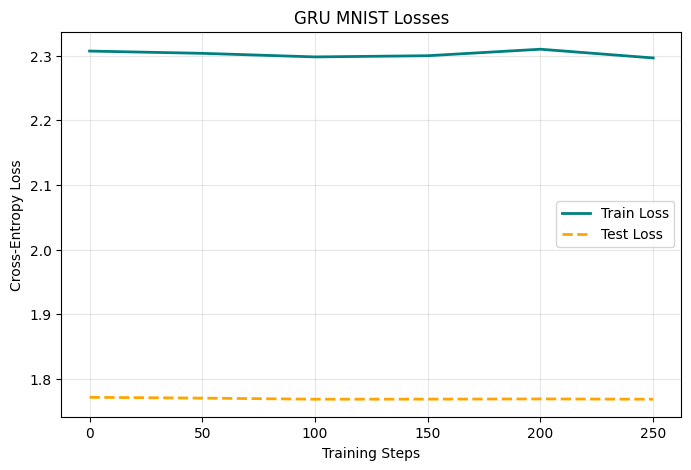

Step: 250
Training loss: 2.296478033065796
Validation loss: 1.768621297983023
Accuracy measurement: 7.712339743589744


  0%|          | 0/3 [00:00<?, ?it/s]

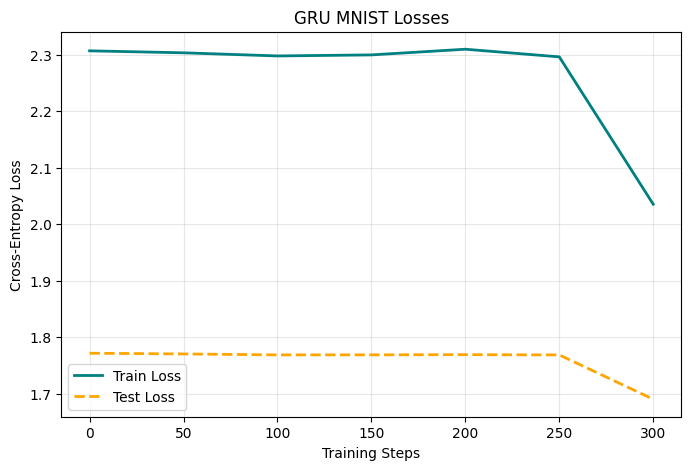

Step: 300
Training loss: 2.0354905128479004
Validation loss: 1.6901298669668345
Accuracy measurement: 12.520032051282051


  0%|          | 0/3 [00:00<?, ?it/s]

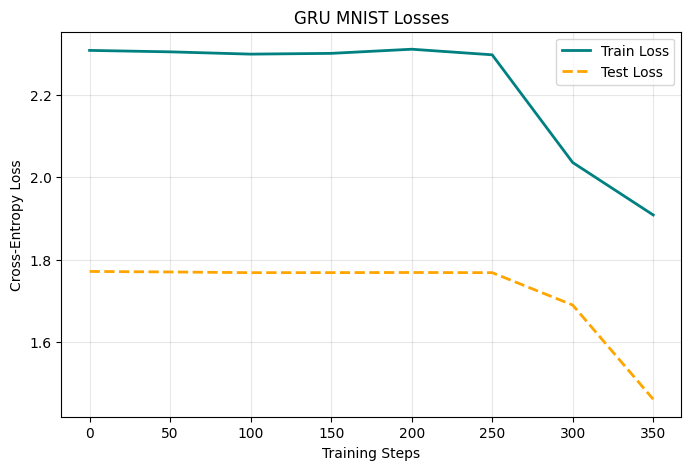

Step: 350
Training loss: 1.9084196090698242
Validation loss: 1.4619875259888477
Accuracy measurement: 17.127403846153847


  0%|          | 0/3 [00:00<?, ?it/s]

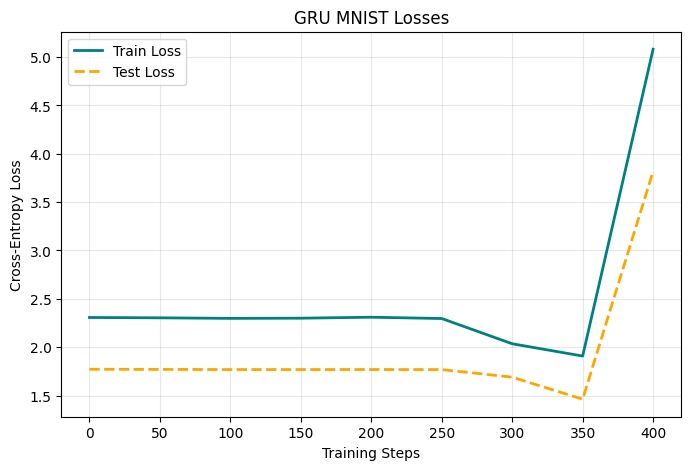

Step: 400
Training loss: 5.081242084503174
Validation loss: 3.8182232930110054
Accuracy measurement: 7.712339743589744


  0%|          | 0/3 [00:00<?, ?it/s]

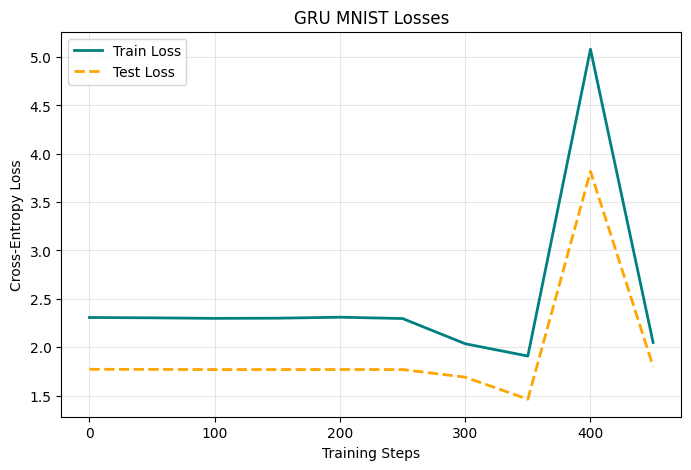

Step: 450
Training loss: 2.0488884449005127
Validation loss: 1.8017768859863281
Accuracy measurement: 14.22275641025641


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

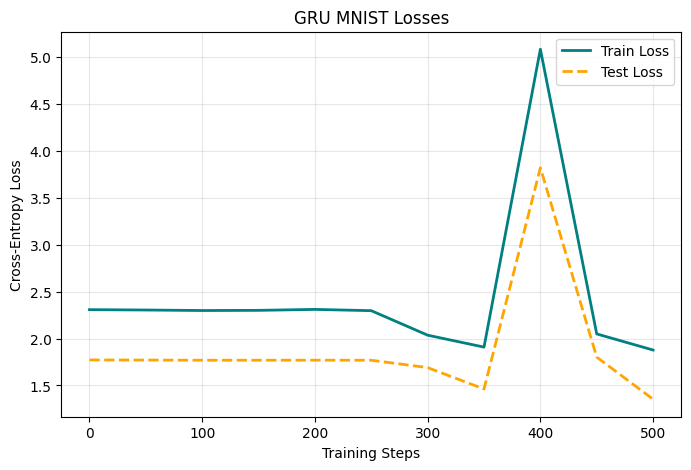

Step: 500
Training loss: 1.8772562742233276
Validation loss: 1.3533955048292112
Accuracy measurement: 23.637820512820515


  0%|          | 0/3 [00:00<?, ?it/s]

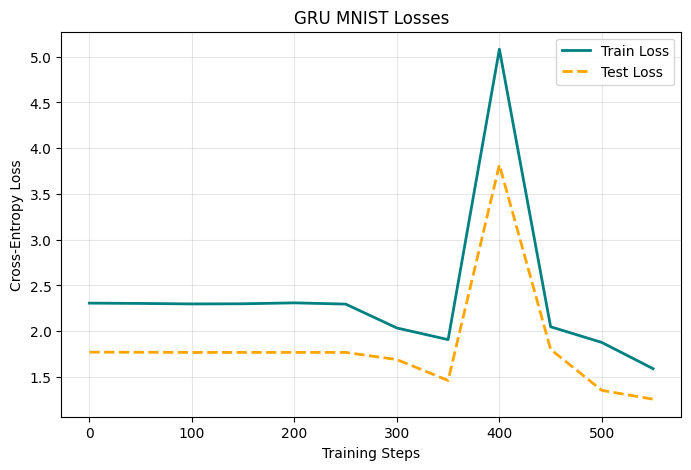

Step: 550
Training loss: 1.5905673503875732
Validation loss: 1.257090048912244
Accuracy measurement: 26.442307692307693


  0%|          | 0/3 [00:00<?, ?it/s]

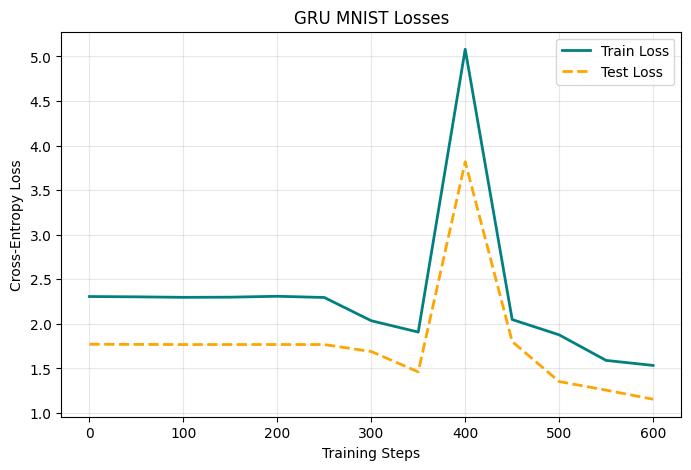

Step: 600
Training loss: 1.5343811511993408
Validation loss: 1.1552189252315423
Accuracy measurement: 29.547275641025642


  0%|          | 0/3 [00:00<?, ?it/s]

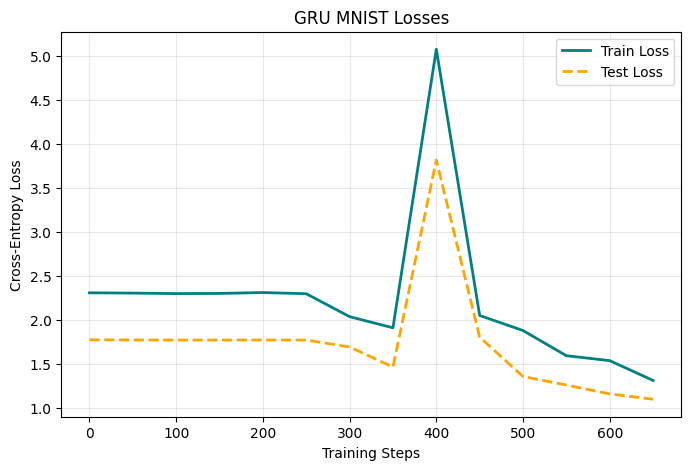

Step: 650
Training loss: 1.3086950778961182
Validation loss: 1.0950082693344507
Accuracy measurement: 32.15144230769231


  0%|          | 0/3 [00:00<?, ?it/s]

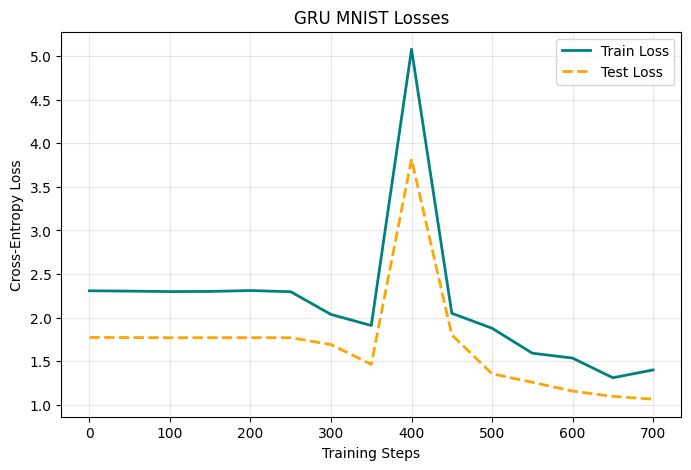

Step: 700
Training loss: 1.398416519165039
Validation loss: 1.062073493615175
Accuracy measurement: 36.35817307692308


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

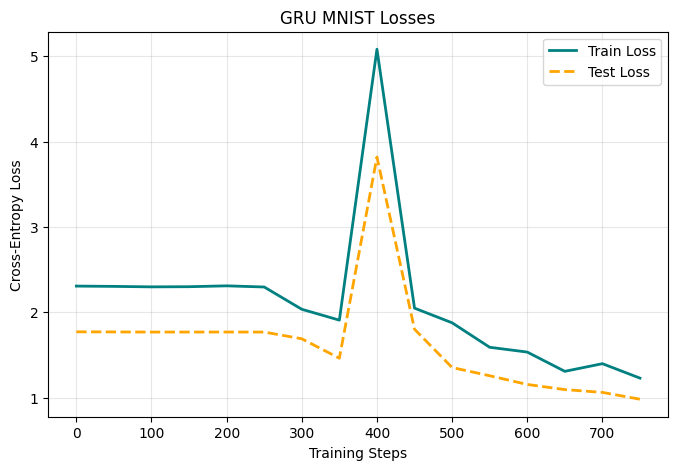

Step: 750
Training loss: 1.22926664352417
Validation loss: 0.9821670788985033
Accuracy measurement: 38.46153846153846


  0%|          | 0/3 [00:00<?, ?it/s]

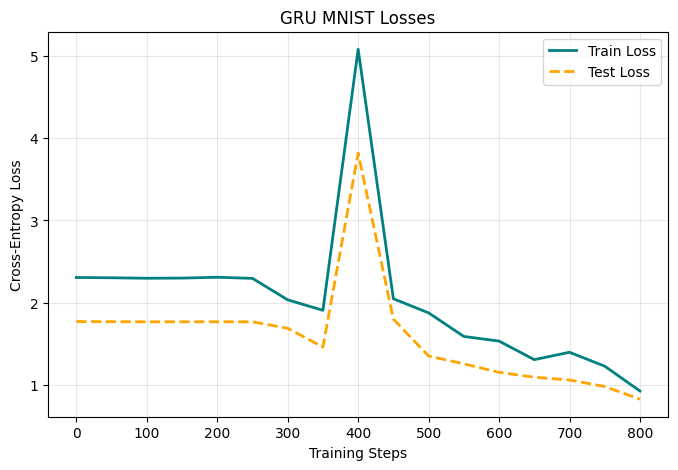

Step: 800
Training loss: 0.9274404644966125
Validation loss: 0.8278922851269062
Accuracy measurement: 45.97355769230769


  0%|          | 0/3 [00:00<?, ?it/s]

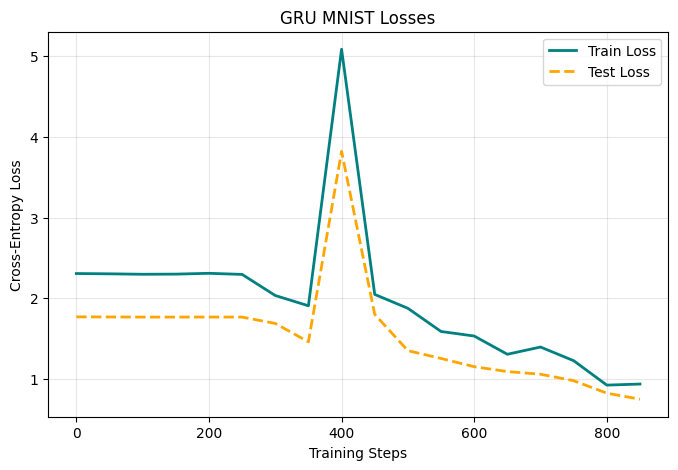

Step: 850
Training loss: 0.9405418038368225
Validation loss: 0.7529045985295223
Accuracy measurement: 49.1786858974359


  0%|          | 0/3 [00:00<?, ?it/s]

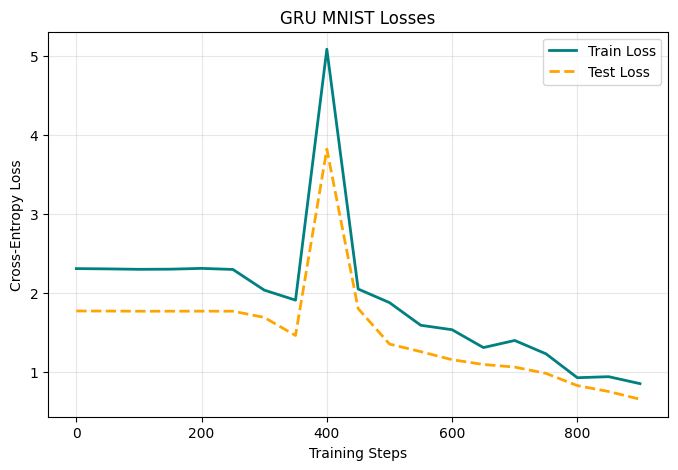

Step: 900
Training loss: 0.8525892496109009
Validation loss: 0.6555635501176883
Accuracy measurement: 52.98477564102564


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

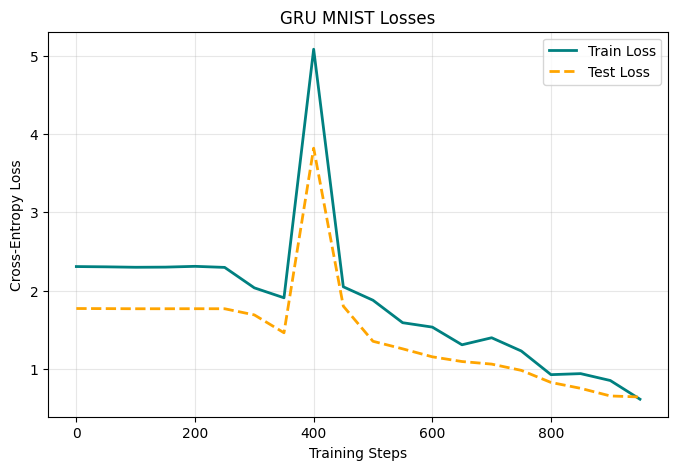

Step: 950
Training loss: 0.6138569712638855
Validation loss: 0.6426018934983474
Accuracy measurement: 53.58573717948718


  0%|          | 0/3 [00:00<?, ?it/s]

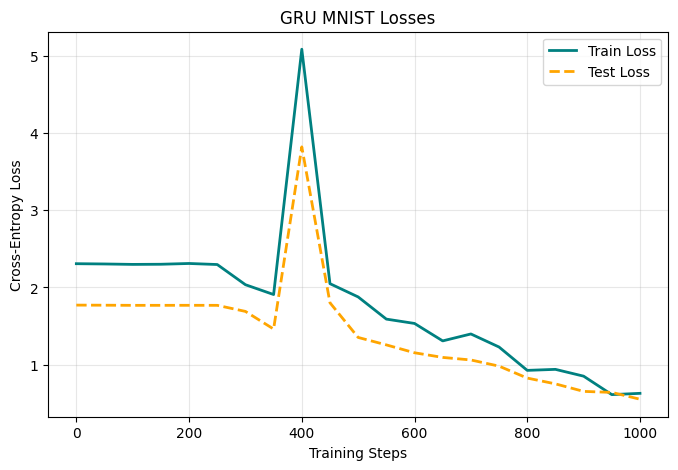

Step: 1000
Training loss: 0.6303495168685913
Validation loss: 0.5543280411989261
Accuracy measurement: 56.08974358974359


  0%|          | 0/3 [00:00<?, ?it/s]

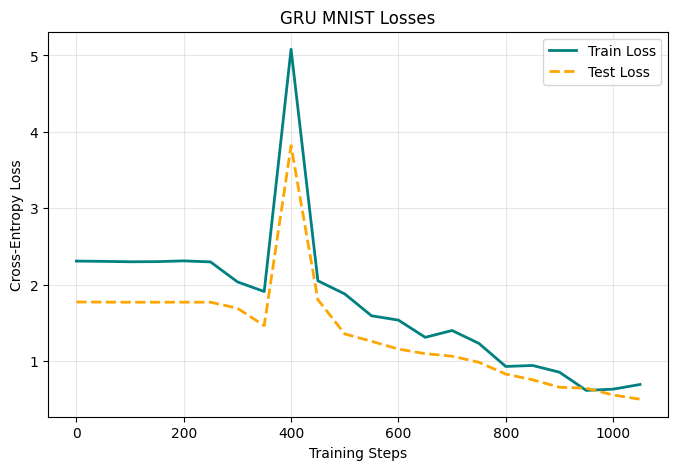

Step: 1050
Training loss: 0.6913922429084778
Validation loss: 0.4985199983303364
Accuracy measurement: 58.09294871794872


  0%|          | 0/3 [00:00<?, ?it/s]

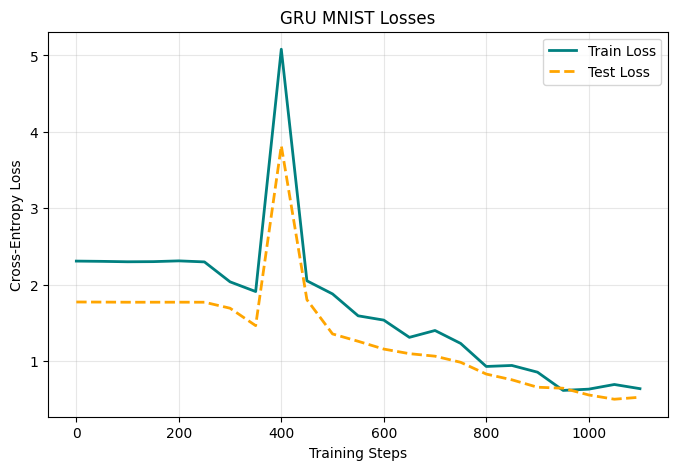

Step: 1100
Training loss: 0.6367404460906982
Validation loss: 0.5247213443120321
Accuracy measurement: 58.09294871794872


  0%|          | 0/3 [00:00<?, ?it/s]

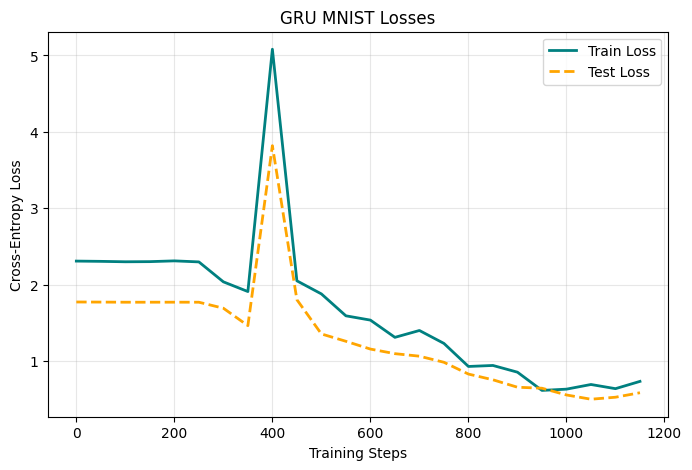

Step: 1150
Training loss: 0.7321024537086487
Validation loss: 0.5835218001634647
Accuracy measurement: 55.188301282051285


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

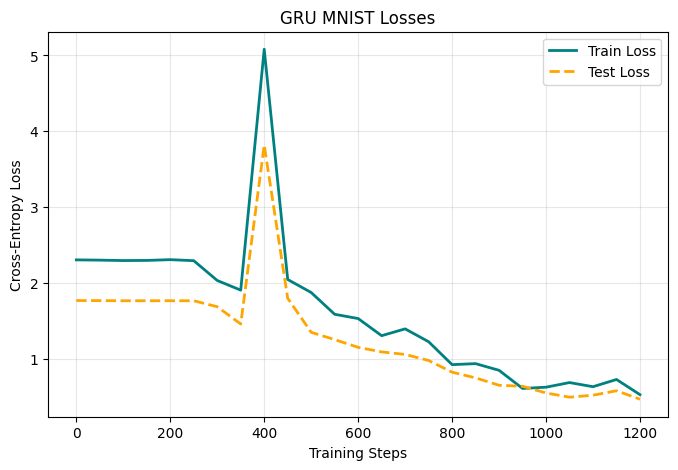

Step: 1200
Training loss: 0.5322442054748535
Validation loss: 0.4719668779617701
Accuracy measurement: 60.09615384615385


  0%|          | 0/3 [00:00<?, ?it/s]

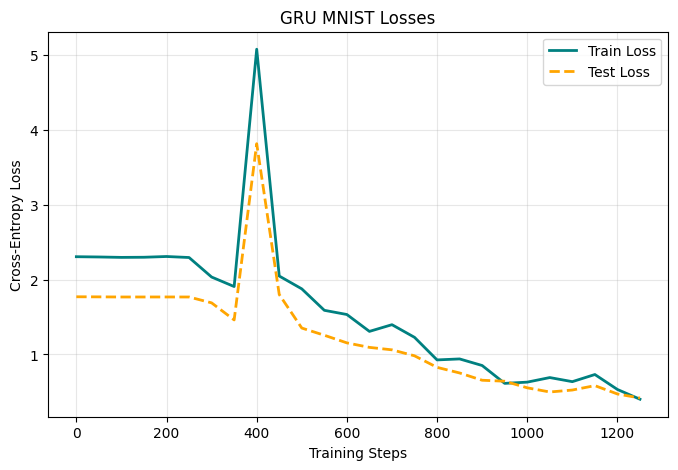

Step: 1250
Training loss: 0.40188032388687134
Validation loss: 0.41803417297510004
Accuracy measurement: 61.89903846153846


  0%|          | 0/3 [00:00<?, ?it/s]

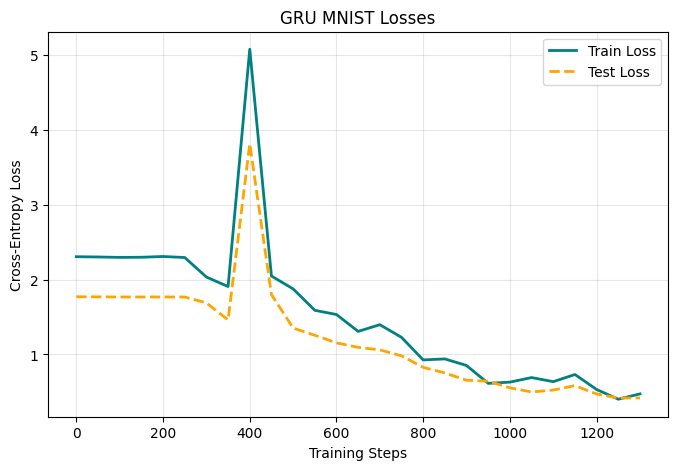

Step: 1300
Training loss: 0.4730512201786041
Validation loss: 0.41864792505900067
Accuracy measurement: 59.79567307692308


  0%|          | 0/3 [00:00<?, ?it/s]

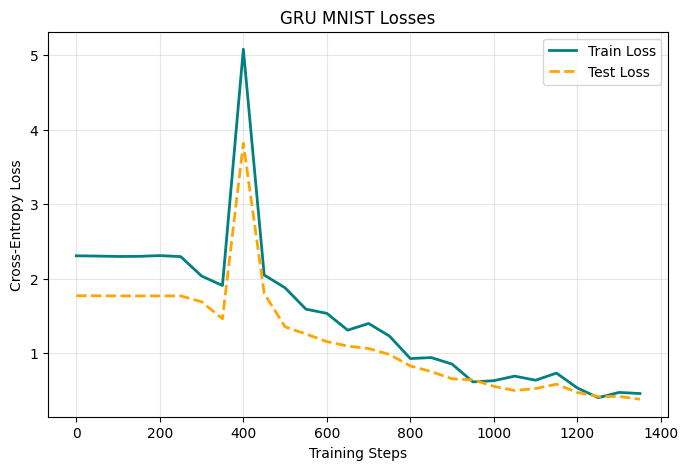

Step: 1350
Training loss: 0.45764392614364624
Validation loss: 0.38138935963312787
Accuracy measurement: 63.50160256410256


  0%|          | 0/3 [00:00<?, ?it/s]

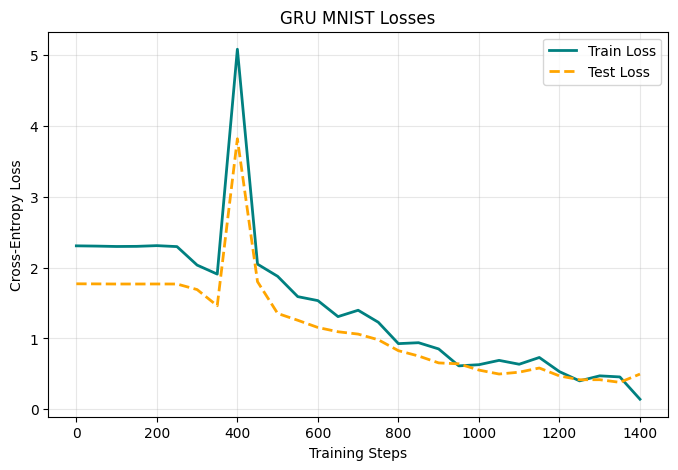

Step: 1400
Training loss: 0.14317364990711212
Validation loss: 0.49800875859382826
Accuracy measurement: 58.59375


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

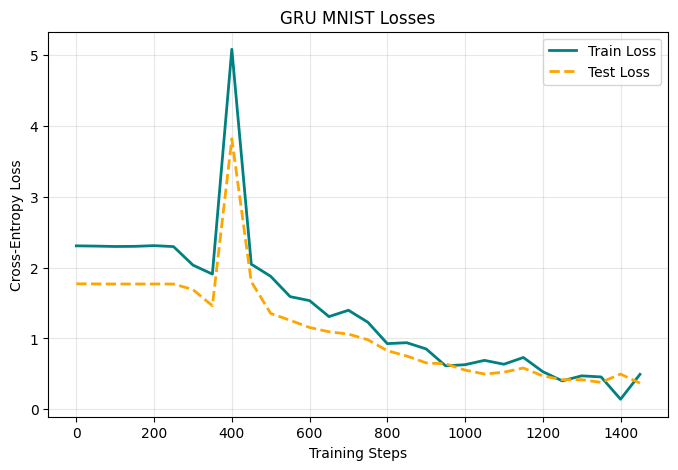

Step: 1450
Training loss: 0.49454331398010254
Validation loss: 0.36976208289464313
Accuracy measurement: 63.000801282051285


  0%|          | 0/3 [00:00<?, ?it/s]

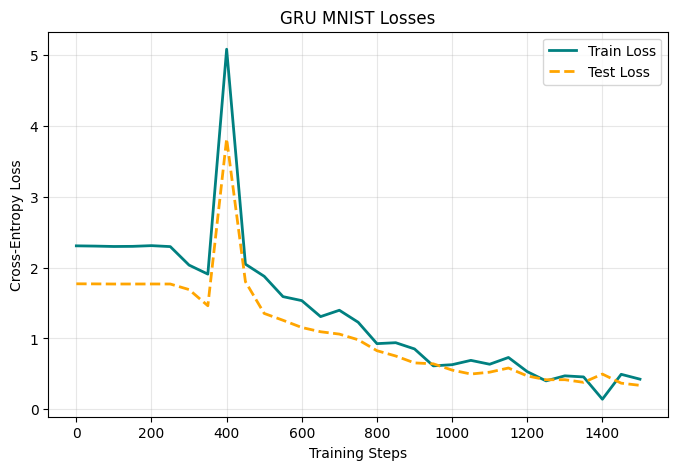

Step: 1500
Training loss: 0.42610105872154236
Validation loss: 0.33872854251127976
Accuracy measurement: 64.30288461538461


  0%|          | 0/3 [00:00<?, ?it/s]

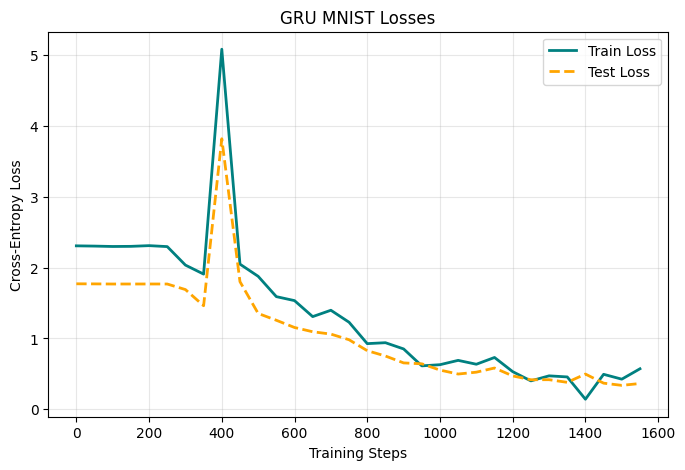

Step: 1550
Training loss: 0.5728416442871094
Validation loss: 0.3649509946505229
Accuracy measurement: 61.89903846153846


  0%|          | 0/3 [00:00<?, ?it/s]

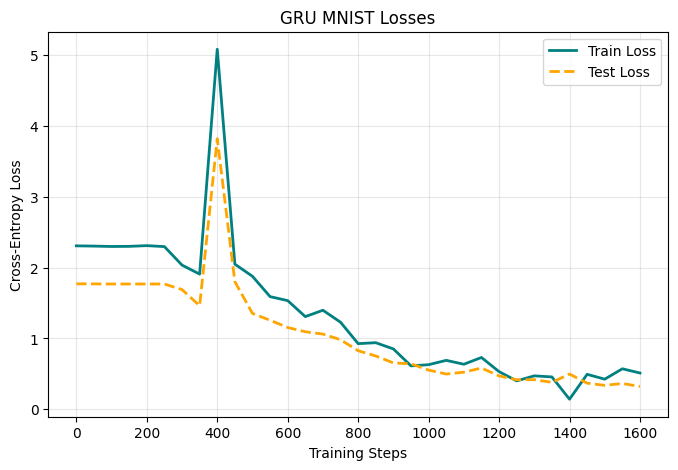

Step: 1600
Training loss: 0.5128340125083923
Validation loss: 0.3233674321419154
Accuracy measurement: 64.20272435897436


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

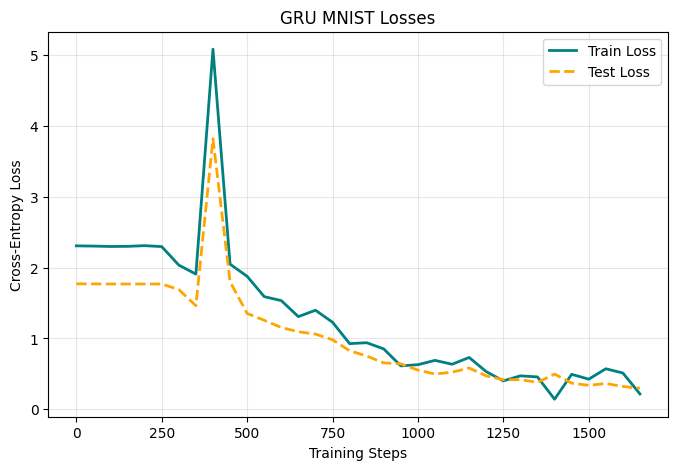

Step: 1650
Training loss: 0.21733154356479645
Validation loss: 0.29856201929923815
Accuracy measurement: 64.90384615384616


  0%|          | 0/3 [00:00<?, ?it/s]

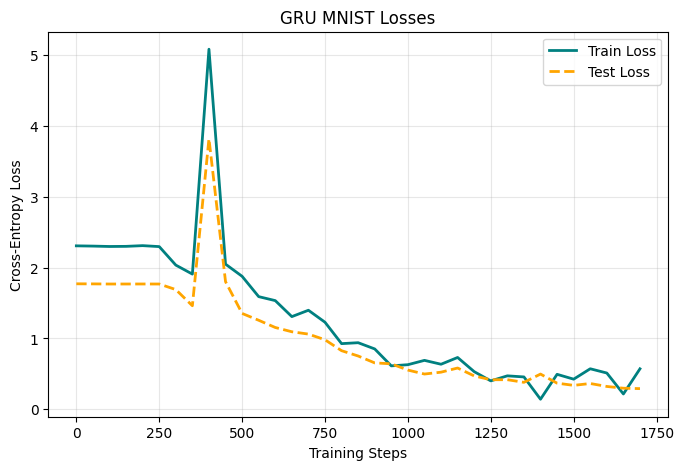

Step: 1700
Training loss: 0.5724605321884155
Validation loss: 0.2926145761440962
Accuracy measurement: 65.60496794871796


  0%|          | 0/3 [00:00<?, ?it/s]

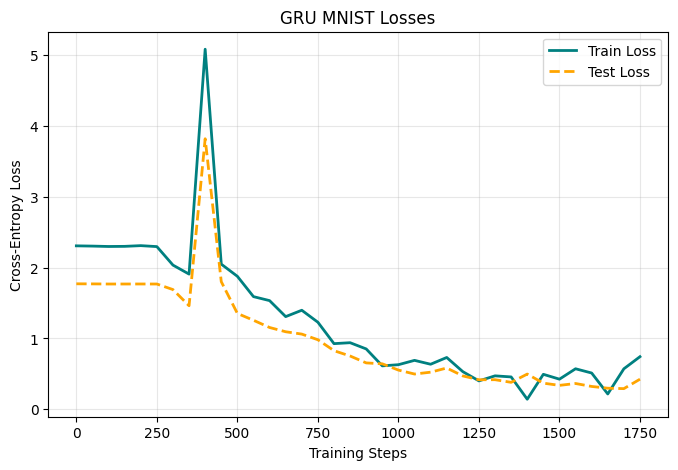

Step: 1750
Training loss: 0.7432906031608582
Validation loss: 0.4257379281215179
Accuracy measurement: 60.496794871794876


  0%|          | 0/3 [00:00<?, ?it/s]

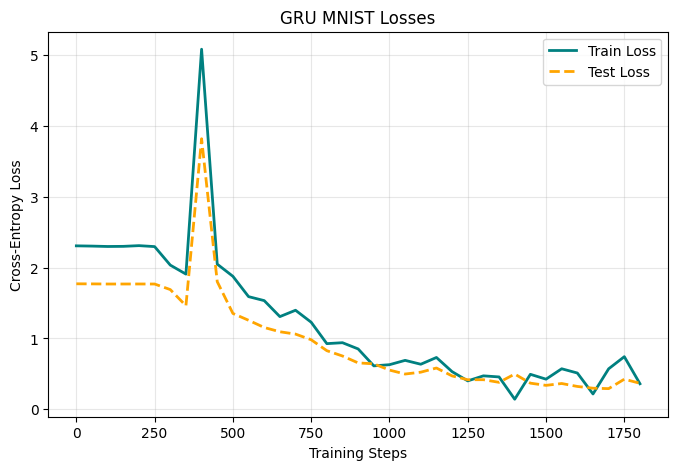

Step: 1800
Training loss: 0.3612421154975891
Validation loss: 0.3680320122303107
Accuracy measurement: 63.30128205128205


  0%|          | 0/3 [00:00<?, ?it/s]

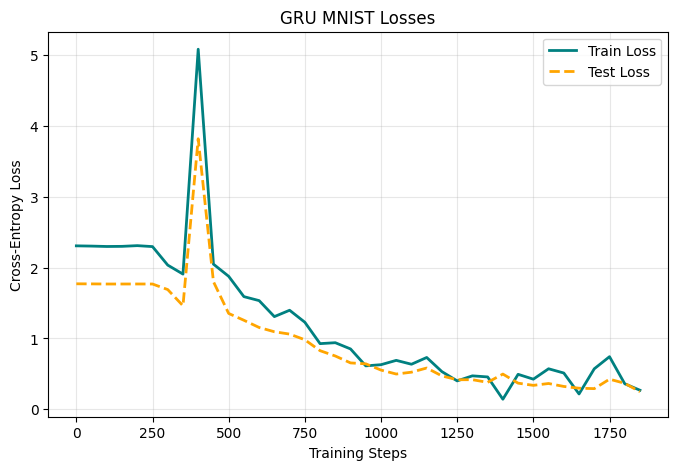

Step: 1850
Training loss: 0.2701649069786072
Validation loss: 0.2487219755466168
Accuracy measurement: 67.90865384615385


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

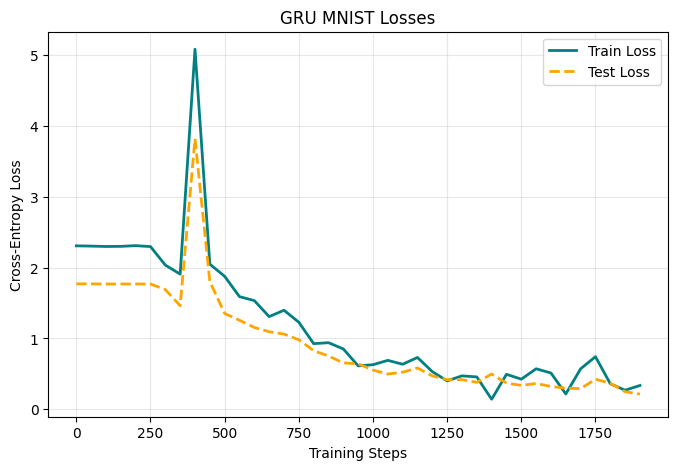

Step: 1900
Training loss: 0.33704155683517456
Validation loss: 0.21554481906768605
Accuracy measurement: 68.7099358974359


  0%|          | 0/3 [00:00<?, ?it/s]

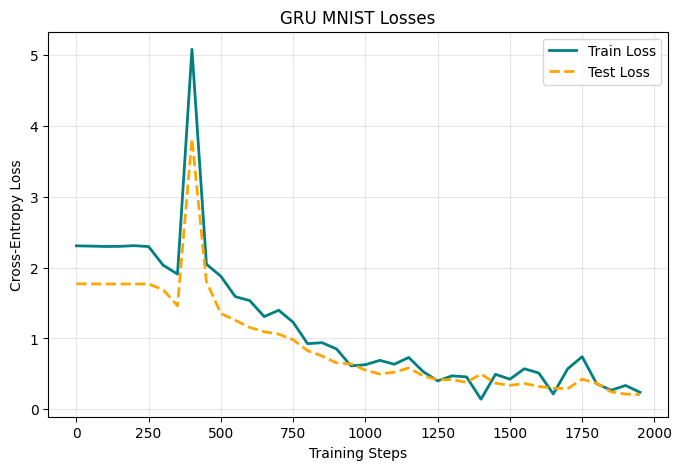

Step: 1950
Training loss: 0.24140200018882751
Validation loss: 0.20864403782746732
Accuracy measurement: 69.31089743589743


  0%|          | 0/3 [00:00<?, ?it/s]

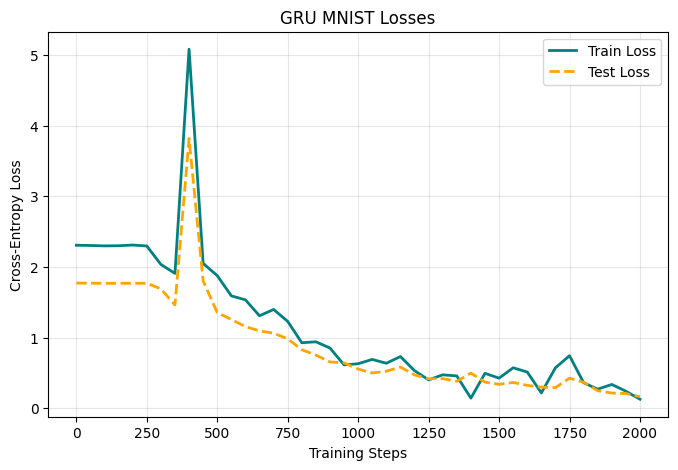

Step: 2000
Training loss: 0.12788978219032288
Validation loss: 0.16352612238663894
Accuracy measurement: 71.9150641025641


  0%|          | 0/3 [00:00<?, ?it/s]

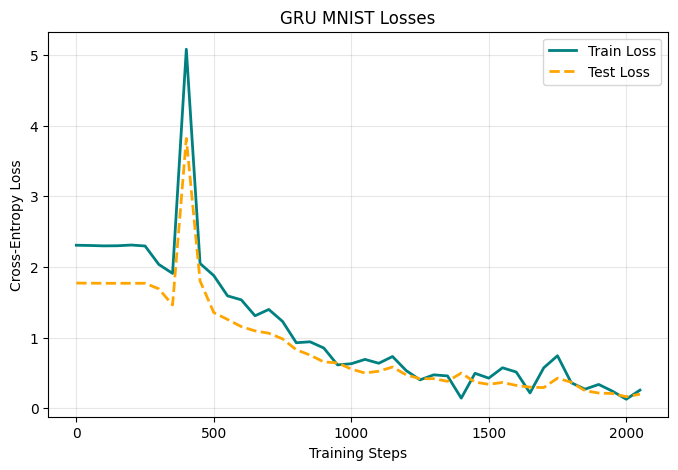

Step: 2050
Training loss: 0.2565595209598541
Validation loss: 0.19885486517197046
Accuracy measurement: 70.71314102564102


  0%|          | 0/3 [00:00<?, ?it/s]

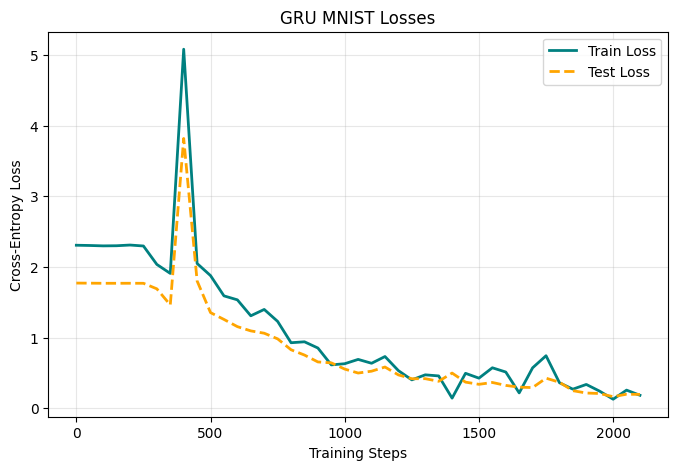

Step: 2100
Training loss: 0.18384669721126556
Validation loss: 0.19588449444526282
Accuracy measurement: 71.31410256410257


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

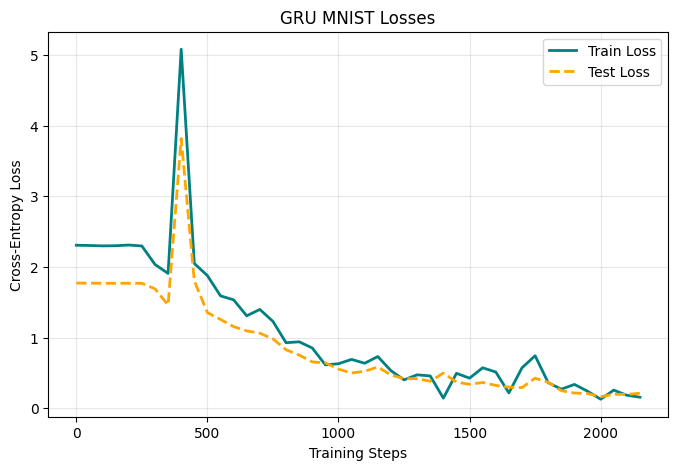

Step: 2150
Training loss: 0.15637221932411194
Validation loss: 0.21227852274210027
Accuracy measurement: 71.0136217948718


  0%|          | 0/3 [00:00<?, ?it/s]

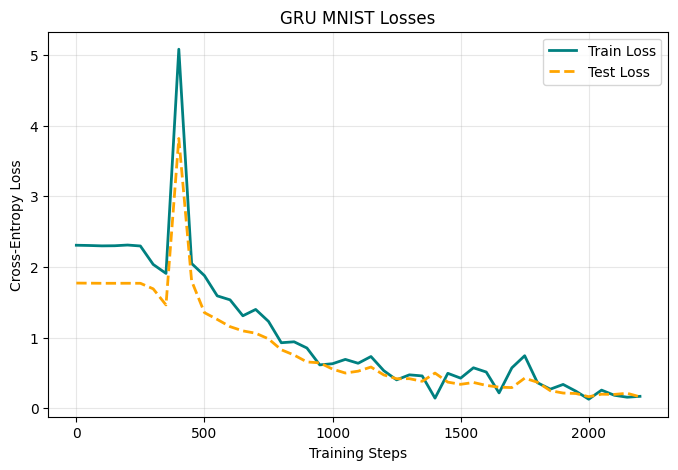

Step: 2200
Training loss: 0.16860276460647583
Validation loss: 0.16160539709604704
Accuracy measurement: 72.41586538461539


  0%|          | 0/3 [00:00<?, ?it/s]

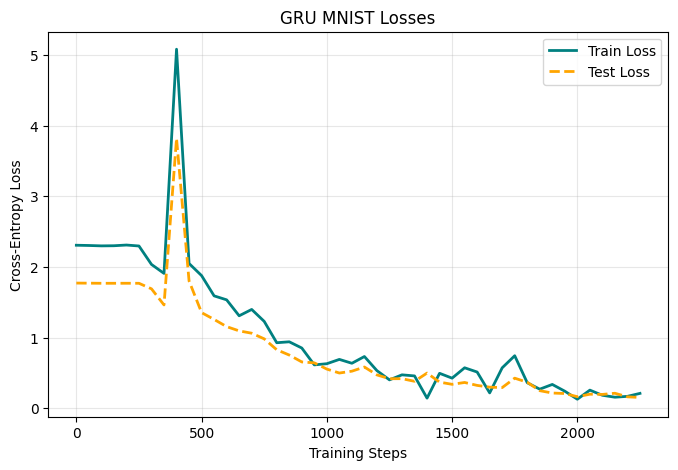

Step: 2250
Training loss: 0.21048752963542938
Validation loss: 0.15304936048312065
Accuracy measurement: 72.31570512820512


  0%|          | 0/3 [00:00<?, ?it/s]

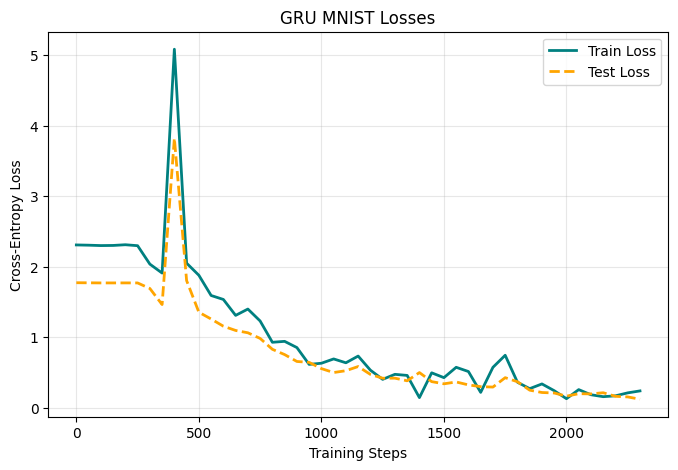

Step: 2300
Training loss: 0.2381555736064911
Validation loss: 0.12033770481745402
Accuracy measurement: 73.3173076923077


In [13]:
import custom_models_for_MNIST
import math

hid=256
lr=1e-3
epochs = 10
break_time=50
start_step =0

steps_history = []
train_history = []
test_history = []
acc_history=[]




GRU_model = custom_models_for_MNIST.GRU_LM(vocab_dim=10, hid=hid, emb=1, device='cuda')
opt_GRU = torch.optim.Adam(GRU_model.parameters(), lr=lr)
#_ = load_model("eGRU_wikitext2_epoch_10000.pt", device='cuda', model=eGRU_model, optimizer=opt_eGRU)



for epoch in trange(10, 20):

    start_step = train_model(
        model=GRU_model,
        model_name="GRU",
        opt=opt_GRU,
        training_data_batched=train_data_batched,
        training_labels_batched=train_labels_batched,
        testing_data_batched=test_data_batched,
        testing_labels_batched=test_labels_batched,
        train_loss_history=train_history,
        test_loss_history=test_history,
        acc_history=acc_history,
        start_step=start_step,
        recorded_steps=steps_history,
        break_time=break_time,
        hid=hid,
        device=device
    )


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

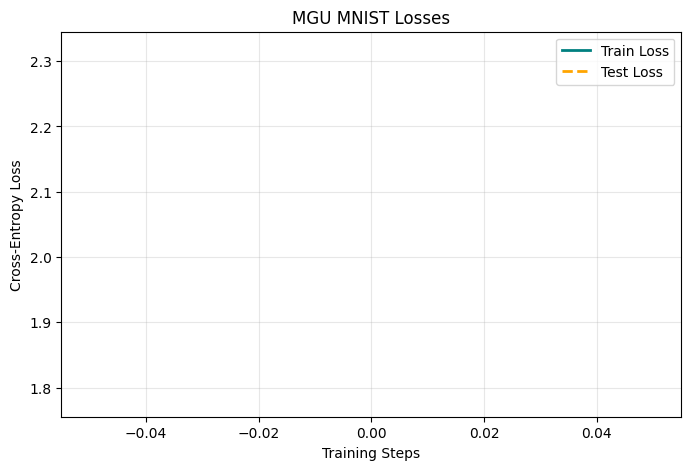

Step: 0
Training loss: 2.318268060684204
Validation loss: 1.7823517016875439
Accuracy measurement: 9.314903846153847


  0%|          | 0/3 [00:00<?, ?it/s]

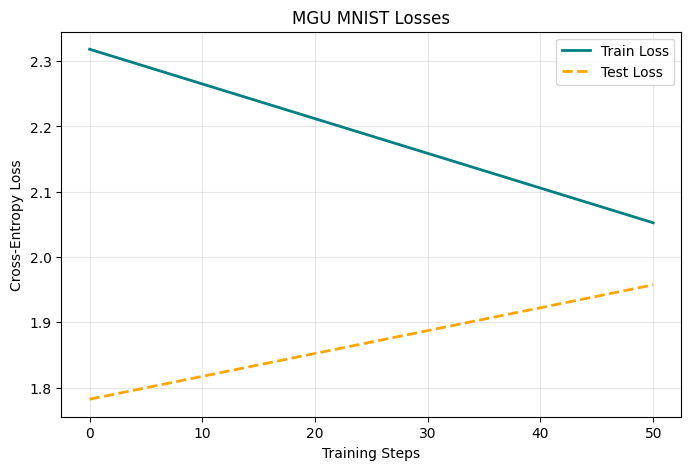

Step: 50
Training loss: 2.052504539489746
Validation loss: 1.9574710650321765
Accuracy measurement: 8.213141025641026


  0%|          | 0/3 [00:00<?, ?it/s]

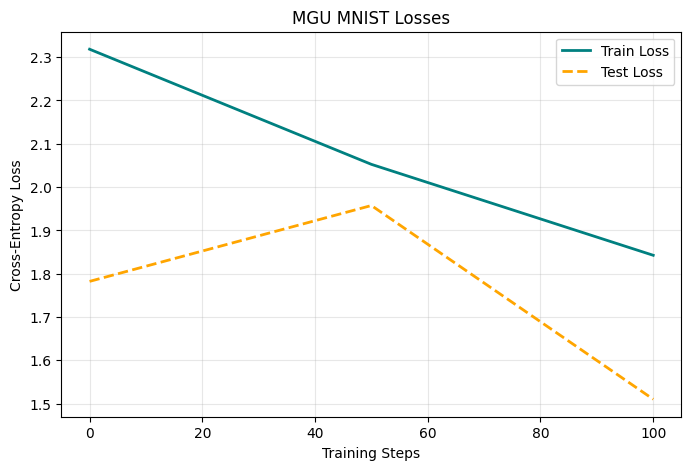

Step: 100
Training loss: 1.8425949811935425
Validation loss: 1.510319098448142
Accuracy measurement: 18.42948717948718


  0%|          | 0/3 [00:00<?, ?it/s]

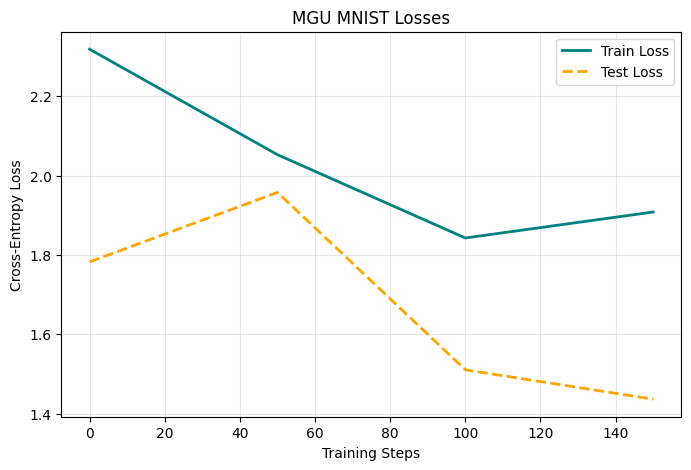

Step: 150
Training loss: 1.9080384969711304
Validation loss: 1.4362658598484137
Accuracy measurement: 18.830128205128204


  0%|          | 0/3 [00:00<?, ?it/s]

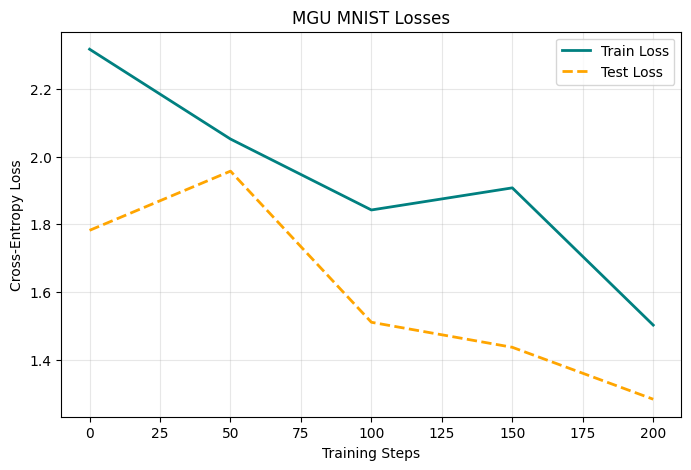

Step: 200
Training loss: 1.5019601583480835
Validation loss: 1.2826122687413142
Accuracy measurement: 22.235576923076923


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

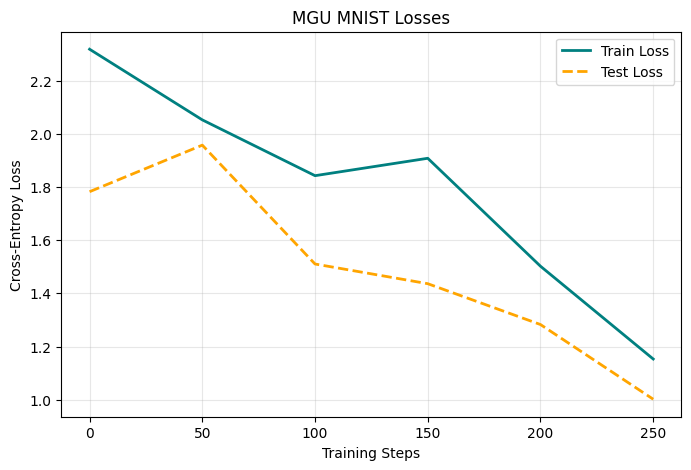

Step: 250
Training loss: 1.1529585123062134
Validation loss: 1.0017048395597017
Accuracy measurement: 37.760416666666664


  0%|          | 0/3 [00:00<?, ?it/s]

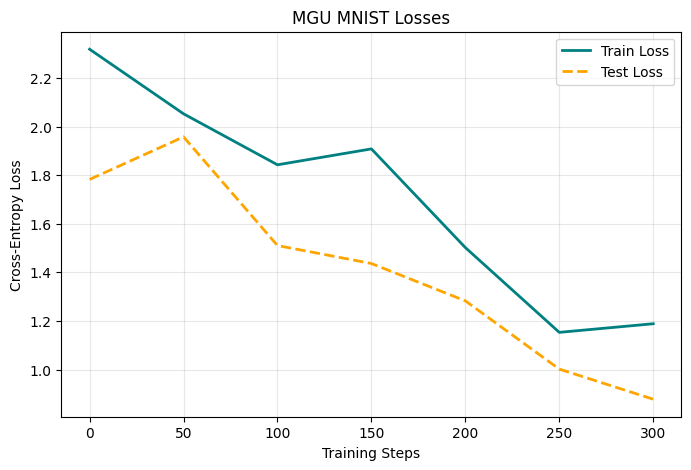

Step: 300
Training loss: 1.1884371042251587
Validation loss: 0.8777828094286797
Accuracy measurement: 42.267628205128204


  0%|          | 0/3 [00:00<?, ?it/s]

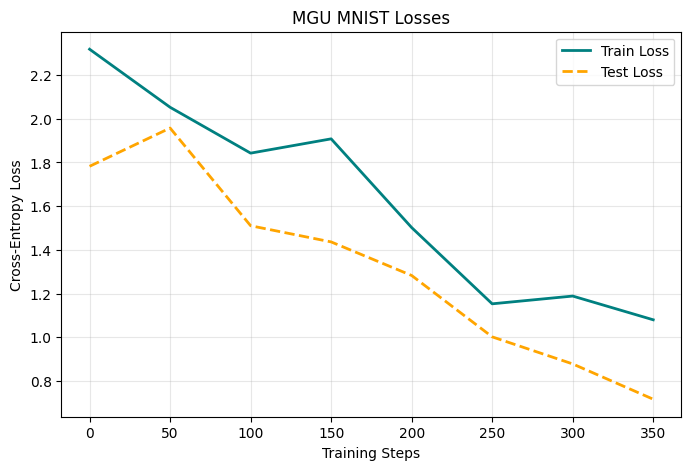

Step: 350
Training loss: 1.079806923866272
Validation loss: 0.7162517003523998
Accuracy measurement: 49.1786858974359


  0%|          | 0/3 [00:00<?, ?it/s]

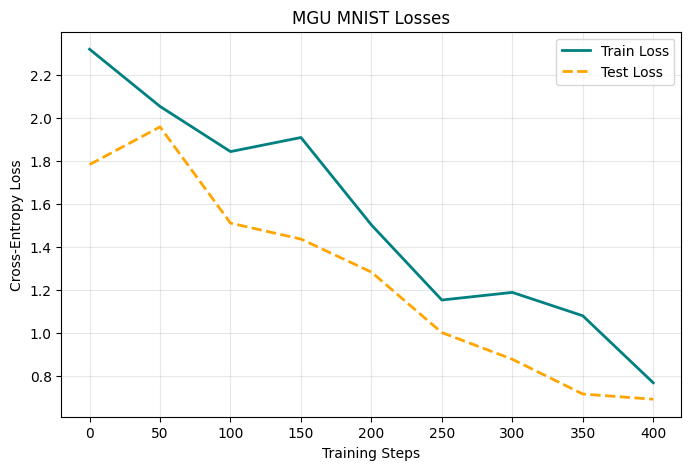

Step: 400
Training loss: 0.7684801816940308
Validation loss: 0.6920720369387896
Accuracy measurement: 51.282051282051285


  0%|          | 0/3 [00:00<?, ?it/s]

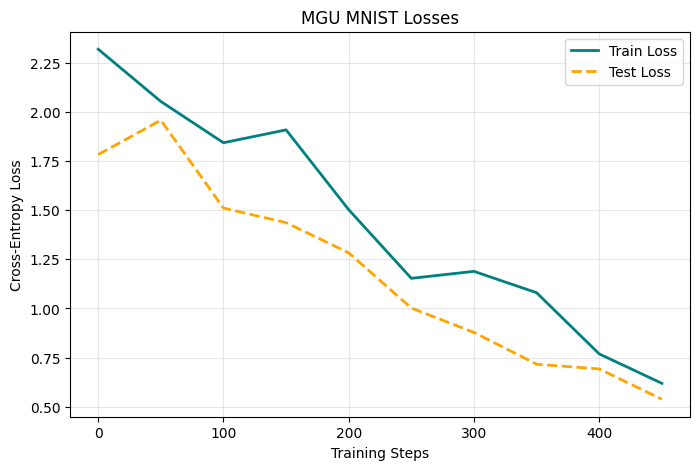

Step: 450
Training loss: 0.6189371943473816
Validation loss: 0.5380554229785235
Accuracy measurement: 56.18990384615385


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

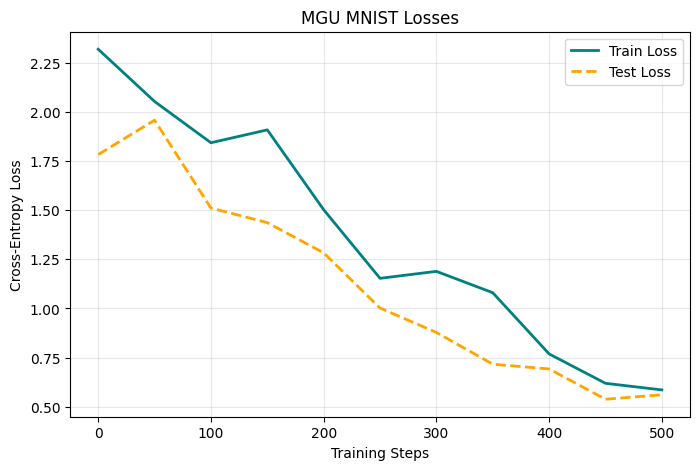

Step: 500
Training loss: 0.5854202508926392
Validation loss: 0.5608138365623279
Accuracy measurement: 54.88782051282051


  0%|          | 0/3 [00:00<?, ?it/s]

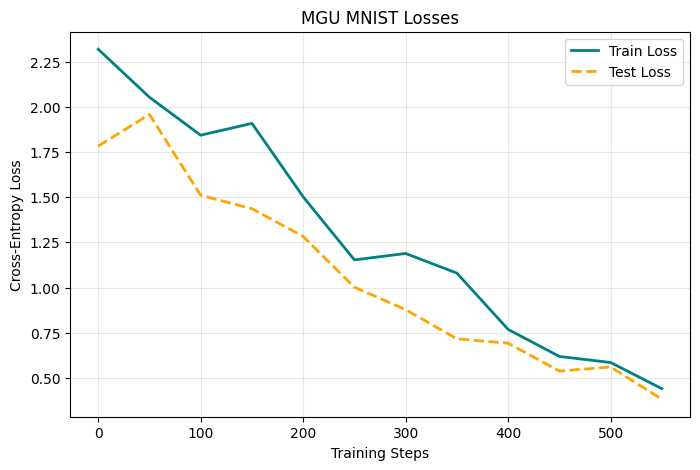

Step: 550
Training loss: 0.44051510095596313
Validation loss: 0.3822419658685342
Accuracy measurement: 60.59695512820513


  0%|          | 0/3 [00:00<?, ?it/s]

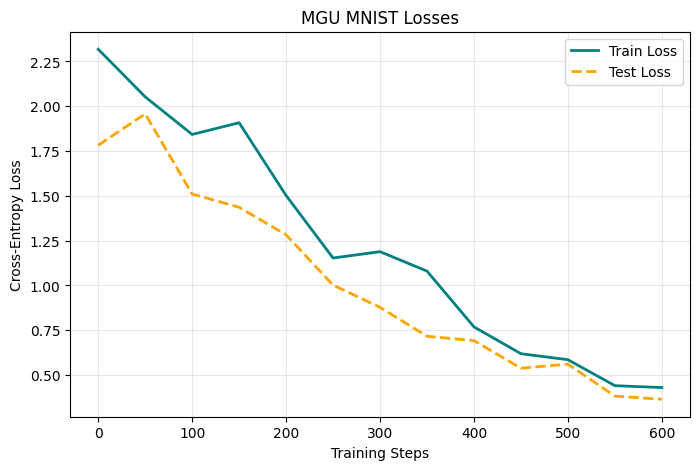

Step: 600
Training loss: 0.4299342632293701
Validation loss: 0.3648686103331737
Accuracy measurement: 61.39823717948718


  0%|          | 0/3 [00:00<?, ?it/s]

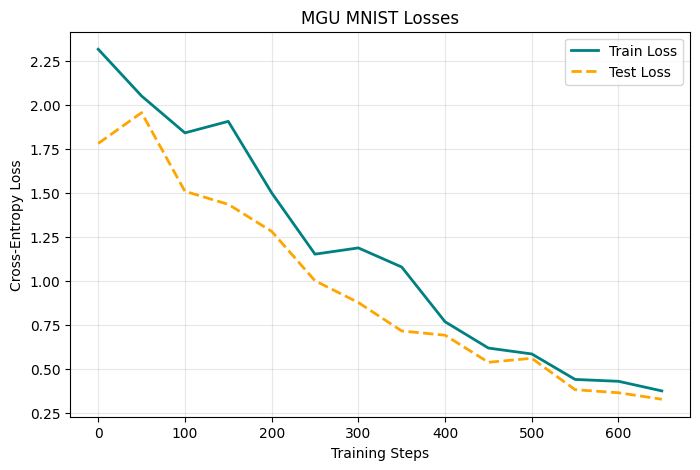

Step: 650
Training loss: 0.3753098249435425
Validation loss: 0.3280312663469559
Accuracy measurement: 63.802083333333336


  0%|          | 0/3 [00:00<?, ?it/s]

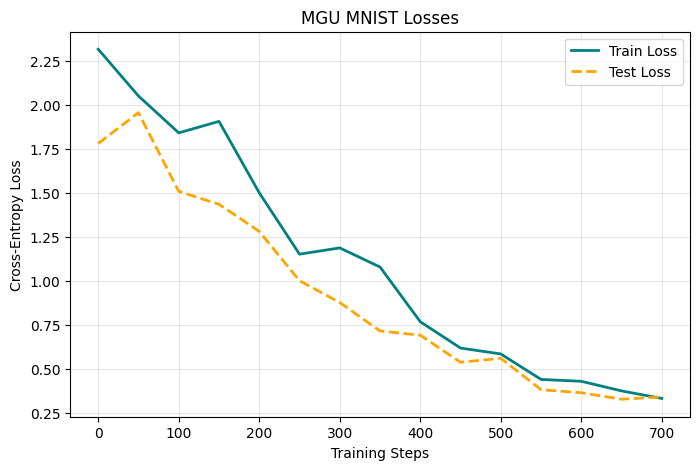

Step: 700
Training loss: 0.3324339687824249
Validation loss: 0.34130196540783614
Accuracy measurement: 62.19951923076923


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

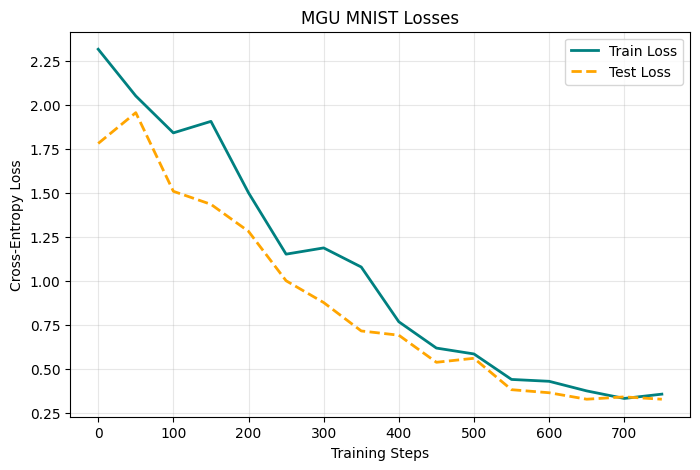

Step: 750
Training loss: 0.35689759254455566
Validation loss: 0.32805645313018406
Accuracy measurement: 62.90064102564103


  0%|          | 0/3 [00:00<?, ?it/s]

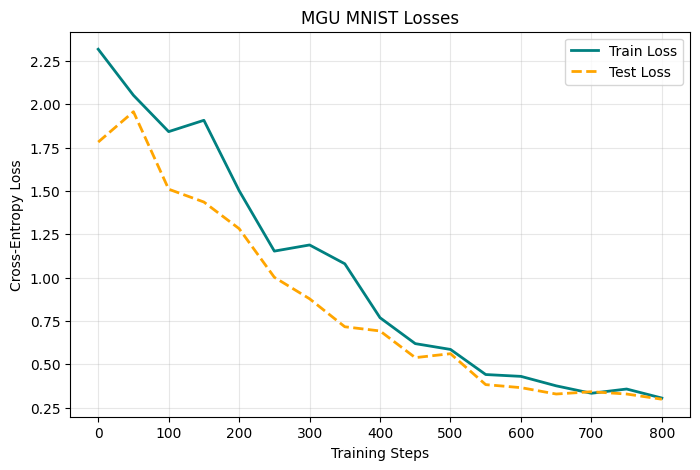

Step: 800
Training loss: 0.30477866530418396
Validation loss: 0.29802446181957537
Accuracy measurement: 64.90384615384616


  0%|          | 0/3 [00:00<?, ?it/s]

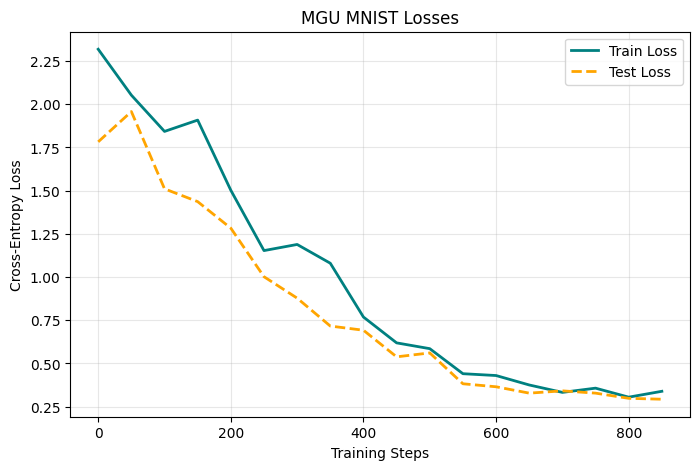

Step: 850
Training loss: 0.3387104868888855
Validation loss: 0.292832538103446
Accuracy measurement: 64.40304487179488


  0%|          | 0/3 [00:00<?, ?it/s]

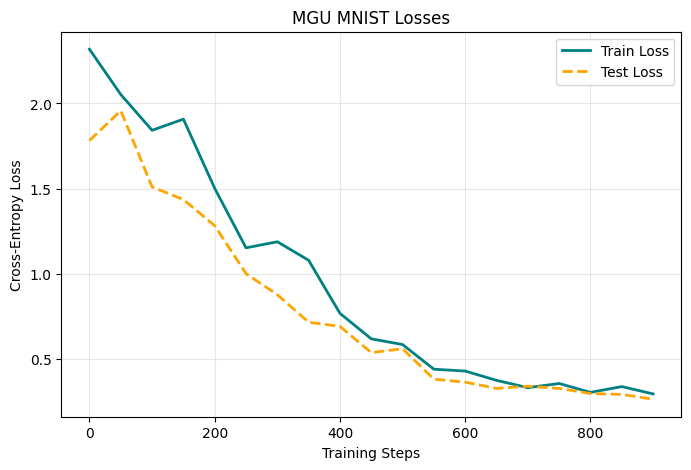

Step: 900
Training loss: 0.2957649230957031
Validation loss: 0.26462589318935686
Accuracy measurement: 65.60496794871796


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

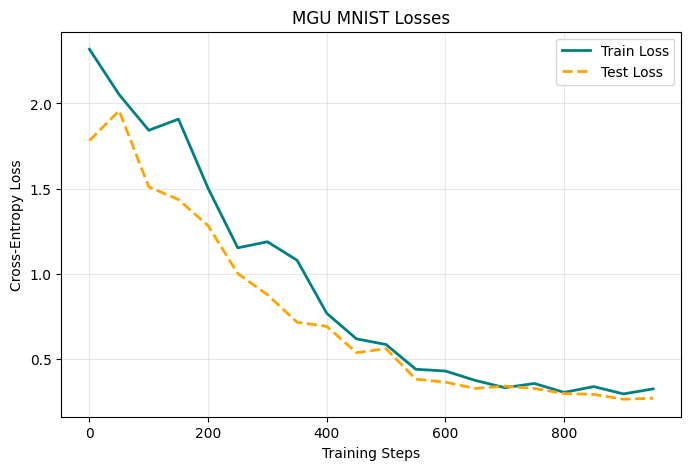

Step: 950
Training loss: 0.32508522272109985
Validation loss: 0.270687005458734
Accuracy measurement: 66.40625


  0%|          | 0/3 [00:00<?, ?it/s]

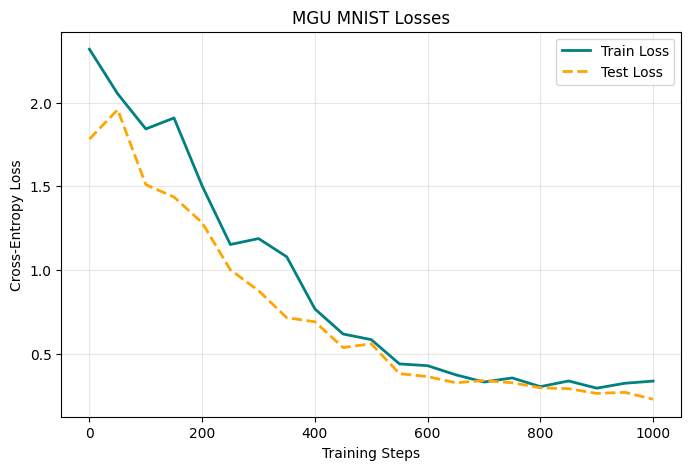

Step: 1000
Training loss: 0.33796730637550354
Validation loss: 0.22981007129718095
Accuracy measurement: 68.91025641025641


  0%|          | 0/3 [00:00<?, ?it/s]

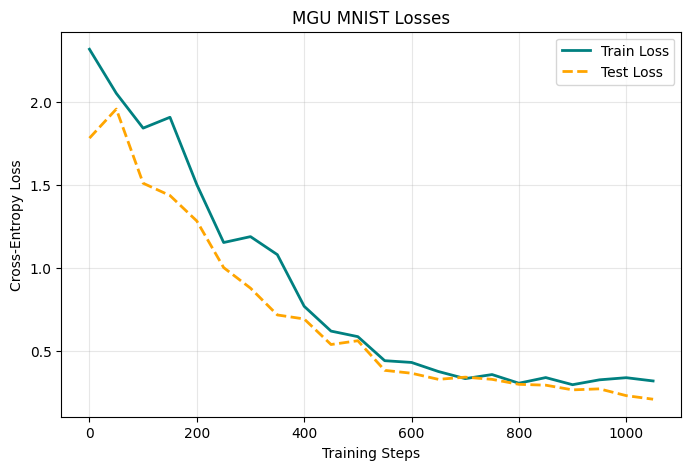

Step: 1050
Training loss: 0.3183590769767761
Validation loss: 0.20820759809934175
Accuracy measurement: 70.01201923076923


  0%|          | 0/3 [00:00<?, ?it/s]

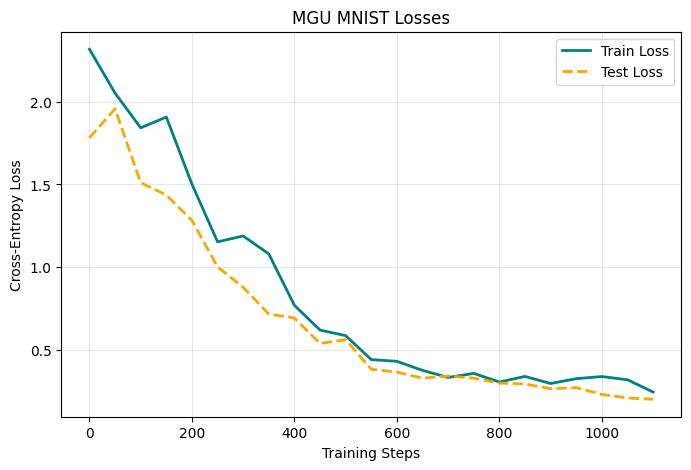

Step: 1100
Training loss: 0.24413534998893738
Validation loss: 0.200708256318019
Accuracy measurement: 69.91185897435898


  0%|          | 0/3 [00:00<?, ?it/s]

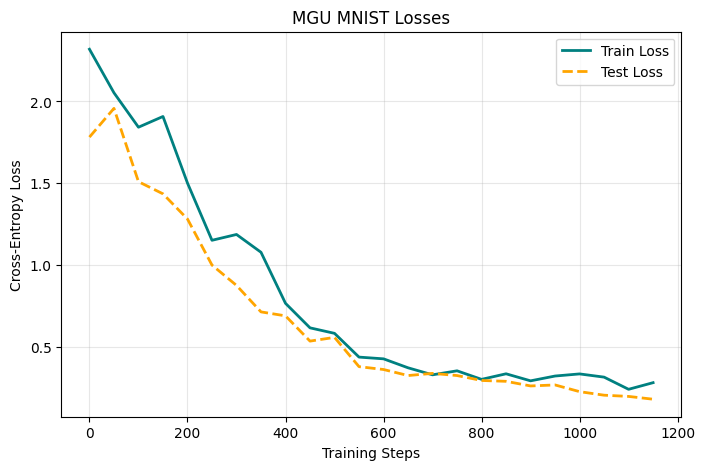

Step: 1150
Training loss: 0.28458794951438904
Validation loss: 0.183629687779989
Accuracy measurement: 70.71314102564102


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

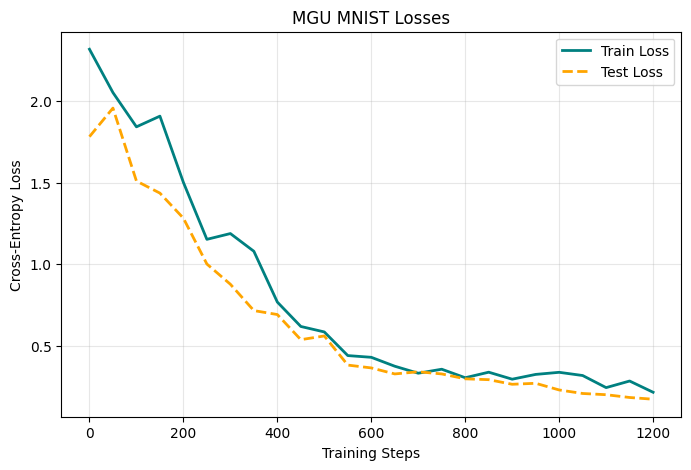

Step: 1200
Training loss: 0.21570433676242828
Validation loss: 0.1730265945960314
Accuracy measurement: 71.2139423076923


  0%|          | 0/3 [00:00<?, ?it/s]

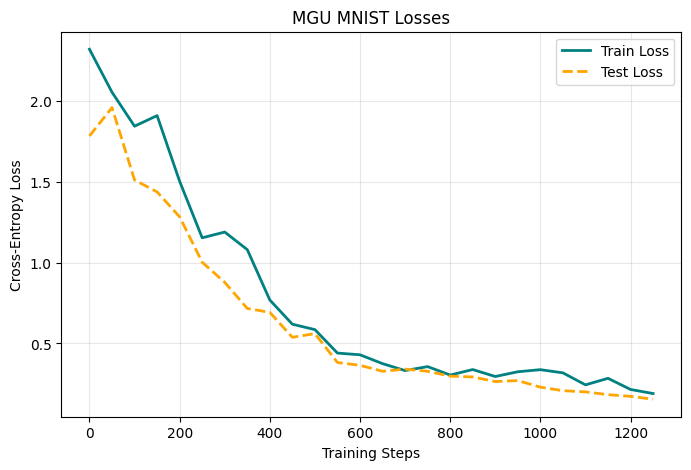

Step: 1250
Training loss: 0.19043183326721191
Validation loss: 0.15539369521996915
Accuracy measurement: 71.81490384615385


  0%|          | 0/3 [00:00<?, ?it/s]

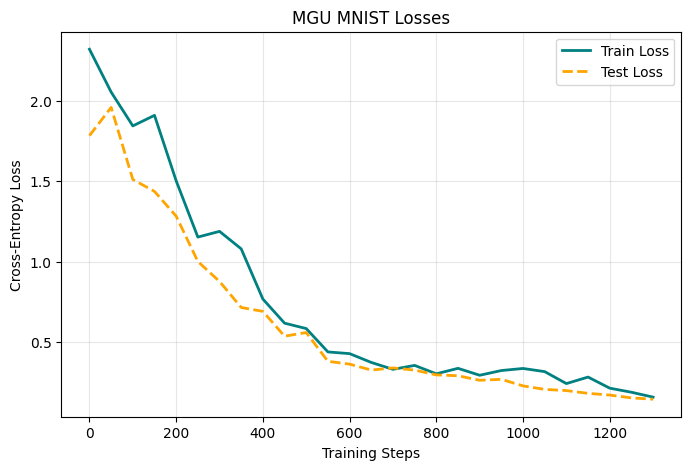

Step: 1300
Training loss: 0.1600523293018341
Validation loss: 0.14713603716630203
Accuracy measurement: 72.31570512820512


  0%|          | 0/3 [00:00<?, ?it/s]

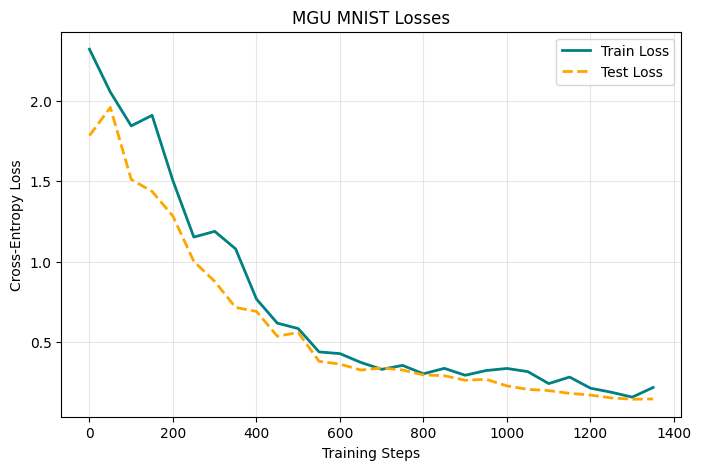

Step: 1350
Training loss: 0.2199215590953827
Validation loss: 0.14867886900901794
Accuracy measurement: 72.31570512820512


  0%|          | 0/3 [00:00<?, ?it/s]

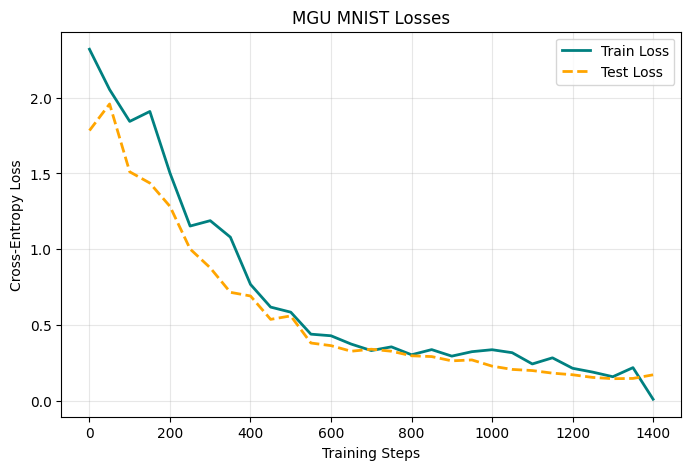

Step: 1400
Training loss: 0.01176939345896244
Validation loss: 0.17264280563745743
Accuracy measurement: 71.11378205128206


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

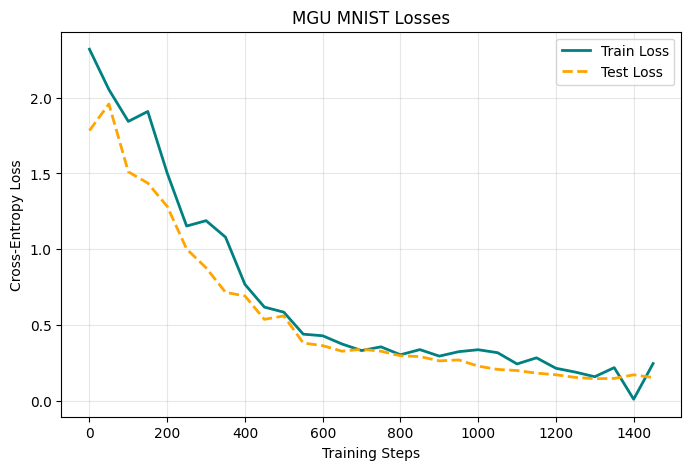

Step: 1450
Training loss: 0.24692852795124054
Validation loss: 0.154616171732927
Accuracy measurement: 72.41586538461539


  0%|          | 0/3 [00:00<?, ?it/s]

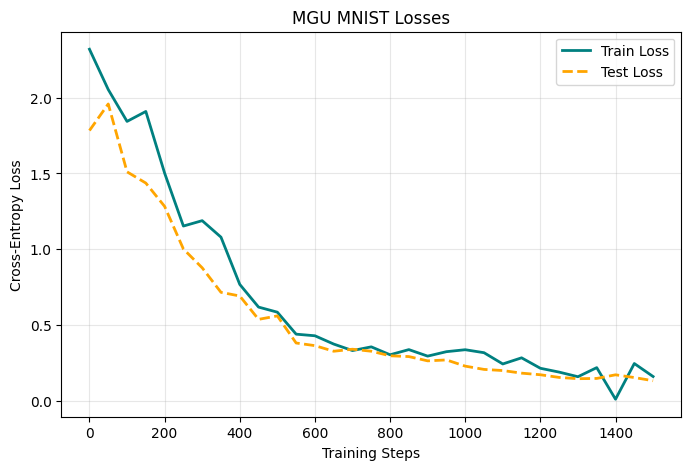

Step: 1500
Training loss: 0.16134120523929596
Validation loss: 0.13360684116681418
Accuracy measurement: 72.91666666666667


  0%|          | 0/3 [00:00<?, ?it/s]

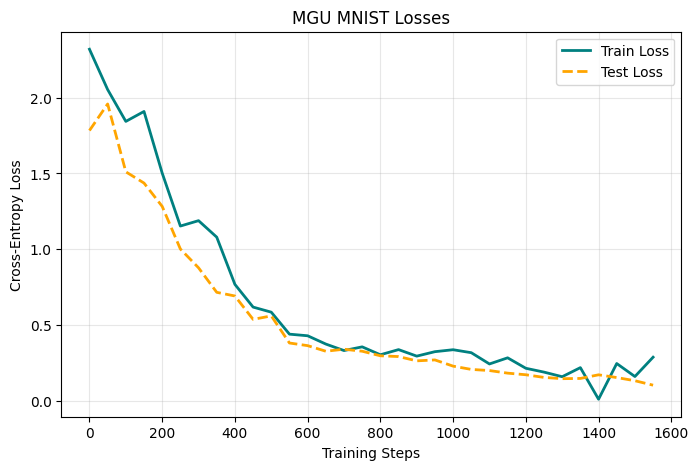

Step: 1550
Training loss: 0.28871452808380127
Validation loss: 0.10434775589368282
Accuracy measurement: 74.01842948717949


  0%|          | 0/3 [00:00<?, ?it/s]

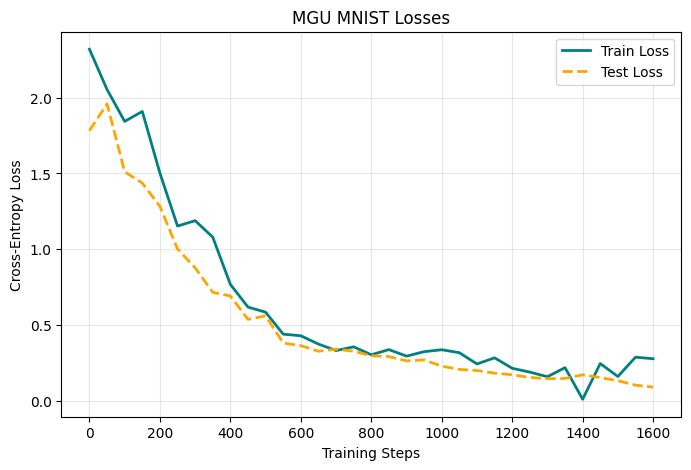

Step: 1600
Training loss: 0.2785429358482361
Validation loss: 0.09211756097964752
Accuracy measurement: 74.01842948717949


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

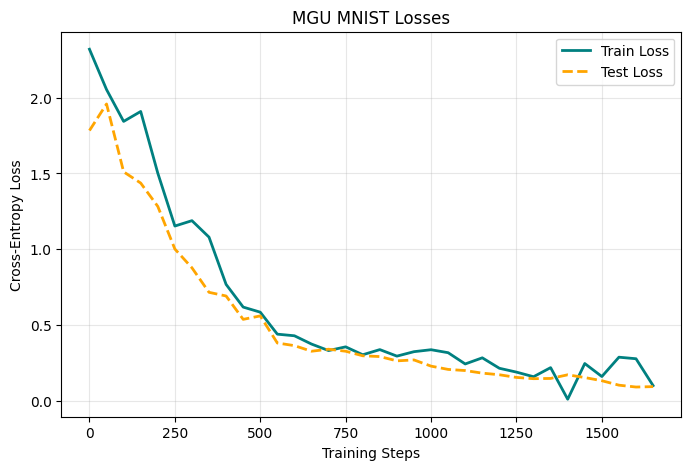

Step: 1650
Training loss: 0.101588673889637
Validation loss: 0.09477660824091007
Accuracy measurement: 73.61778846153847


  0%|          | 0/3 [00:00<?, ?it/s]

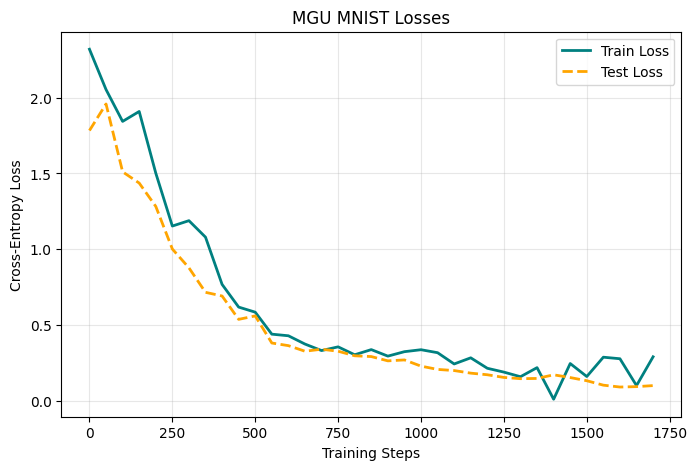

Step: 1700
Training loss: 0.29137974977493286
Validation loss: 0.10154047646583655
Accuracy measurement: 73.21714743589743


  0%|          | 0/3 [00:00<?, ?it/s]

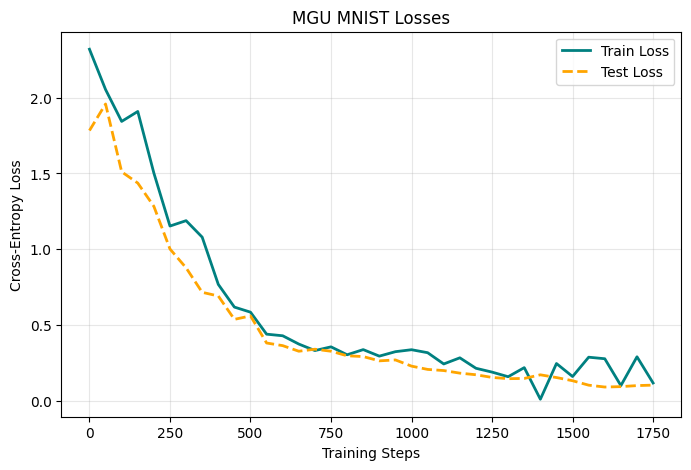

Step: 1750
Training loss: 0.1187746450304985
Validation loss: 0.10470317724423531
Accuracy measurement: 73.91826923076923


  0%|          | 0/3 [00:00<?, ?it/s]

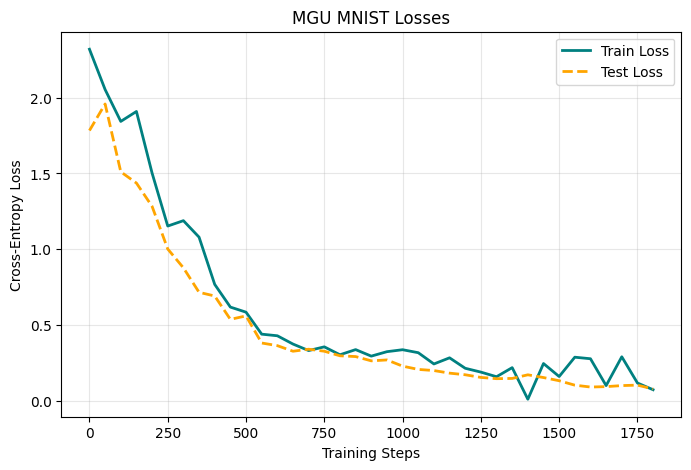

Step: 1800
Training loss: 0.07437772303819656
Validation loss: 0.07934630108185303
Accuracy measurement: 74.41907051282051


  0%|          | 0/3 [00:00<?, ?it/s]

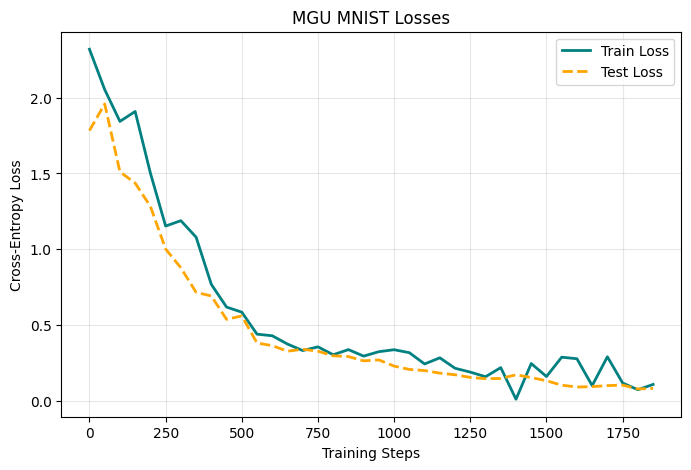

Step: 1850
Training loss: 0.10921212285757065
Validation loss: 0.08301630043066466
Accuracy measurement: 74.41907051282051


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

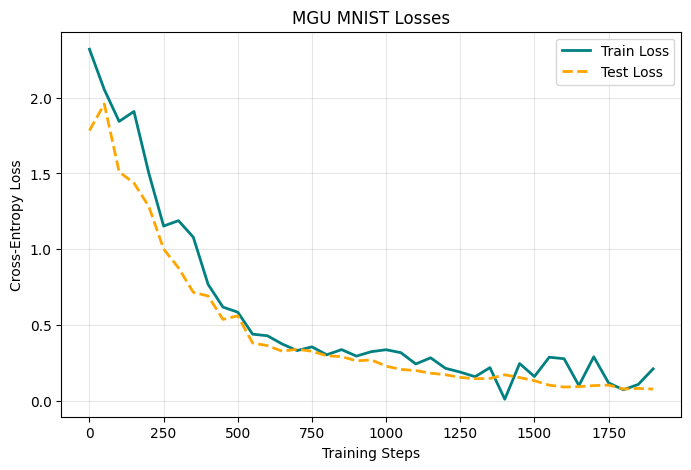

Step: 1900
Training loss: 0.2120014727115631
Validation loss: 0.07877217271389106
Accuracy measurement: 74.11858974358975


  0%|          | 0/3 [00:00<?, ?it/s]

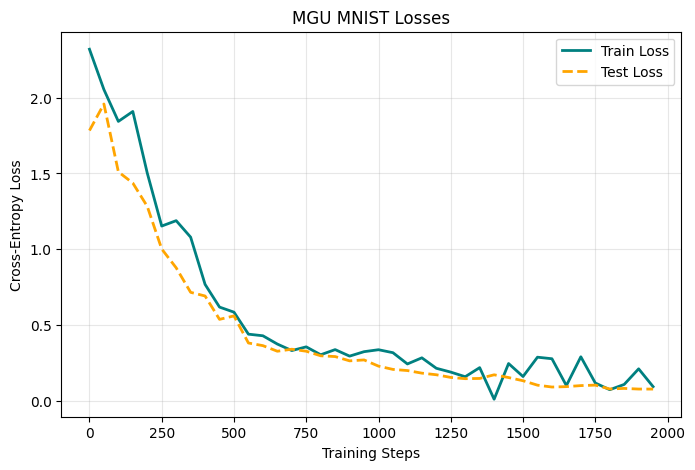

Step: 1950
Training loss: 0.09466977417469025
Validation loss: 0.07864357187197758
Accuracy measurement: 74.71955128205128


  0%|          | 0/3 [00:00<?, ?it/s]

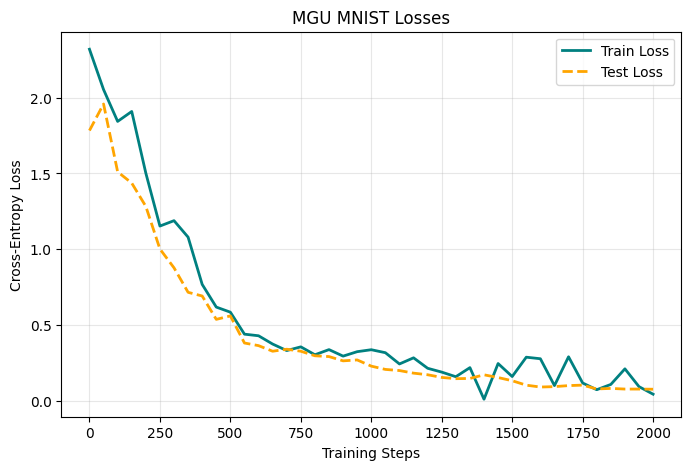

Step: 2000
Training loss: 0.044856373220682144
Validation loss: 0.07767761364961281
Accuracy measurement: 75.22035256410257


  0%|          | 0/3 [00:00<?, ?it/s]

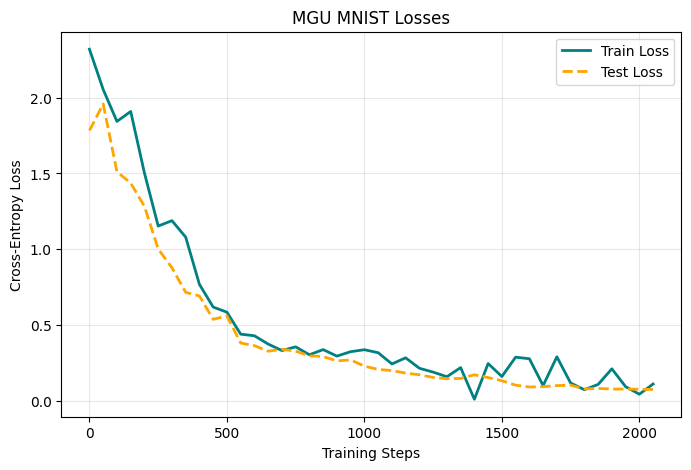

Step: 2050
Training loss: 0.1120564192533493
Validation loss: 0.07574973962245843
Accuracy measurement: 74.41907051282051


  0%|          | 0/3 [00:00<?, ?it/s]

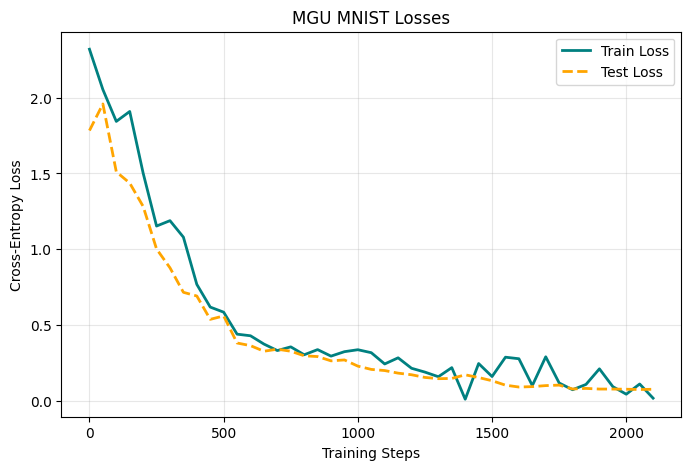

Step: 2100
Training loss: 0.01873789355158806
Validation loss: 0.07735499204733433
Accuracy measurement: 74.81971153846155


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

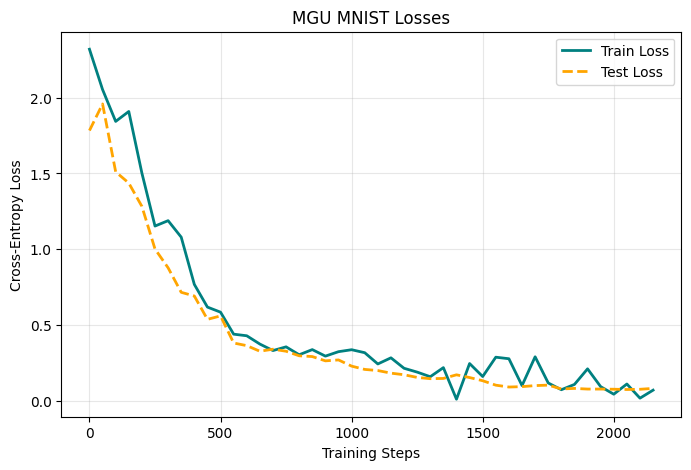

Step: 2150
Training loss: 0.07158364355564117
Validation loss: 0.08297715240564102
Accuracy measurement: 74.01842948717949


  0%|          | 0/3 [00:00<?, ?it/s]

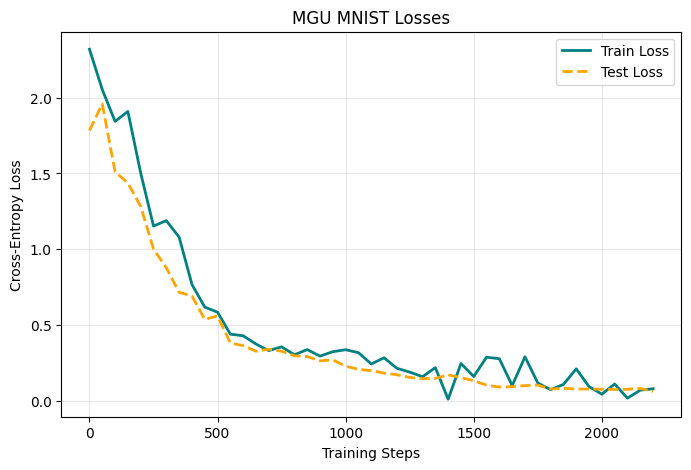

Step: 2200
Training loss: 0.08070383220911026
Validation loss: 0.0633577477091398
Accuracy measurement: 74.81971153846155


  0%|          | 0/3 [00:00<?, ?it/s]

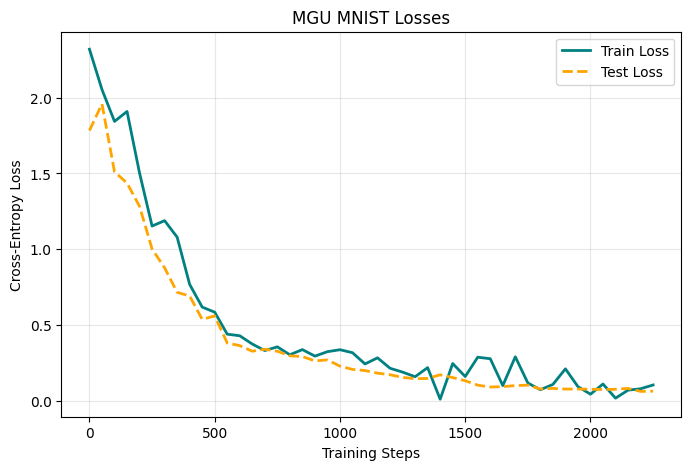

Step: 2250
Training loss: 0.10554230213165283
Validation loss: 0.06488432104770954
Accuracy measurement: 74.81971153846155


  0%|          | 0/3 [00:00<?, ?it/s]

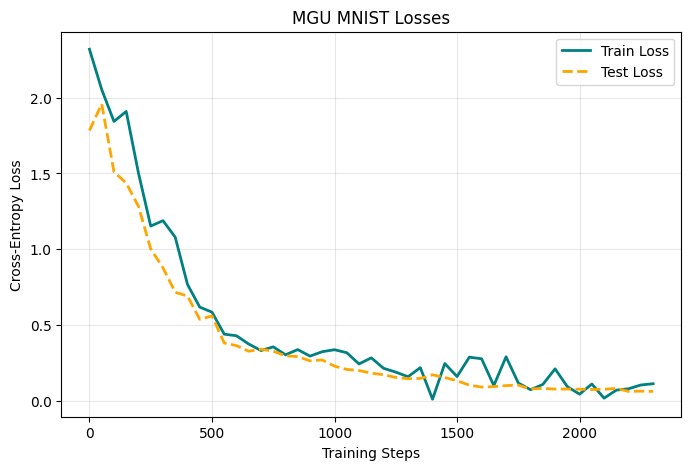

Step: 2300
Training loss: 0.11385180056095123
Validation loss: 0.06327342242002487
Accuracy measurement: 75.02003205128206


In [12]:
import custom_models_for_MNIST
import math

hid=256
lr=1e-3
epochs = 10
break_time=50
start_step =0

steps_history = []
train_history = []
test_history = []
acc_history=[]




MGU_model = custom_models_for_MNIST.MGU(vocab_dim=10, hid=hid, emb=1, device='cuda')
opt_MGU = torch.optim.Adam(MGU_model.parameters(), lr=lr)
#_ = load_model("eGRU_wikitext2_epoch_10000.pt", device='cuda', model=eGRU_model, optimizer=opt_eGRU)



for epoch in trange(10, 20):

    start_step = train_model(
        model=MGU_model,
        model_name="MGU",
        opt=opt_MGU,
        training_data_batched=train_data_batched,
        training_labels_batched=train_labels_batched,
        testing_data_batched=test_data_batched,
        testing_labels_batched=test_labels_batched,
        train_loss_history=train_history,
        test_loss_history=test_history,
        acc_history=acc_history,
        start_step=start_step,
        recorded_steps=steps_history,
        break_time=break_time,
        hid=hid,
        device=device
    )


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

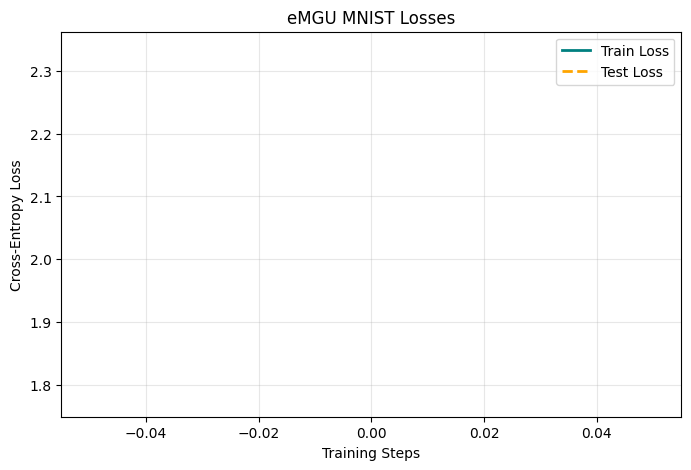

Step: 0
Training loss: 2.334338665008545
Validation loss: 1.7772930096357298
Accuracy measurement: 9.314903846153847


  0%|          | 0/3 [00:00<?, ?it/s]

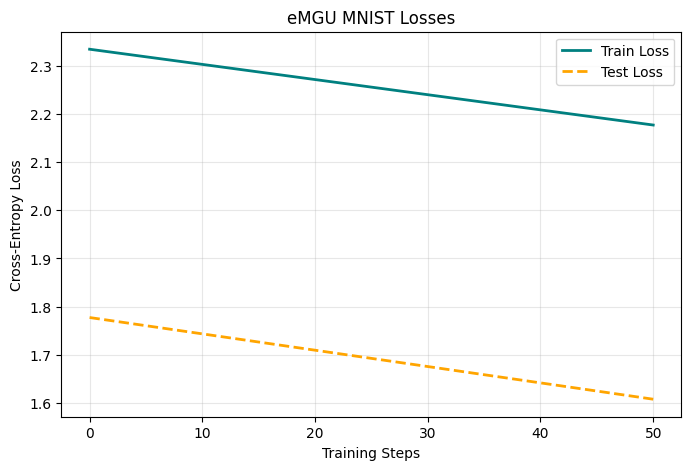

Step: 50
Training loss: 2.1769301891326904
Validation loss: 1.607658801934658
Accuracy measurement: 16.025641025641026


  0%|          | 0/3 [00:00<?, ?it/s]

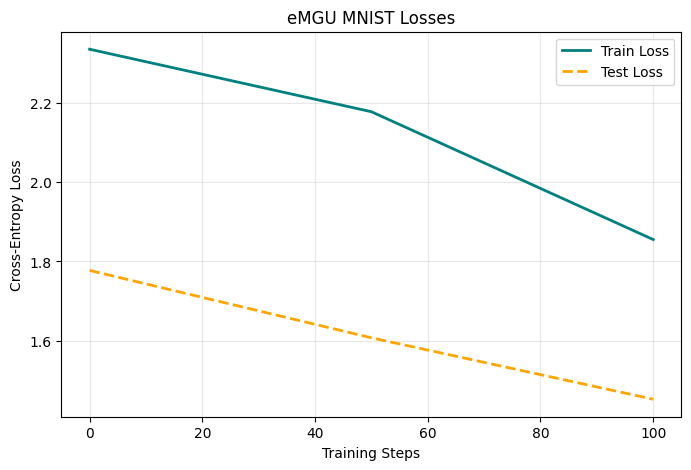

Step: 100
Training loss: 1.8550610542297363
Validation loss: 1.4529954164456098
Accuracy measurement: 21.834935897435898


  0%|          | 0/3 [00:00<?, ?it/s]

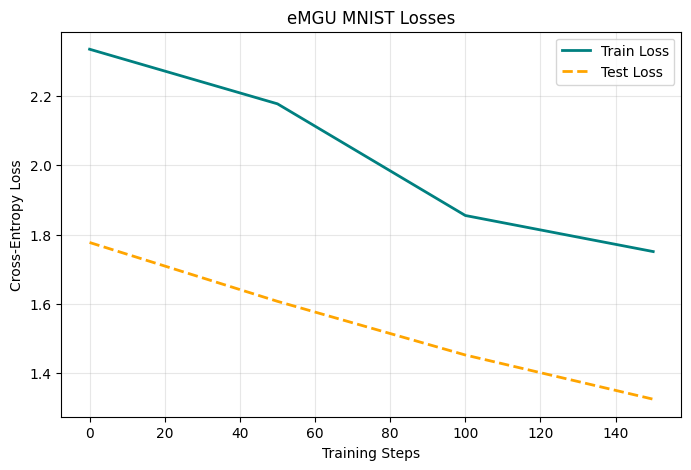

Step: 150
Training loss: 1.7510883808135986
Validation loss: 1.3255222944112925
Accuracy measurement: 27.544070512820515


  0%|          | 0/3 [00:00<?, ?it/s]

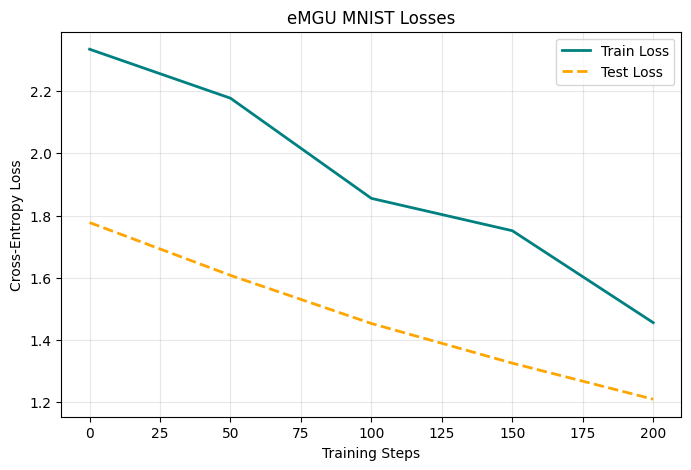

Step: 200
Training loss: 1.455700159072876
Validation loss: 1.209635337193807
Accuracy measurement: 28.245192307692307


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

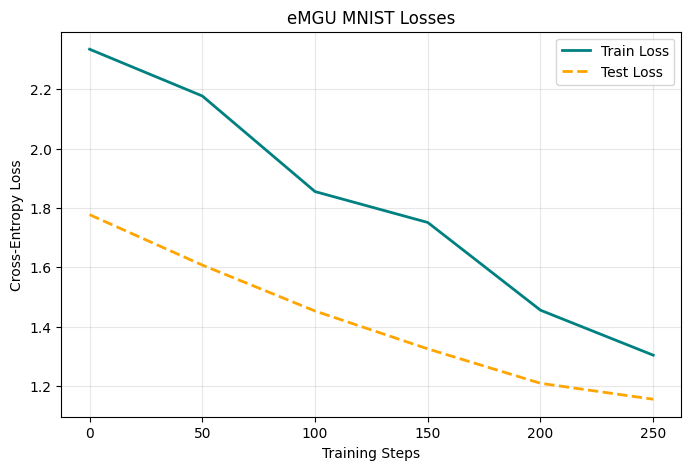

Step: 250
Training loss: 1.3043586015701294
Validation loss: 1.1560203173221686
Accuracy measurement: 29.847756410256412


  0%|          | 0/3 [00:00<?, ?it/s]

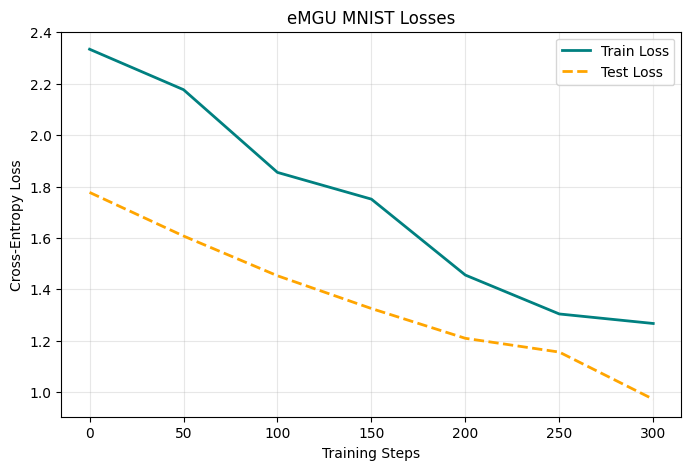

Step: 300
Training loss: 1.2673169374465942
Validation loss: 0.9726550945868859
Accuracy measurement: 39.563301282051285


  0%|          | 0/3 [00:00<?, ?it/s]

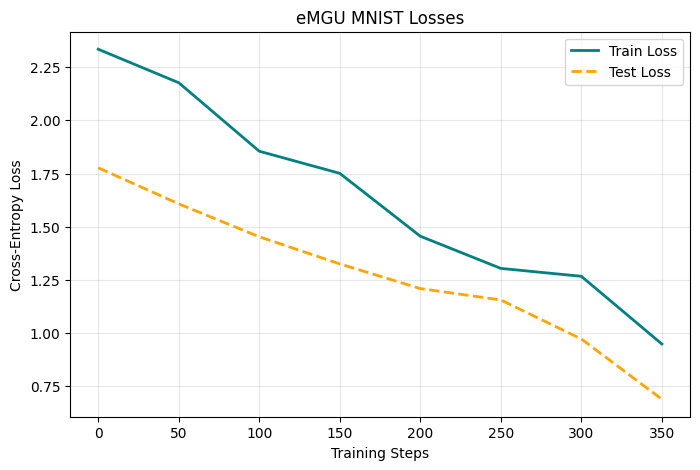

Step: 350
Training loss: 0.9490658044815063
Validation loss: 0.6896132536423513
Accuracy measurement: 53.78605769230769


  0%|          | 0/3 [00:00<?, ?it/s]

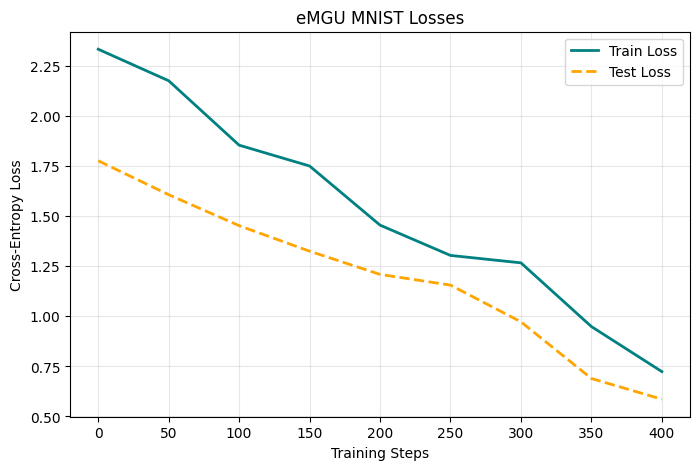

Step: 400
Training loss: 0.7241486310958862
Validation loss: 0.5861222438323193
Accuracy measurement: 55.188301282051285


  0%|          | 0/3 [00:00<?, ?it/s]

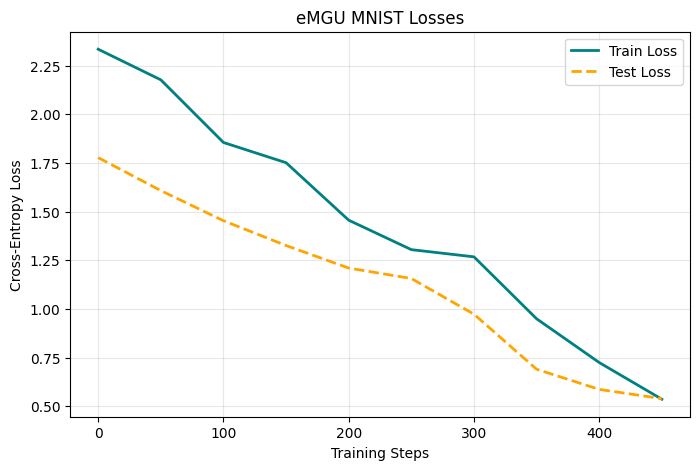

Step: 450
Training loss: 0.5356323719024658
Validation loss: 0.53859137571775
Accuracy measurement: 55.68910256410256


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

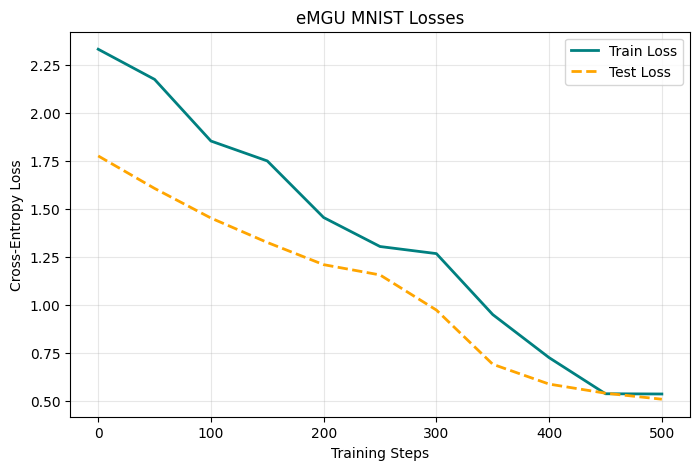

Step: 500
Training loss: 0.5344218611717224
Validation loss: 0.5071378518373538
Accuracy measurement: 57.29166666666667


  0%|          | 0/3 [00:00<?, ?it/s]

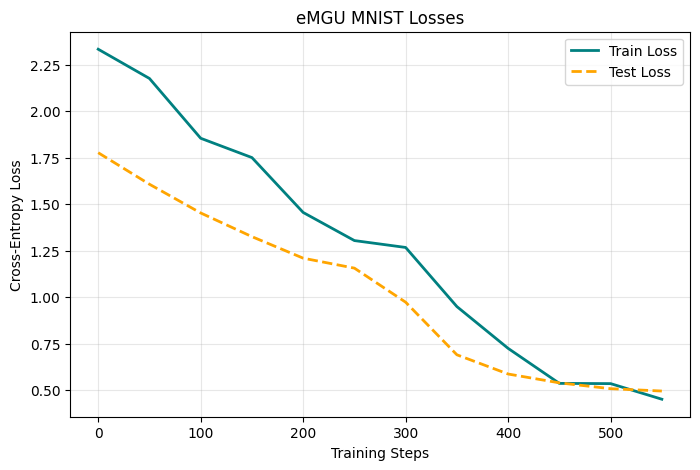

Step: 550
Training loss: 0.4504337012767792
Validation loss: 0.4944300651550293
Accuracy measurement: 56.39022435897436


  0%|          | 0/3 [00:00<?, ?it/s]

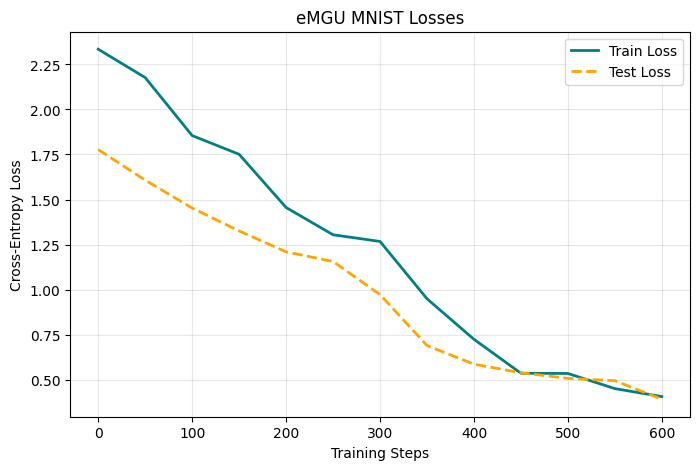

Step: 600
Training loss: 0.40621834993362427
Validation loss: 0.39152308916434264
Accuracy measurement: 62.399839743589745


  0%|          | 0/3 [00:00<?, ?it/s]

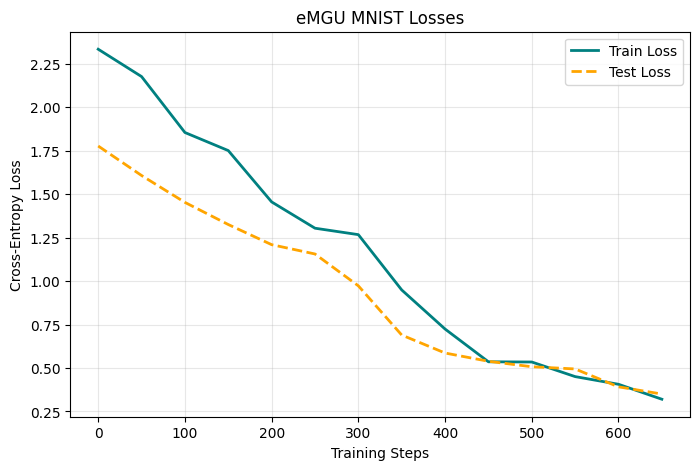

Step: 650
Training loss: 0.3202500641345978
Validation loss: 0.3500056801698147
Accuracy measurement: 62.600160256410255


  0%|          | 0/3 [00:00<?, ?it/s]

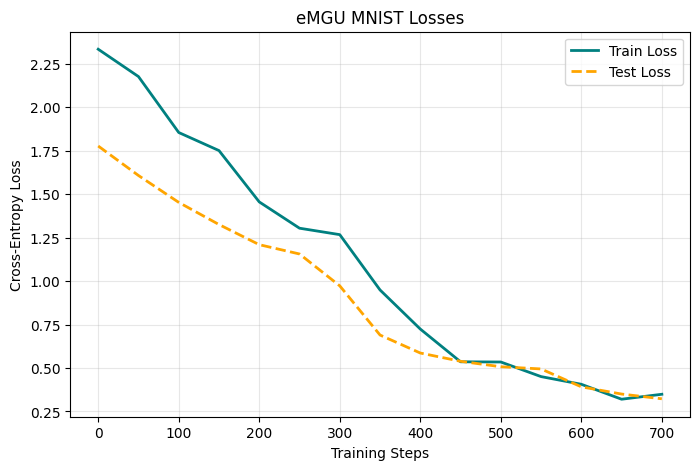

Step: 700
Training loss: 0.34875062108039856
Validation loss: 0.3226769581819192
Accuracy measurement: 64.70352564102565


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

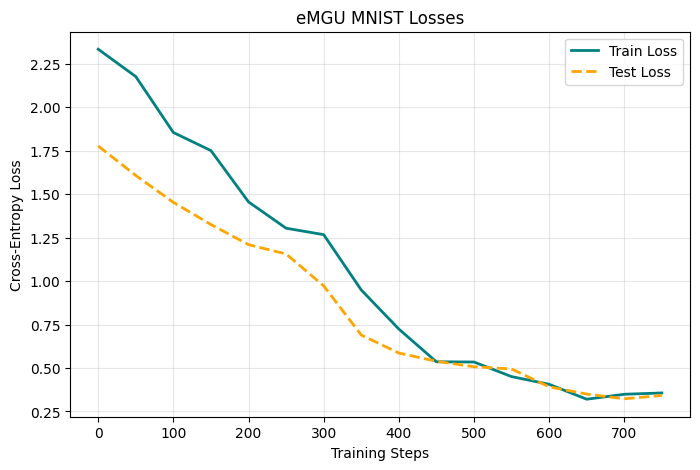

Step: 750
Training loss: 0.3563268184661865
Validation loss: 0.3417538297482026
Accuracy measurement: 63.70192307692308


  0%|          | 0/3 [00:00<?, ?it/s]

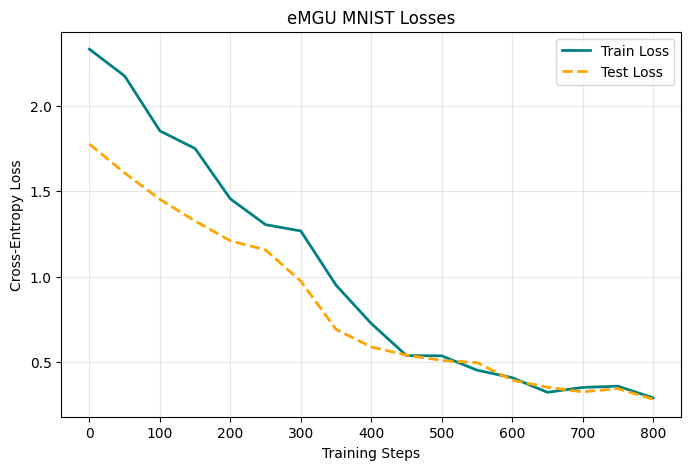

Step: 800
Training loss: 0.2874758243560791
Validation loss: 0.27961387084080624
Accuracy measurement: 66.00560897435898


  0%|          | 0/3 [00:00<?, ?it/s]

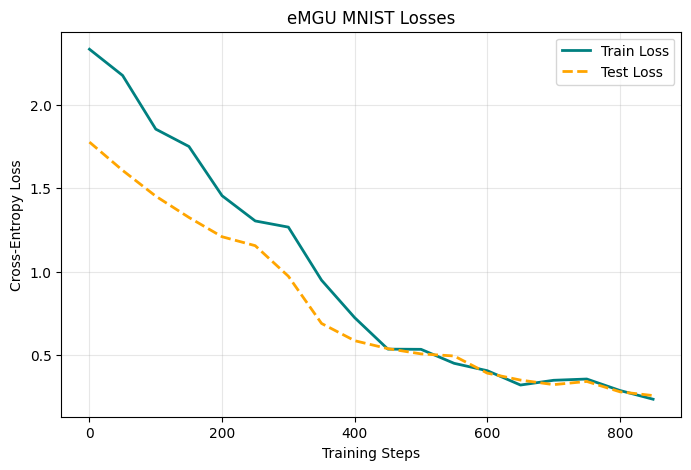

Step: 850
Training loss: 0.2351737767457962
Validation loss: 0.25701168255928236
Accuracy measurement: 66.60657051282051


  0%|          | 0/3 [00:00<?, ?it/s]

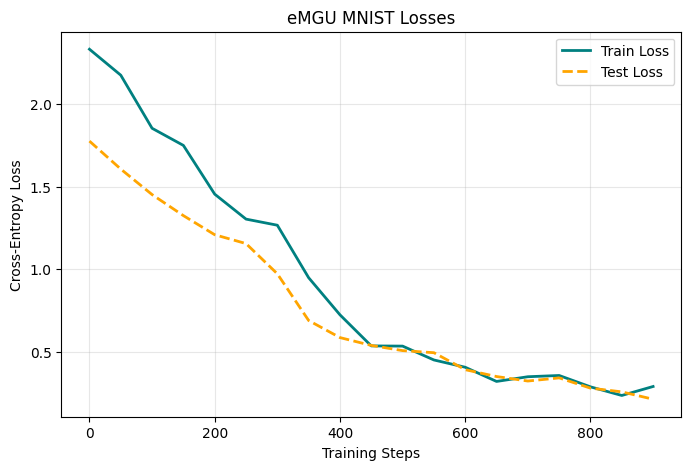

Step: 900
Training loss: 0.28957611322402954
Validation loss: 0.21240573280896896
Accuracy measurement: 69.51121794871796


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

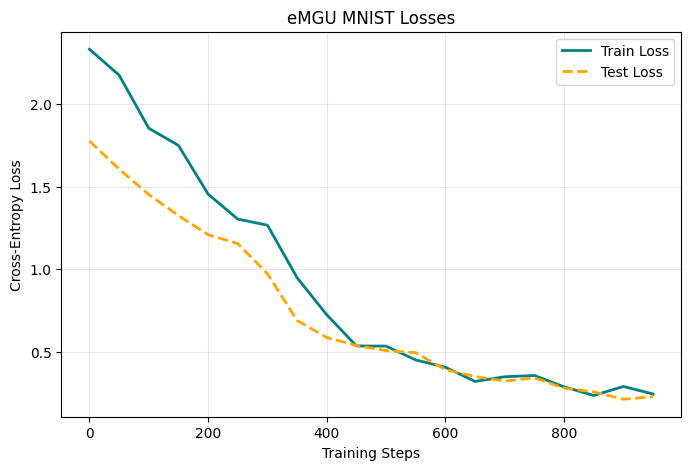

Step: 950
Training loss: 0.24385777115821838
Validation loss: 0.22795908726178682
Accuracy measurement: 69.51121794871796


  0%|          | 0/3 [00:00<?, ?it/s]

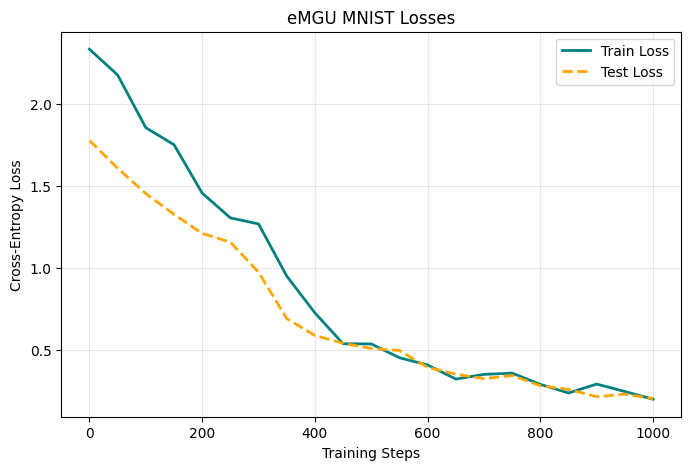

Step: 1000
Training loss: 0.19701598584651947
Validation loss: 0.20065617102843064
Accuracy measurement: 69.91185897435898


  0%|          | 0/3 [00:00<?, ?it/s]

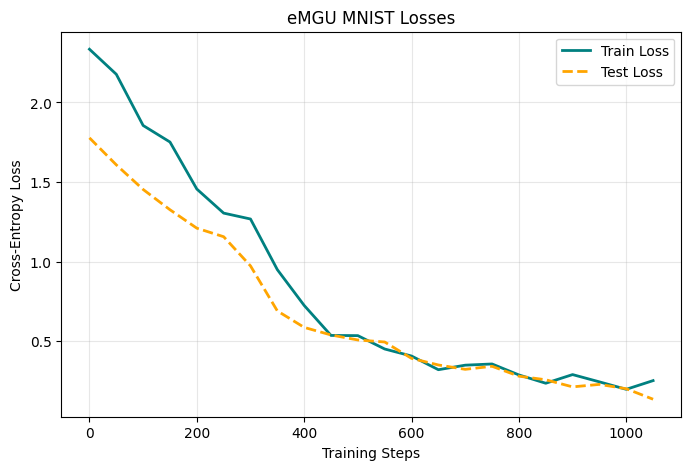

Step: 1050
Training loss: 0.2517543435096741
Validation loss: 0.1347754513606047
Accuracy measurement: 73.21714743589743


  0%|          | 0/3 [00:00<?, ?it/s]

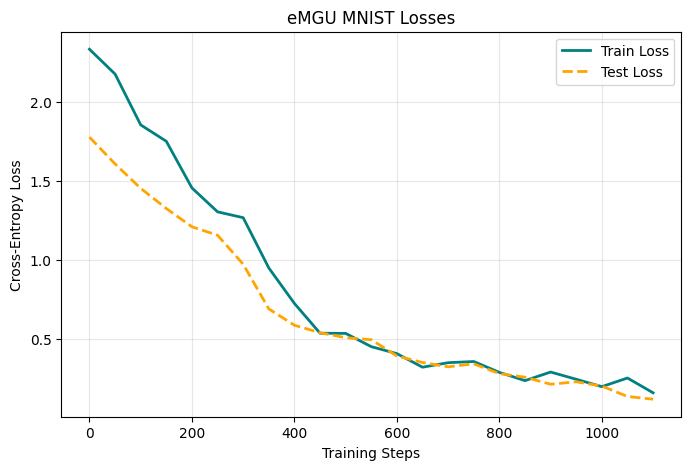

Step: 1100
Training loss: 0.15804392099380493
Validation loss: 0.11743667798164563
Accuracy measurement: 72.81650641025641


  0%|          | 0/3 [00:00<?, ?it/s]

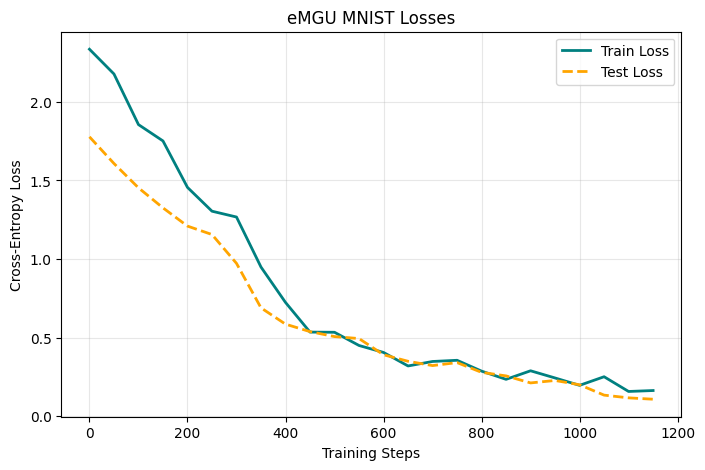

Step: 1150
Training loss: 0.16401071846485138
Validation loss: 0.10874357552100451
Accuracy measurement: 73.5176282051282


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

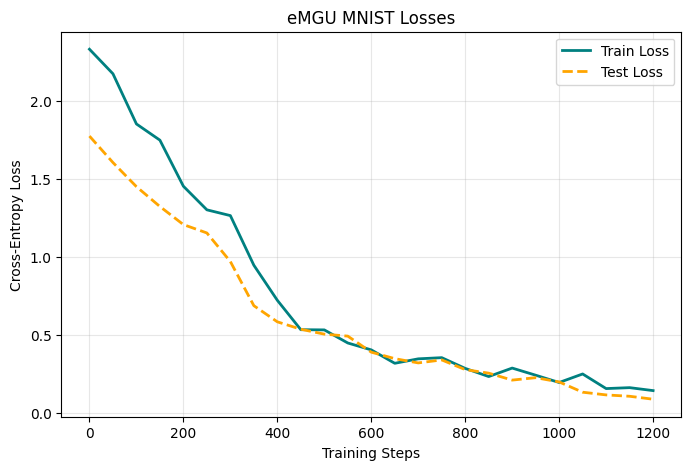

Step: 1200
Training loss: 0.1450510323047638
Validation loss: 0.08979310783056113
Accuracy measurement: 74.51923076923077


  0%|          | 0/3 [00:00<?, ?it/s]

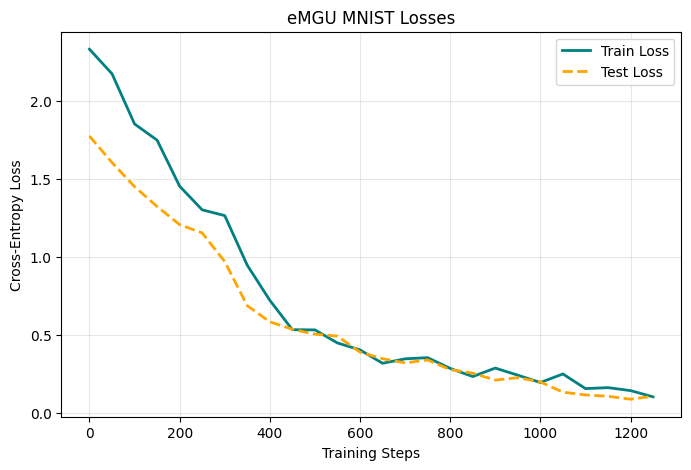

Step: 1250
Training loss: 0.10497450828552246
Validation loss: 0.10931358696558537
Accuracy measurement: 73.71794871794872


  0%|          | 0/3 [00:00<?, ?it/s]

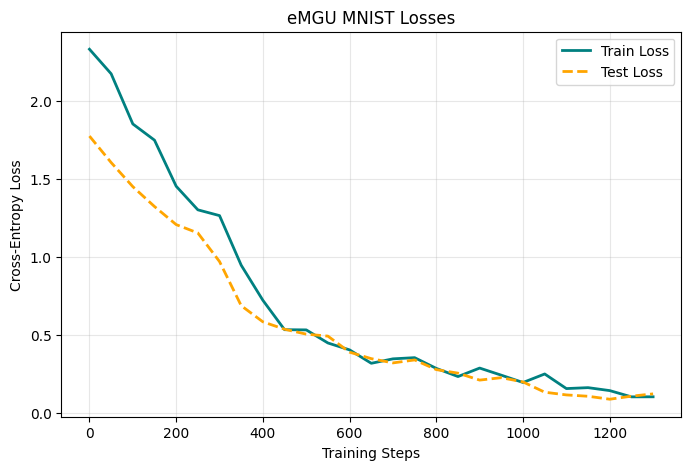

Step: 1300
Training loss: 0.10537441074848175
Validation loss: 0.12414088616004357
Accuracy measurement: 72.91666666666667


  0%|          | 0/3 [00:00<?, ?it/s]

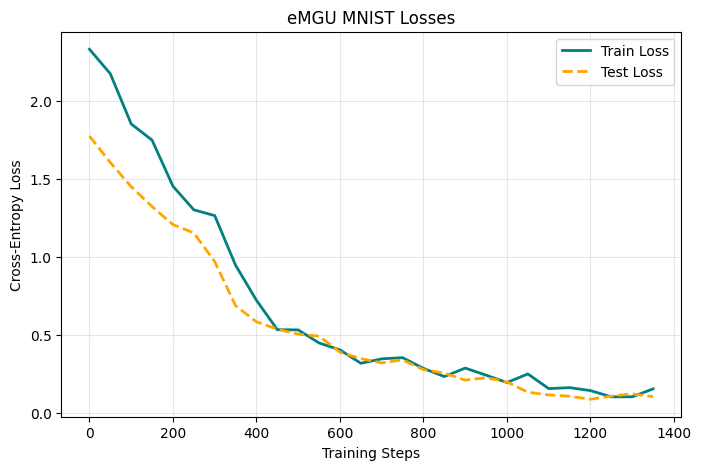

Step: 1350
Training loss: 0.15625721216201782
Validation loss: 0.10593295670472659
Accuracy measurement: 73.81810897435898


  0%|          | 0/3 [00:00<?, ?it/s]

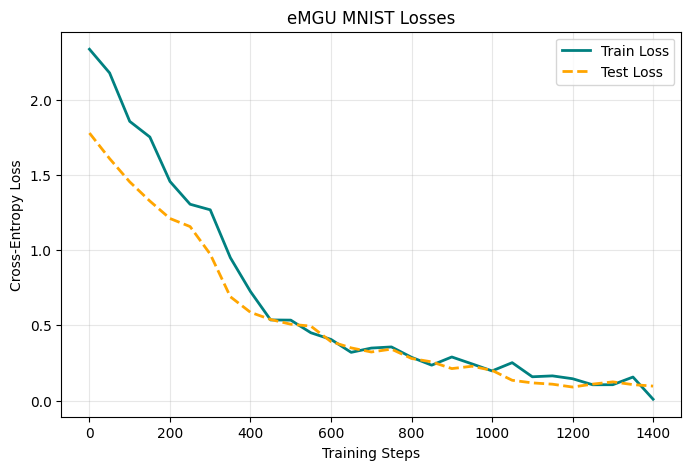

Step: 1400
Training loss: 0.008903169073164463
Validation loss: 0.09606271982192993
Accuracy measurement: 74.01842948717949


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

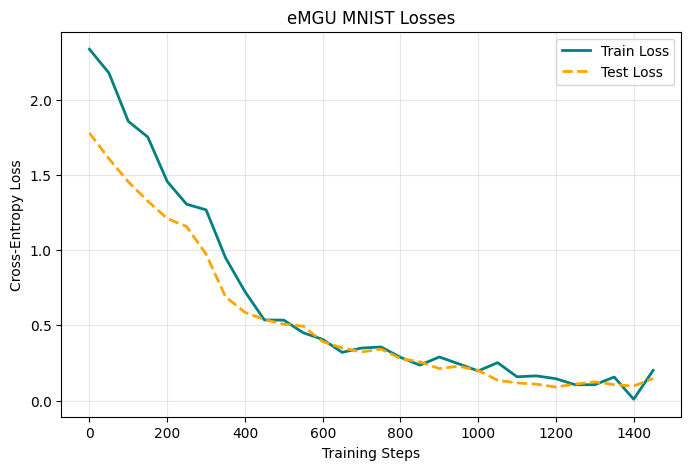

Step: 1450
Training loss: 0.2003202885389328
Validation loss: 0.14666764399944207
Accuracy measurement: 72.51602564102565


  0%|          | 0/3 [00:00<?, ?it/s]

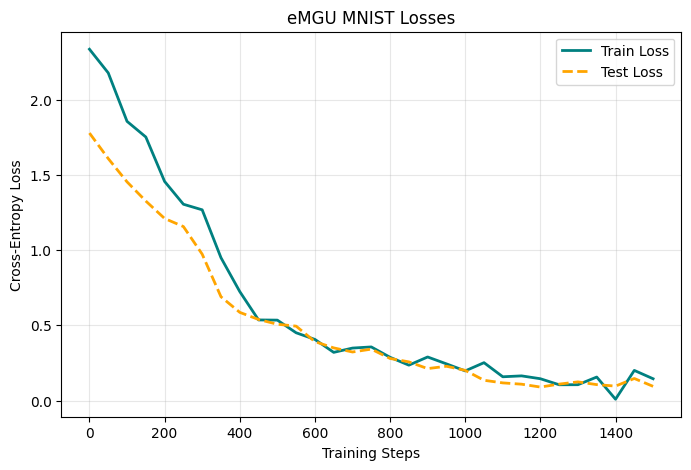

Step: 1500
Training loss: 0.14487937092781067
Validation loss: 0.09446337054937314
Accuracy measurement: 73.91826923076923


  0%|          | 0/3 [00:00<?, ?it/s]

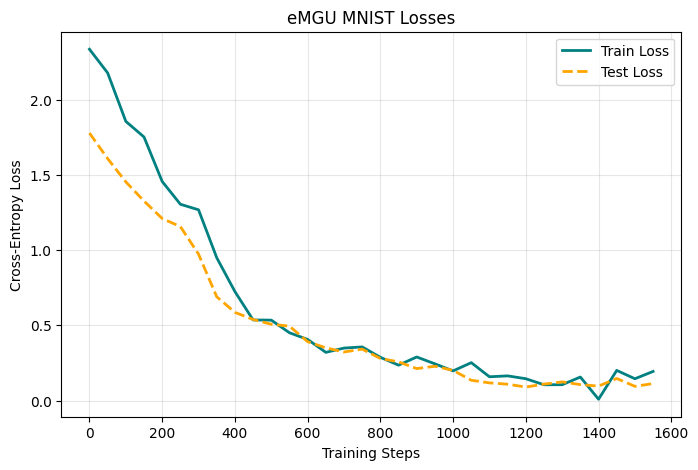

Step: 1550
Training loss: 0.19356615841388702
Validation loss: 0.11278718327864623
Accuracy measurement: 73.21714743589743


  0%|          | 0/3 [00:00<?, ?it/s]

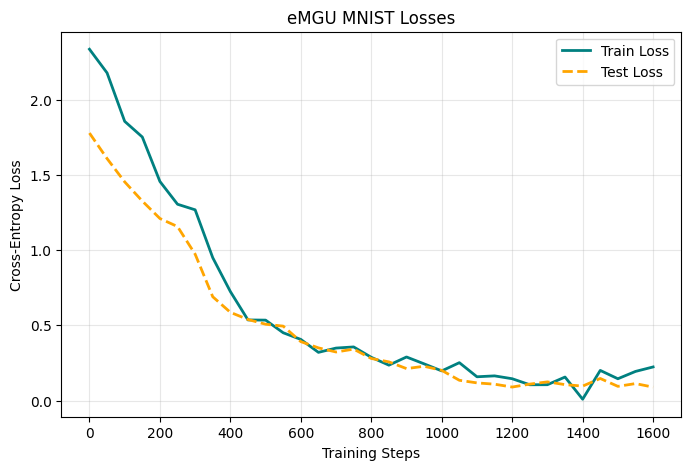

Step: 1600
Training loss: 0.2233152538537979
Validation loss: 0.08923162443515582
Accuracy measurement: 74.01842948717949


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

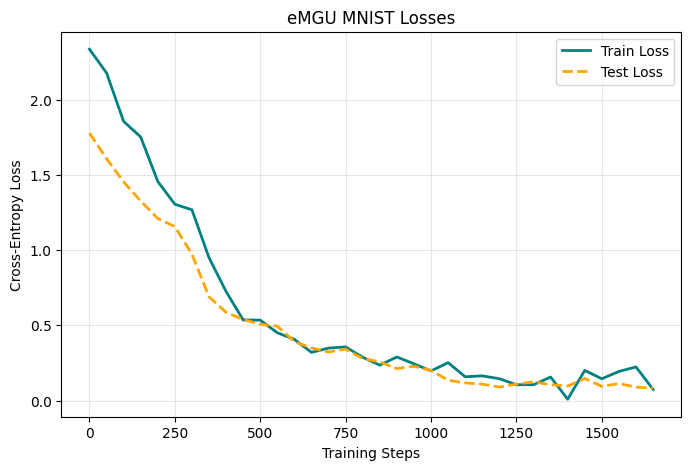

Step: 1650
Training loss: 0.07414759695529938
Validation loss: 0.08226430568939601
Accuracy measurement: 74.21875


  0%|          | 0/3 [00:00<?, ?it/s]

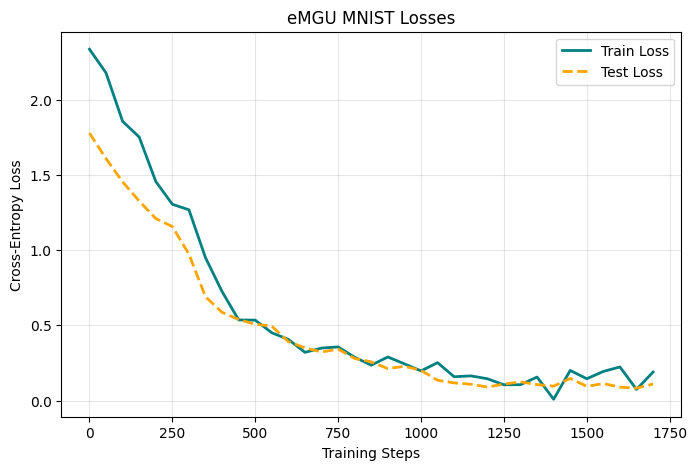

Step: 1700
Training loss: 0.18967503309249878
Validation loss: 0.11000818931139433
Accuracy measurement: 73.81810897435898


  0%|          | 0/3 [00:00<?, ?it/s]

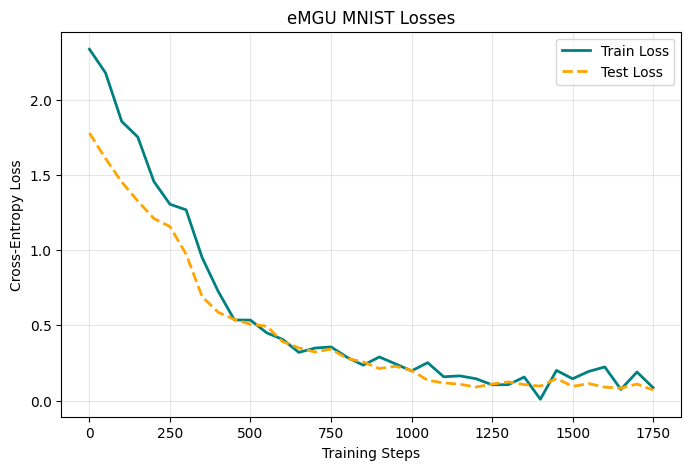

Step: 1750
Training loss: 0.08551250398159027
Validation loss: 0.07004391497526413
Accuracy measurement: 75.02003205128206


  0%|          | 0/3 [00:00<?, ?it/s]

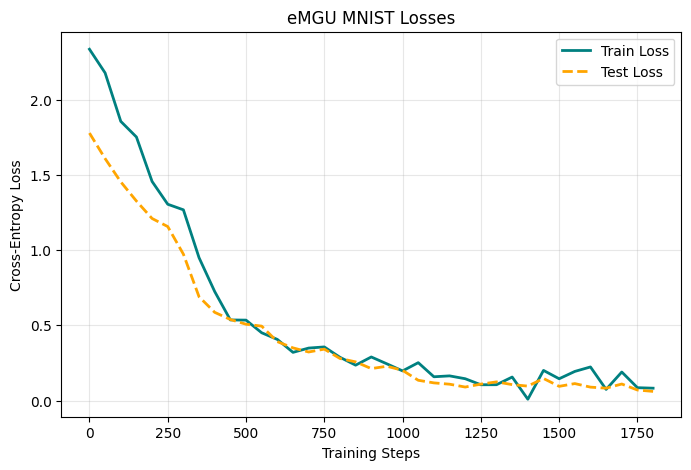

Step: 1800
Training loss: 0.08221109956502914
Validation loss: 0.060920210985037
Accuracy measurement: 75.02003205128206


  0%|          | 0/3 [00:00<?, ?it/s]

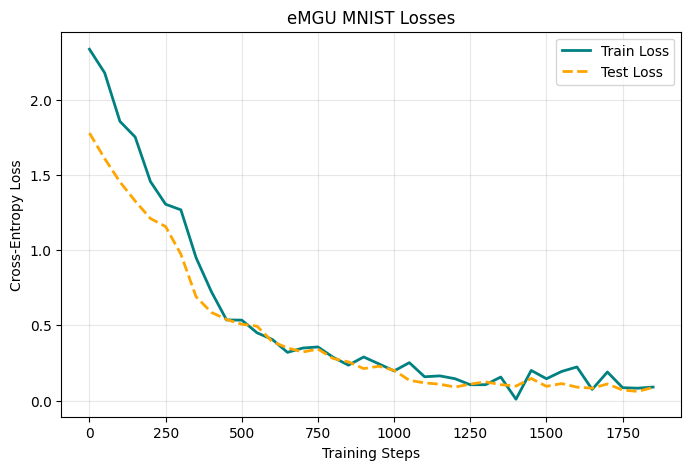

Step: 1850
Training loss: 0.08960095047950745
Validation loss: 0.08718529381813148
Accuracy measurement: 74.71955128205128


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

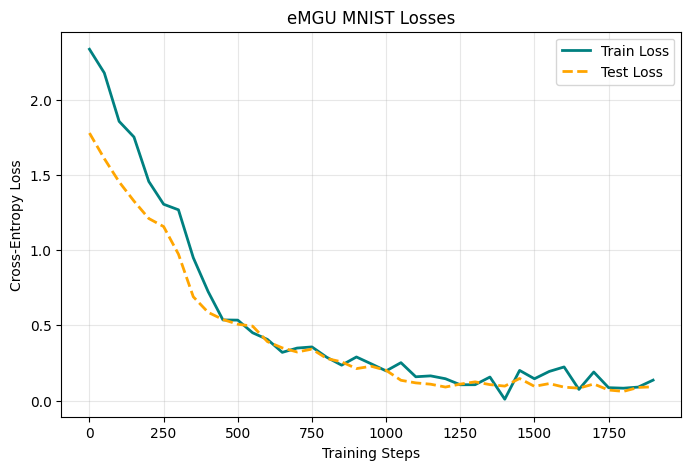

Step: 1900
Training loss: 0.13580816984176636
Validation loss: 0.09134343419319545
Accuracy measurement: 74.41907051282051


  0%|          | 0/3 [00:00<?, ?it/s]

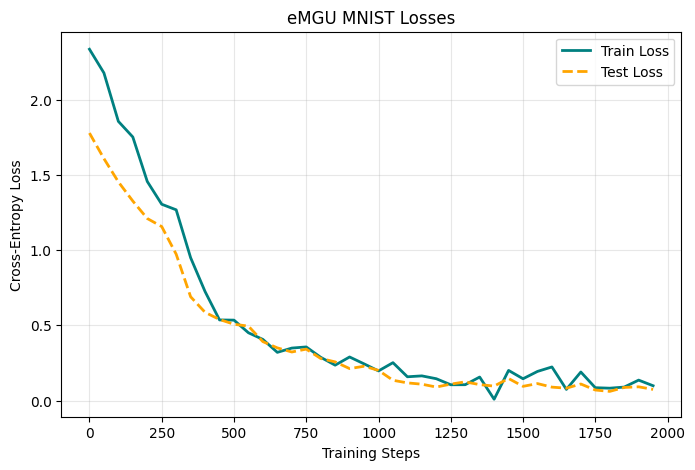

Step: 1950
Training loss: 0.09845390170812607
Validation loss: 0.07417818197073081
Accuracy measurement: 74.51923076923077


  0%|          | 0/3 [00:00<?, ?it/s]

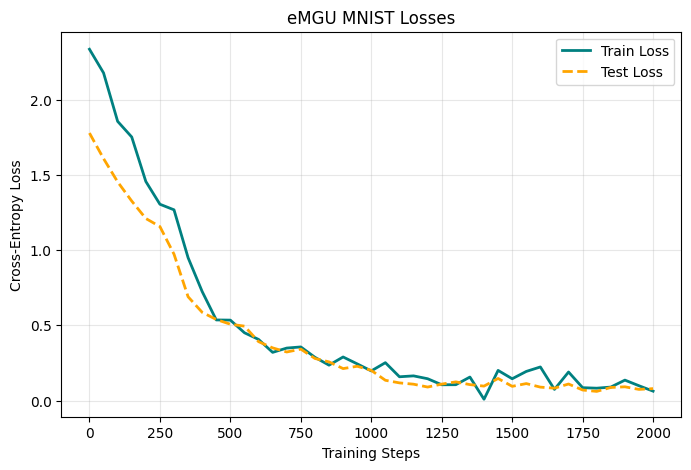

Step: 2000
Training loss: 0.06252411752939224
Validation loss: 0.0792518525551527
Accuracy measurement: 74.81971153846155


  0%|          | 0/3 [00:00<?, ?it/s]

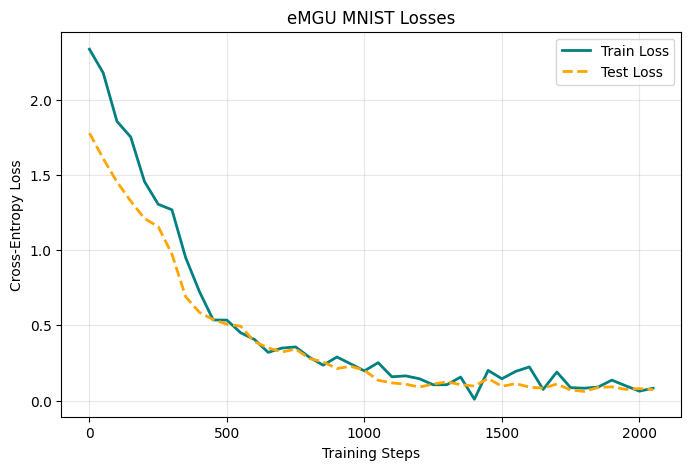

Step: 2050
Training loss: 0.0818142369389534
Validation loss: 0.07285718543407245
Accuracy measurement: 74.61939102564102


  0%|          | 0/3 [00:00<?, ?it/s]

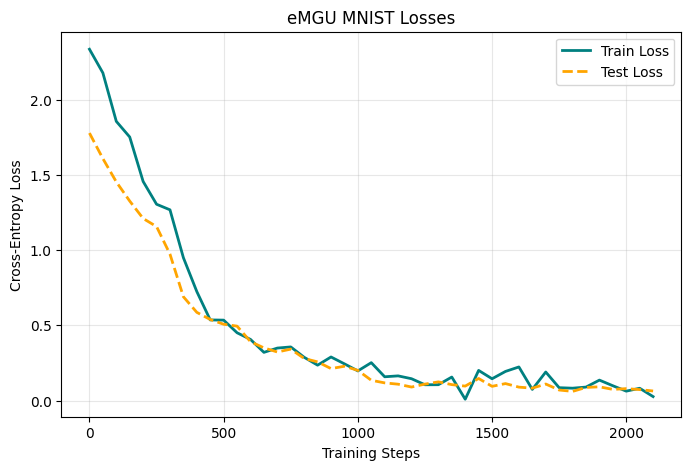

Step: 2100
Training loss: 0.026419825851917267
Validation loss: 0.0635668960137245
Accuracy measurement: 75.1201923076923


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

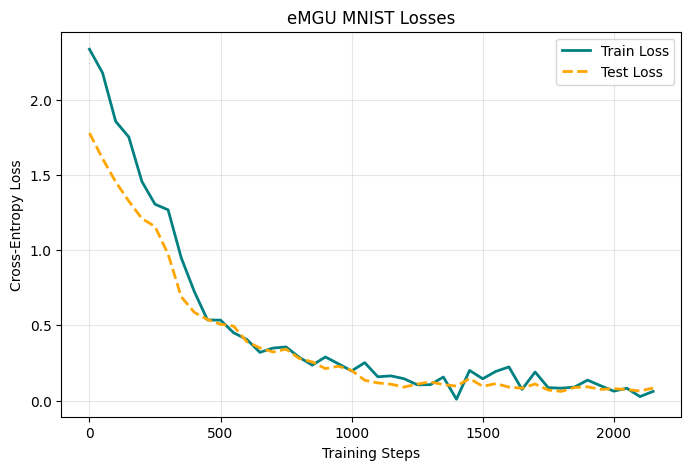

Step: 2150
Training loss: 0.06100109964609146
Validation loss: 0.08312784517422701
Accuracy measurement: 74.31891025641026


  0%|          | 0/3 [00:00<?, ?it/s]

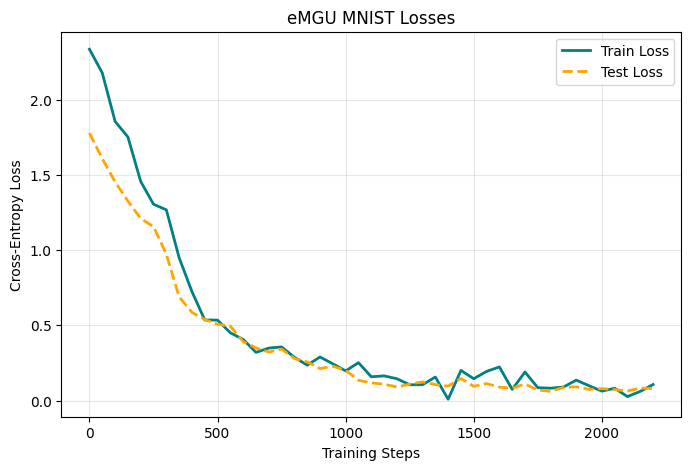

Step: 2200
Training loss: 0.1067642867565155
Validation loss: 0.07952435658528255
Accuracy measurement: 74.61939102564102


  0%|          | 0/3 [00:00<?, ?it/s]

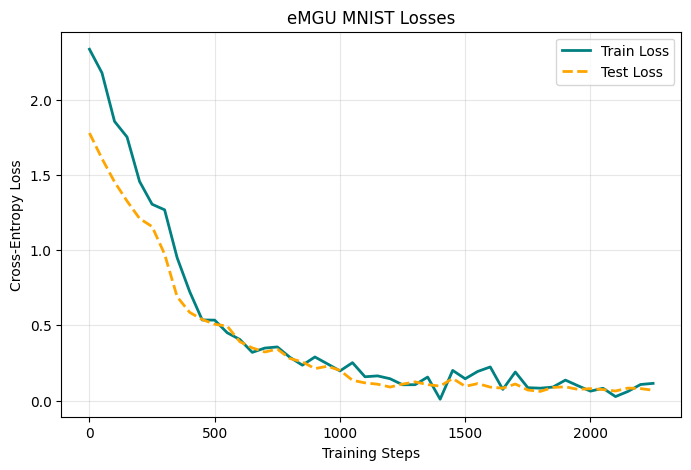

Step: 2250
Training loss: 0.11425112187862396
Validation loss: 0.0686957496098983
Accuracy measurement: 75.1201923076923


  0%|          | 0/3 [00:00<?, ?it/s]

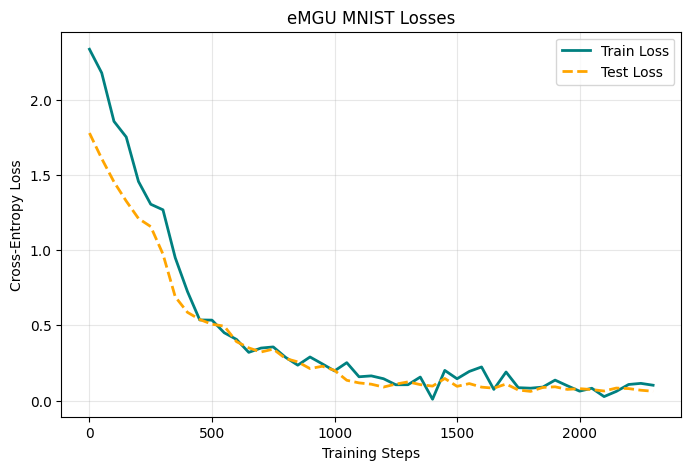

Step: 2300
Training loss: 0.10186757892370224
Validation loss: 0.06186382033121891
Accuracy measurement: 74.9198717948718


In [13]:
import custom_models_for_MNIST
import math

hid=256
lr=1e-3
epochs = 10
break_time=50
start_step =0

steps_history = []
train_history = []
test_history = []
acc_history=[]




eMGU_model = custom_models_for_MNIST.eMGU(vocab_dim=10, hid=hid, emb=1, device='cuda')
opt_eMGU = torch.optim.Adam(eMGU_model.parameters(), lr=lr)
#_ = load_model("eGRU_wikitext2_epoch_10000.pt", device='cuda', model=eGRU_model, optimizer=opt_eGRU)



for epoch in trange(10, 20):

    start_step = train_model(
        model=eMGU_model,
        model_name="eMGU",
        opt=opt_eMGU,
        training_data_batched=train_data_batched,
        training_labels_batched=train_labels_batched,
        testing_data_batched=test_data_batched,
        testing_labels_batched=test_labels_batched,
        train_loss_history=train_history,
        test_loss_history=test_history,
        acc_history=acc_history,
        start_step=start_step,
        recorded_steps=steps_history,
        break_time=break_time,
        hid=hid,
        device=device
    )


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

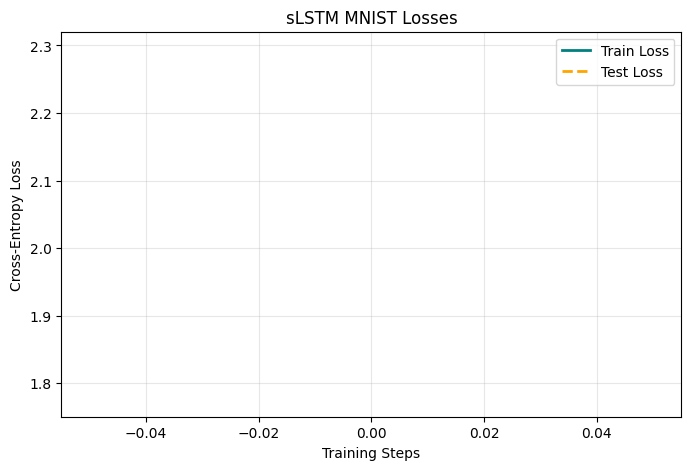

Step: 0
Training loss: 2.294485092163086
Validation loss: 1.7760092784196904
Accuracy measurement: 9.314903846153847


  0%|          | 0/3 [00:00<?, ?it/s]

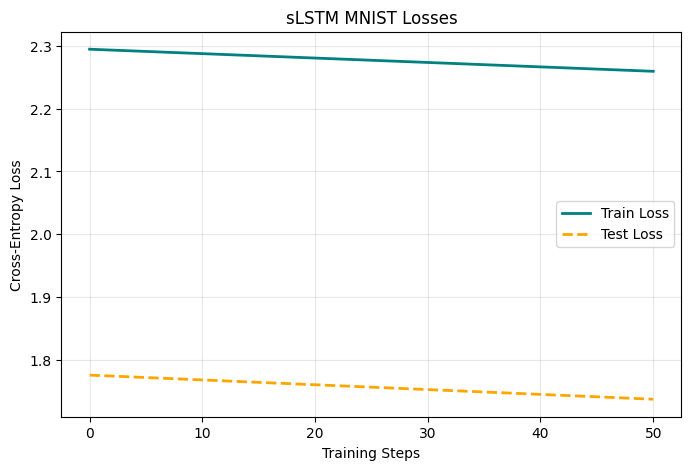

Step: 50
Training loss: 2.259366273880005
Validation loss: 1.737659099774483
Accuracy measurement: 13.221153846153847


  0%|          | 0/3 [00:00<?, ?it/s]

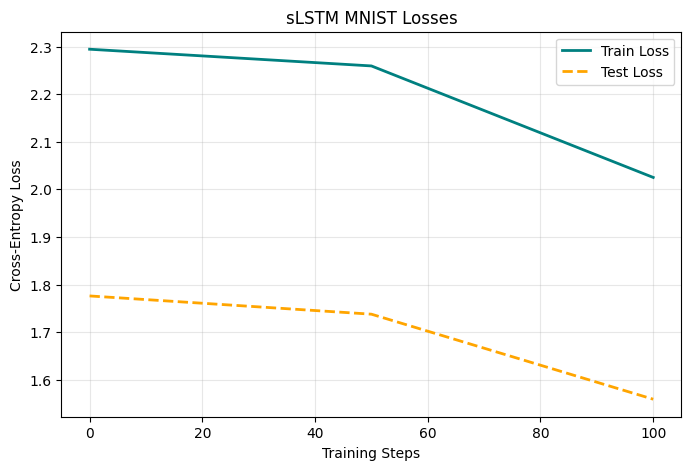

Step: 100
Training loss: 2.0250275135040283
Validation loss: 1.5589445676559057
Accuracy measurement: 19.33092948717949


  0%|          | 0/3 [00:00<?, ?it/s]

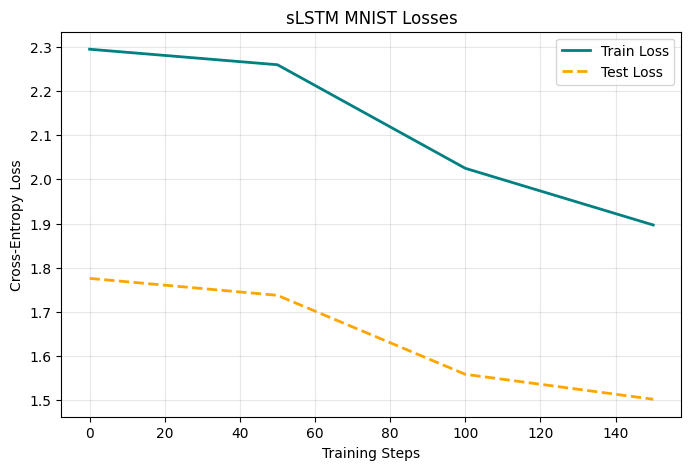

Step: 150
Training loss: 1.896801233291626
Validation loss: 1.5026013667766864
Accuracy measurement: 22.235576923076923


  0%|          | 0/3 [00:00<?, ?it/s]

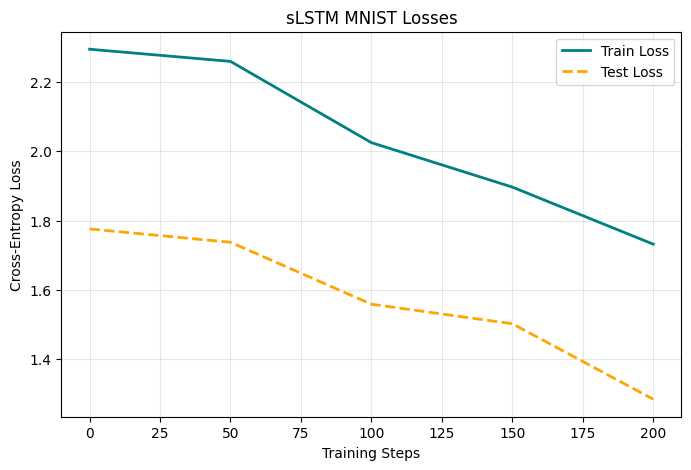

Step: 200
Training loss: 1.7321783304214478
Validation loss: 1.284851385996892
Accuracy measurement: 29.747596153846153


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

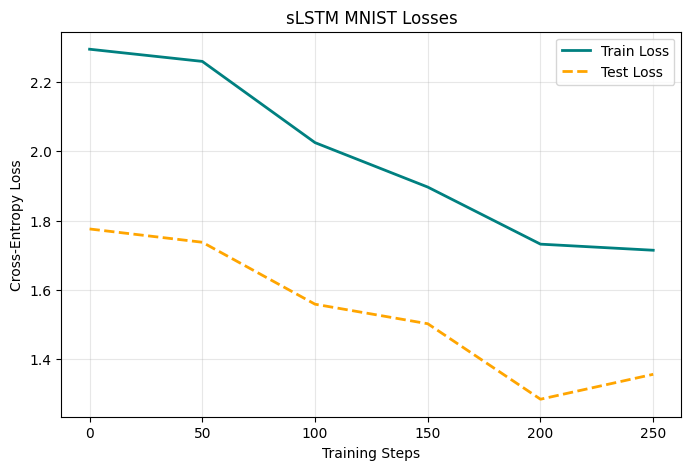

Step: 250
Training loss: 1.7146137952804565
Validation loss: 1.356727618437547
Accuracy measurement: 27.744391025641026


  0%|          | 0/3 [00:00<?, ?it/s]

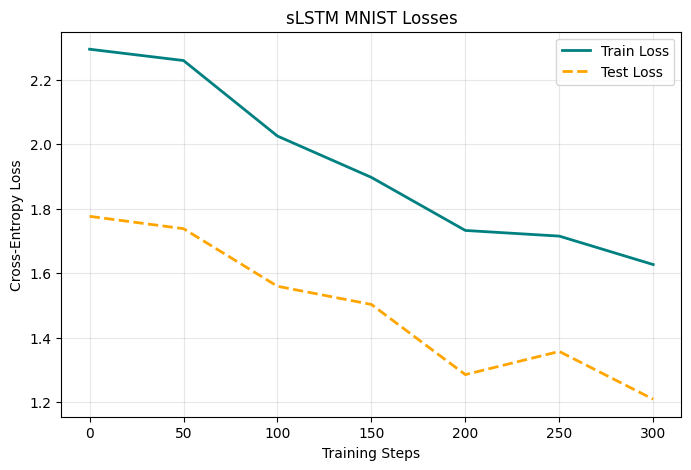

Step: 300
Training loss: 1.6263376474380493
Validation loss: 1.208504591232691
Accuracy measurement: 33.65384615384615


  0%|          | 0/3 [00:00<?, ?it/s]

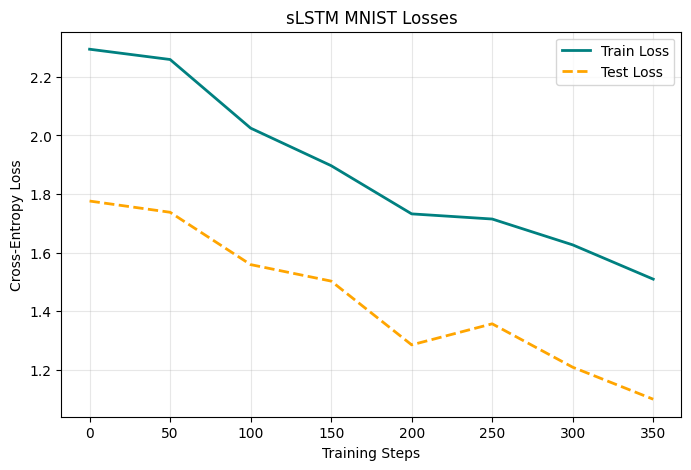

Step: 350
Training loss: 1.509273648262024
Validation loss: 1.0992155013940272
Accuracy measurement: 41.46634615384615


  0%|          | 0/3 [00:00<?, ?it/s]

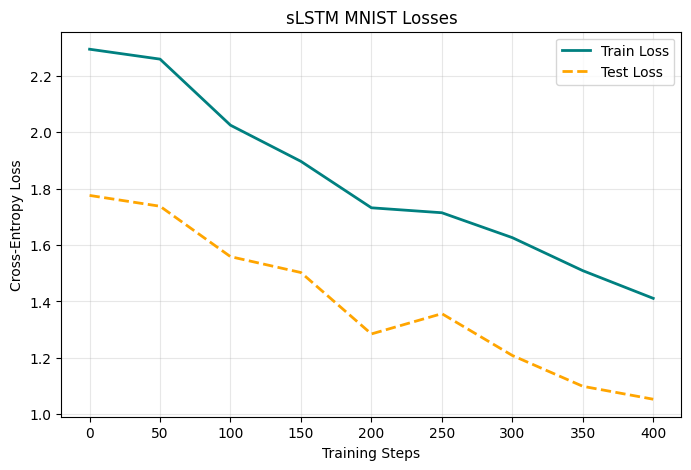

Step: 400
Training loss: 1.4110630750656128
Validation loss: 1.053357949623695
Accuracy measurement: 40.965544871794876


  0%|          | 0/3 [00:00<?, ?it/s]

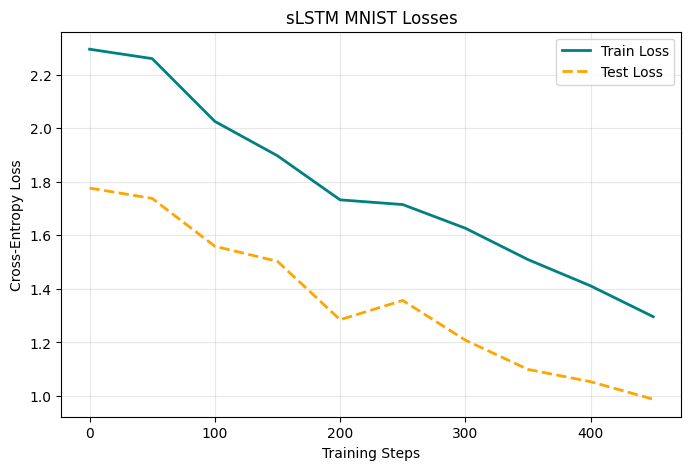

Step: 450
Training loss: 1.2959970235824585
Validation loss: 0.9879120802268004
Accuracy measurement: 43.87019230769231


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

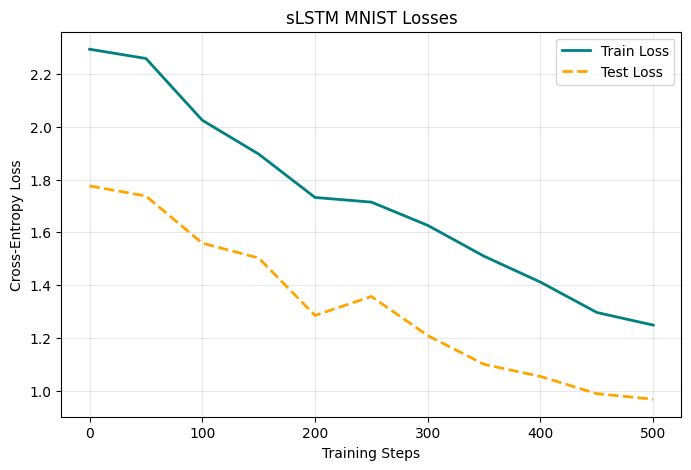

Step: 500
Training loss: 1.2480621337890625
Validation loss: 0.967013560808622
Accuracy measurement: 44.871794871794876


  0%|          | 0/3 [00:00<?, ?it/s]

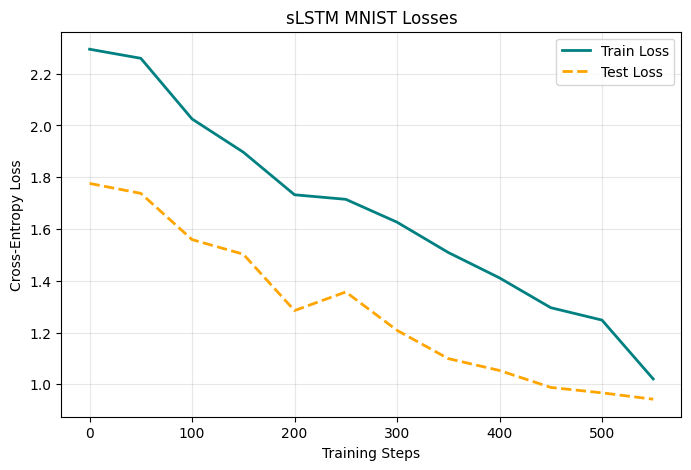

Step: 550
Training loss: 1.0206130743026733
Validation loss: 0.9423492505000188
Accuracy measurement: 46.67467948717949


  0%|          | 0/3 [00:00<?, ?it/s]

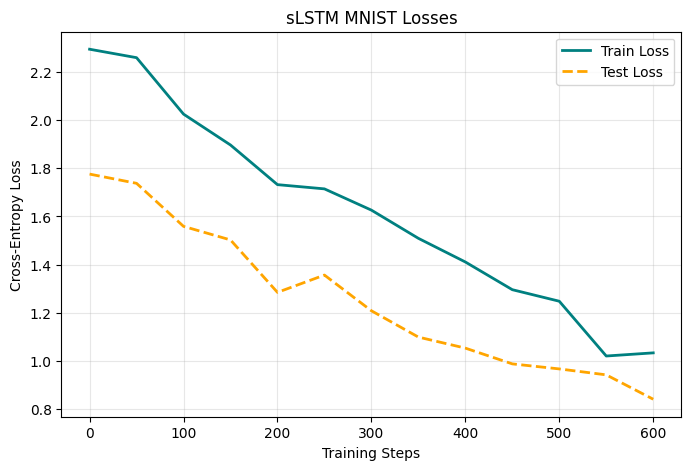

Step: 600
Training loss: 1.0336543321609497
Validation loss: 0.8411803612342248
Accuracy measurement: 50.18028846153846


  0%|          | 0/3 [00:00<?, ?it/s]

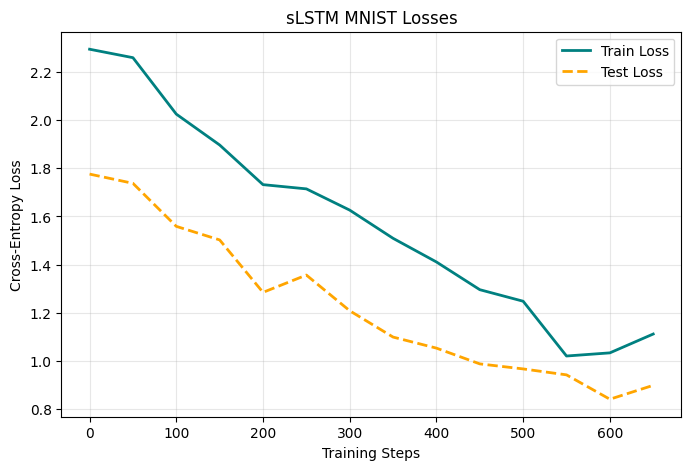

Step: 650
Training loss: 1.1119284629821777
Validation loss: 0.8988455320015932
Accuracy measurement: 45.47275641025641


  0%|          | 0/3 [00:00<?, ?it/s]

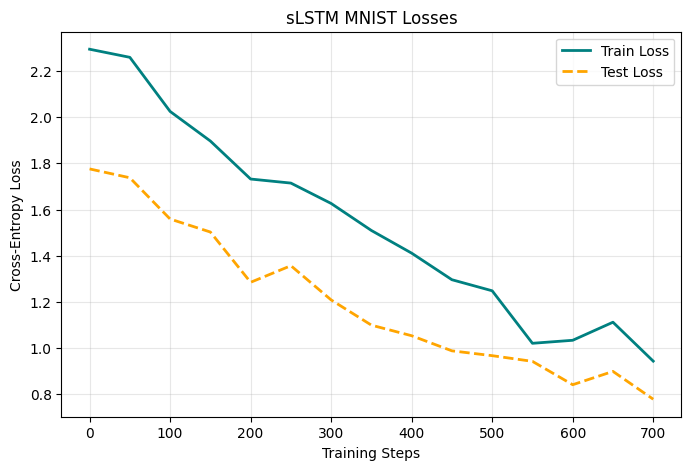

Step: 700
Training loss: 0.9433051347732544
Validation loss: 0.7783430356245775
Accuracy measurement: 52.28365384615385


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

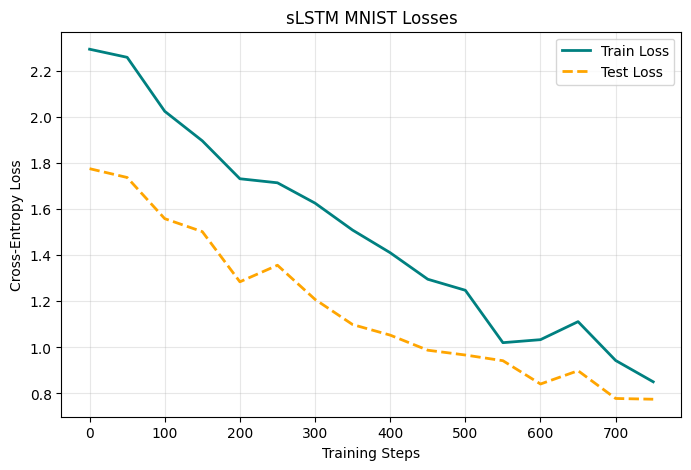

Step: 750
Training loss: 0.8507212996482849
Validation loss: 0.7751289544961392
Accuracy measurement: 50.881410256410255


  0%|          | 0/3 [00:00<?, ?it/s]

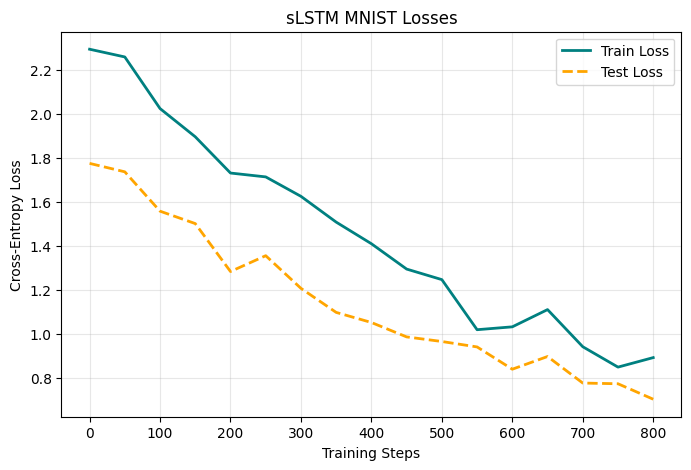

Step: 800
Training loss: 0.8938957452774048
Validation loss: 0.7048883804908166
Accuracy measurement: 54.587339743589745


  0%|          | 0/3 [00:00<?, ?it/s]

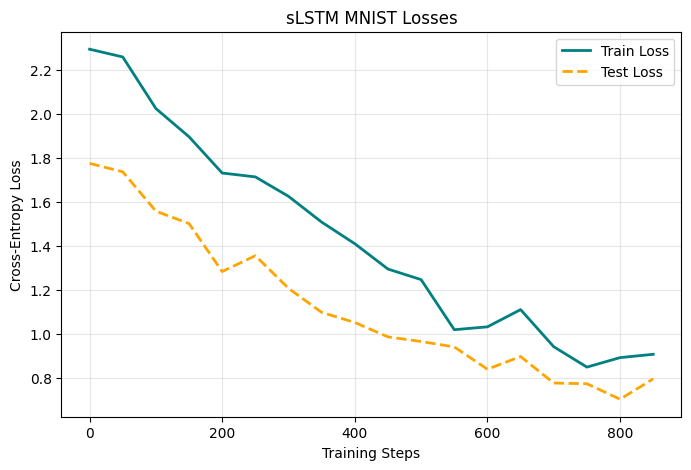

Step: 850
Training loss: 0.9089013934135437
Validation loss: 0.7975006562012893
Accuracy measurement: 50.881410256410255


  0%|          | 0/3 [00:00<?, ?it/s]

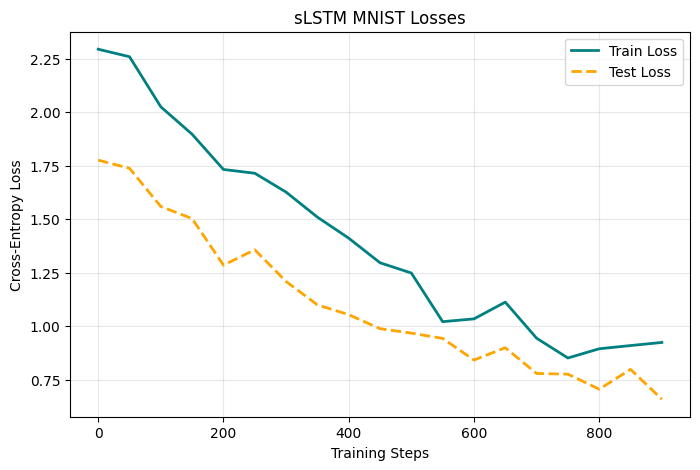

Step: 900
Training loss: 0.9234338402748108
Validation loss: 0.6579740842183431
Accuracy measurement: 55.88942307692308


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

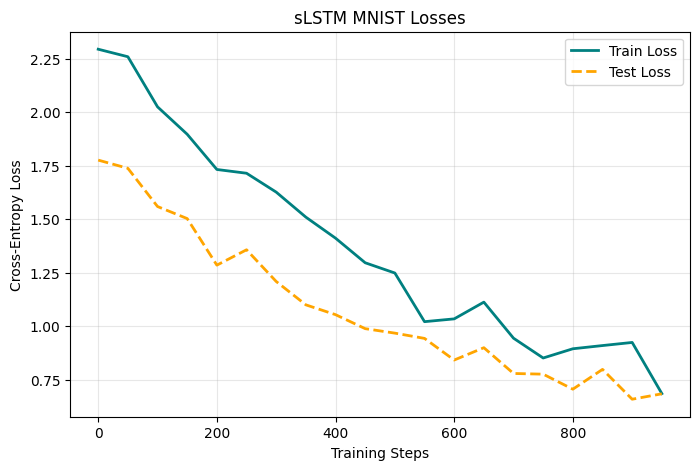

Step: 950
Training loss: 0.6842657923698425
Validation loss: 0.6832846922752185
Accuracy measurement: 54.38701923076923


  0%|          | 0/3 [00:00<?, ?it/s]

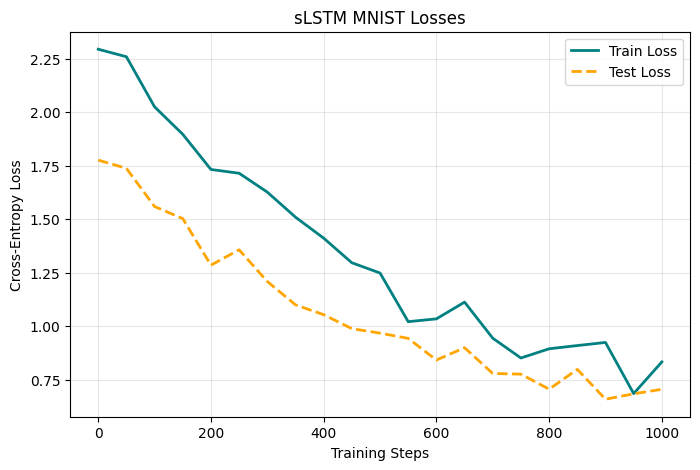

Step: 1000
Training loss: 0.8323633074760437
Validation loss: 0.7043714706714337
Accuracy measurement: 55.388621794871796


  0%|          | 0/3 [00:00<?, ?it/s]

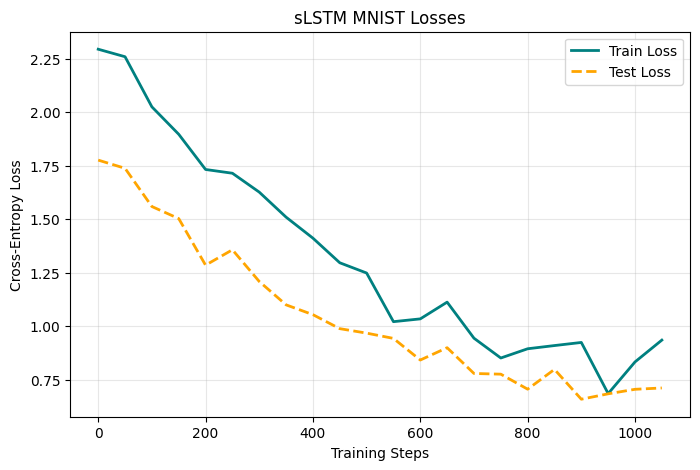

Step: 1050
Training loss: 0.9344207048416138
Validation loss: 0.7105671748136863
Accuracy measurement: 53.48557692307693


  0%|          | 0/3 [00:00<?, ?it/s]

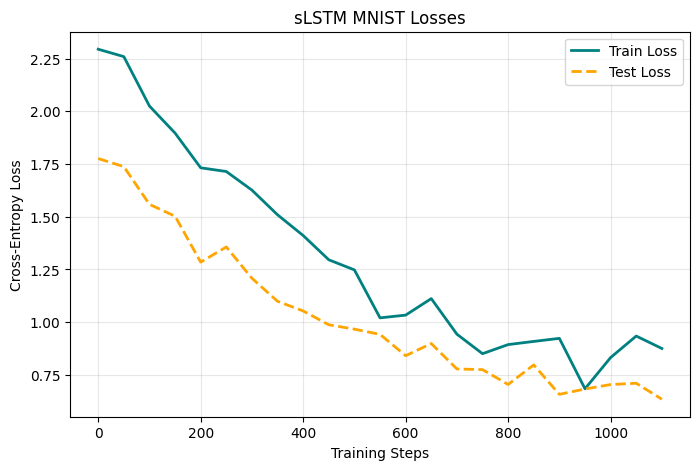

Step: 1100
Training loss: 0.8754494190216064
Validation loss: 0.6348232733897674
Accuracy measurement: 56.49038461538461


  0%|          | 0/3 [00:00<?, ?it/s]

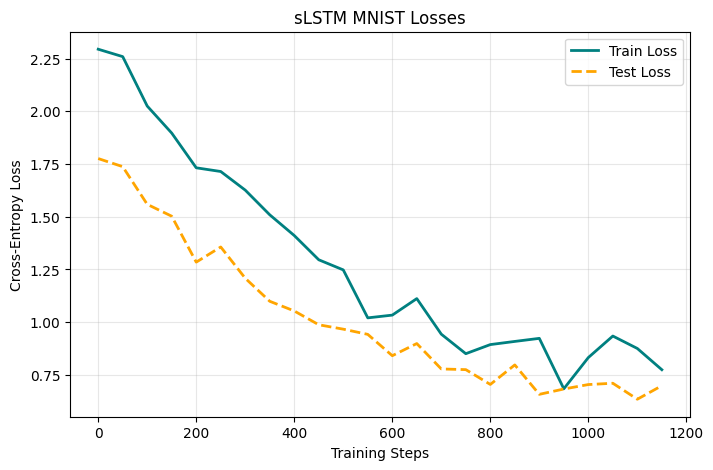

Step: 1150
Training loss: 0.7746902108192444
Validation loss: 0.6989856408192562
Accuracy measurement: 54.6875


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

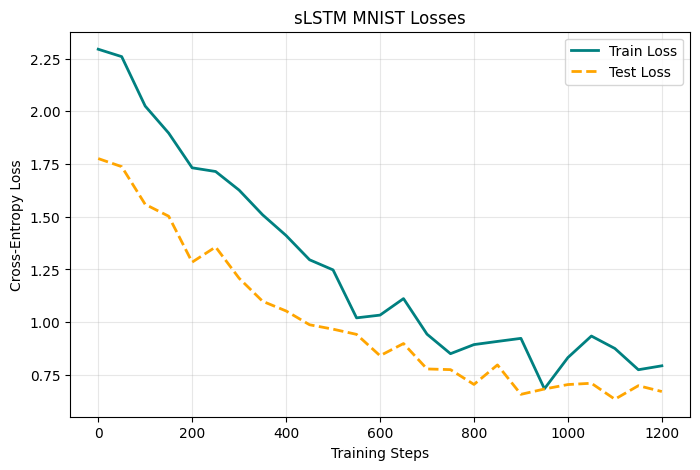

Step: 1200
Training loss: 0.7932813167572021
Validation loss: 0.6713250203010364
Accuracy measurement: 54.08653846153846


  0%|          | 0/3 [00:00<?, ?it/s]

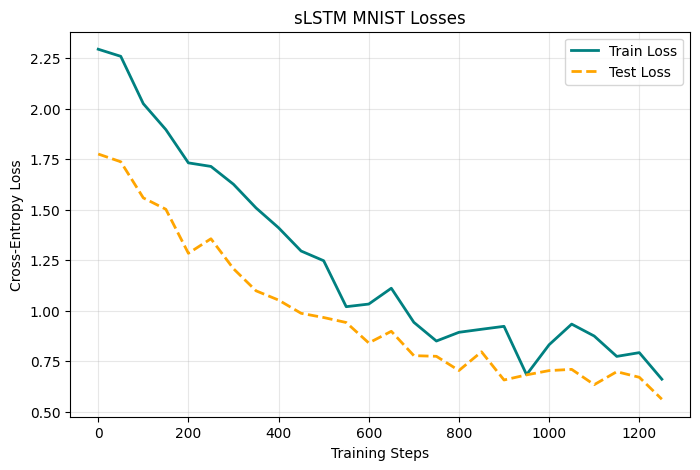

Step: 1250
Training loss: 0.6618453860282898
Validation loss: 0.5628052888772427
Accuracy measurement: 59.79567307692308


  0%|          | 0/3 [00:00<?, ?it/s]

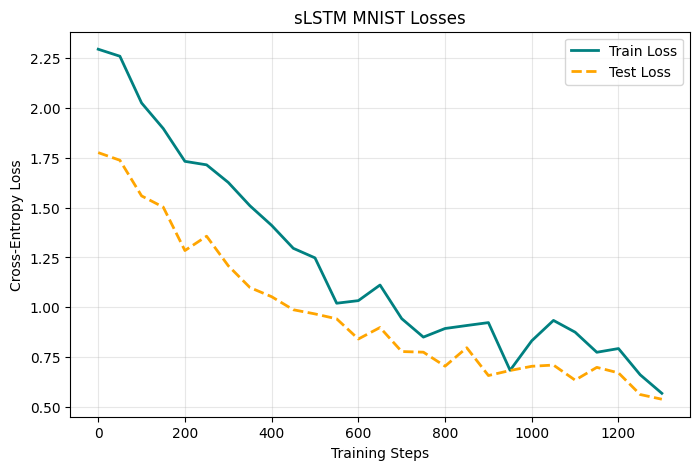

Step: 1300
Training loss: 0.5688689947128296
Validation loss: 0.5392061747037448
Accuracy measurement: 59.59535256410256


  0%|          | 0/3 [00:00<?, ?it/s]

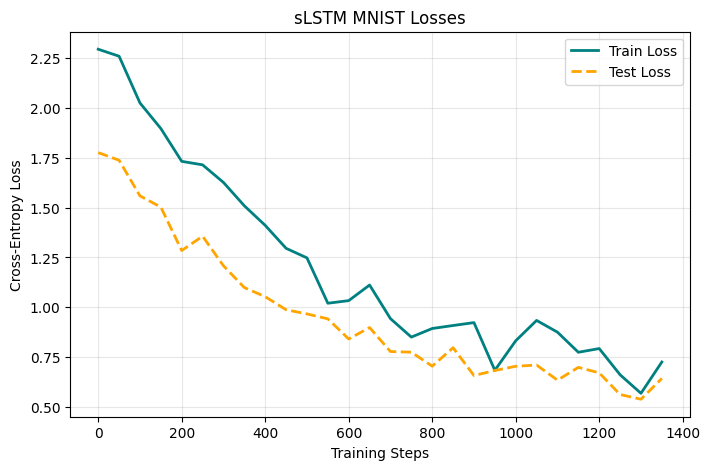

Step: 1350
Training loss: 0.7258848547935486
Validation loss: 0.643506218225528
Accuracy measurement: 57.59214743589744


  0%|          | 0/3 [00:00<?, ?it/s]

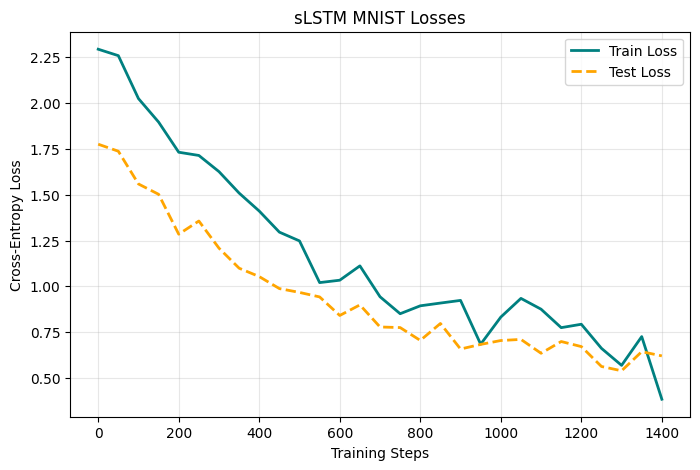

Step: 1400
Training loss: 0.38401511311531067
Validation loss: 0.6205224990844727
Accuracy measurement: 57.49198717948718


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

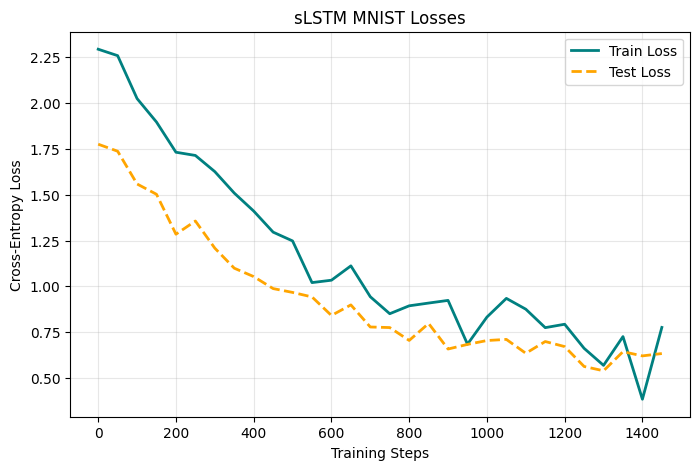

Step: 1450
Training loss: 0.7759495973587036
Validation loss: 0.6333581759379461
Accuracy measurement: 55.188301282051285


  0%|          | 0/3 [00:00<?, ?it/s]

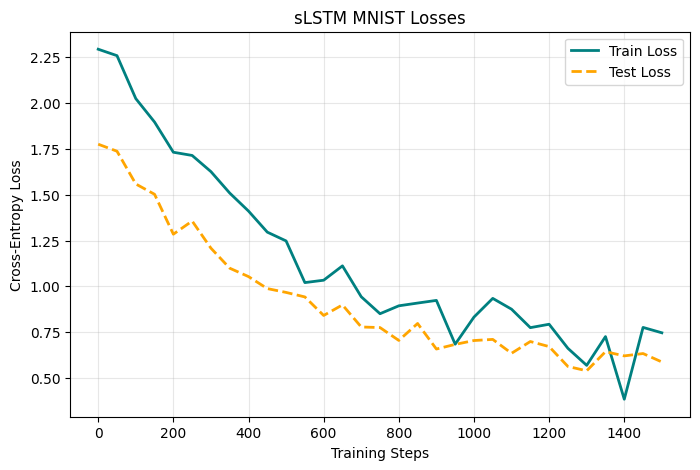

Step: 1500
Training loss: 0.7465930581092834
Validation loss: 0.587457387875288
Accuracy measurement: 57.39182692307693


  0%|          | 0/3 [00:00<?, ?it/s]

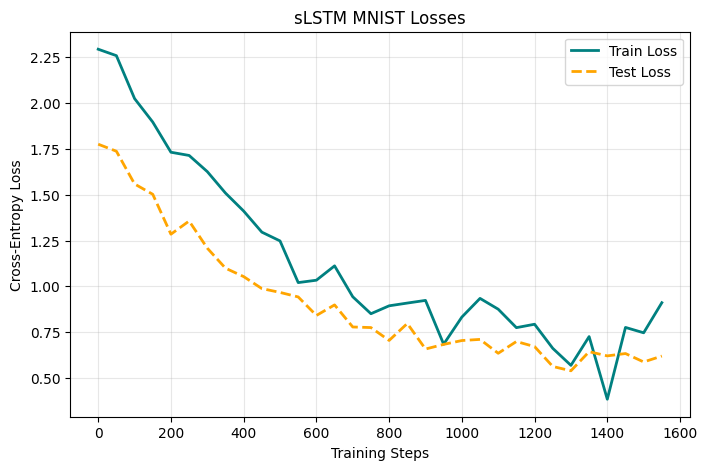

Step: 1550
Training loss: 0.9109103679656982
Validation loss: 0.6196185258718637
Accuracy measurement: 56.9911858974359


  0%|          | 0/3 [00:00<?, ?it/s]

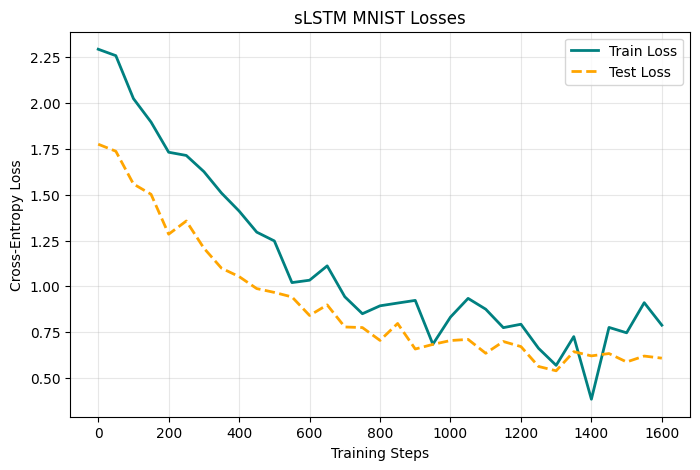

Step: 1600
Training loss: 0.788084089756012
Validation loss: 0.6081071878090883
Accuracy measurement: 56.9911858974359


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

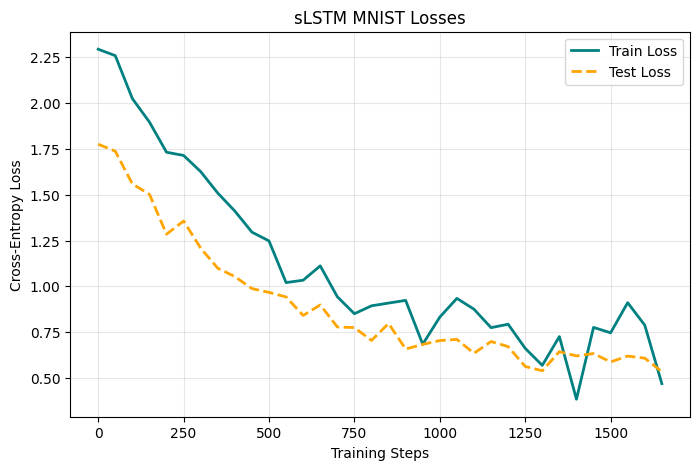

Step: 1650
Training loss: 0.4688149690628052
Validation loss: 0.5343470053795056
Accuracy measurement: 60.39663461538462


  0%|          | 0/3 [00:00<?, ?it/s]

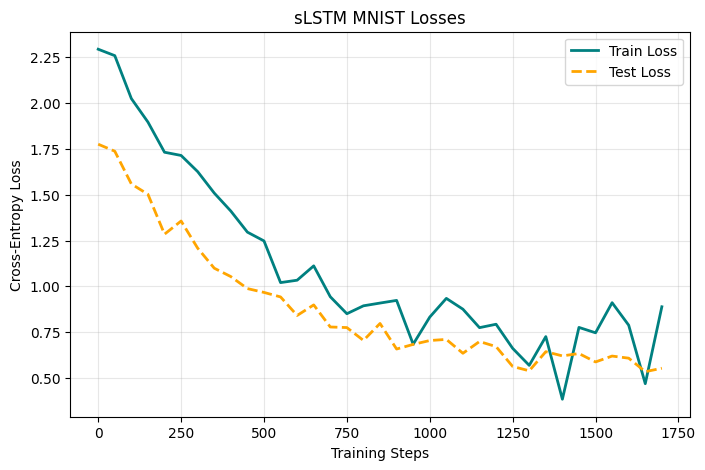

Step: 1700
Training loss: 0.8886836171150208
Validation loss: 0.553128413664989
Accuracy measurement: 58.493589743589745


  0%|          | 0/3 [00:00<?, ?it/s]

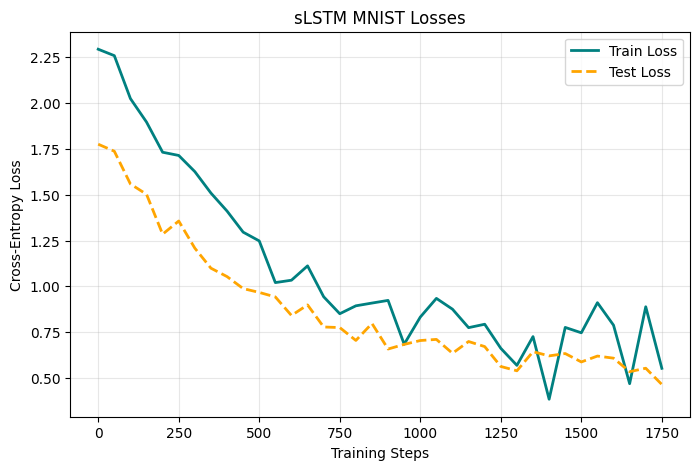

Step: 1750
Training loss: 0.5526391863822937
Validation loss: 0.46445693725194687
Accuracy measurement: 60.69711538461539


  0%|          | 0/3 [00:00<?, ?it/s]

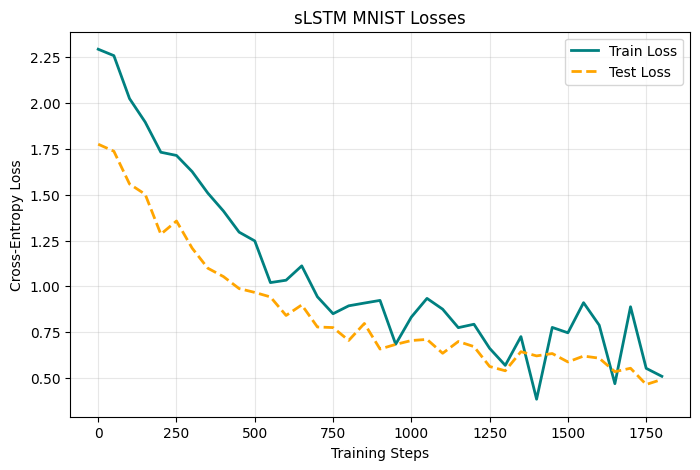

Step: 1800
Training loss: 0.5090484619140625
Validation loss: 0.4919994183075734
Accuracy measurement: 60.99759615384615


  0%|          | 0/3 [00:00<?, ?it/s]

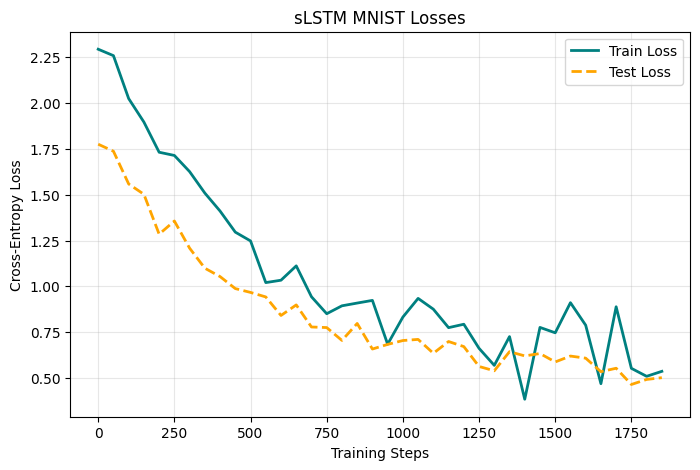

Step: 1850
Training loss: 0.5362645983695984
Validation loss: 0.5016395831719423
Accuracy measurement: 59.895833333333336


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

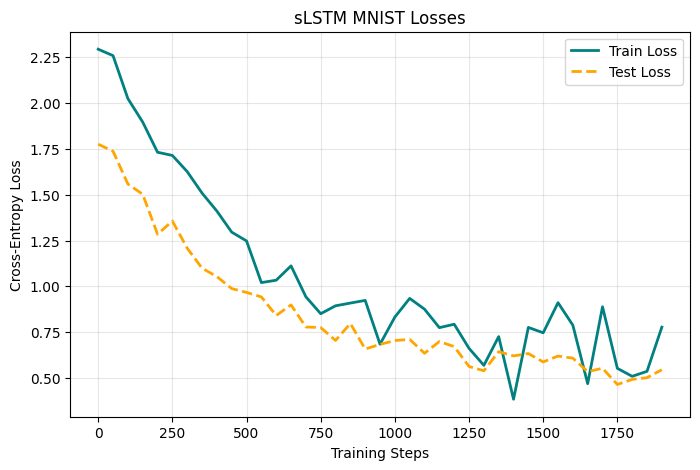

Step: 1900
Training loss: 0.7775354385375977
Validation loss: 0.5448627166258984
Accuracy measurement: 58.59375


  0%|          | 0/3 [00:00<?, ?it/s]

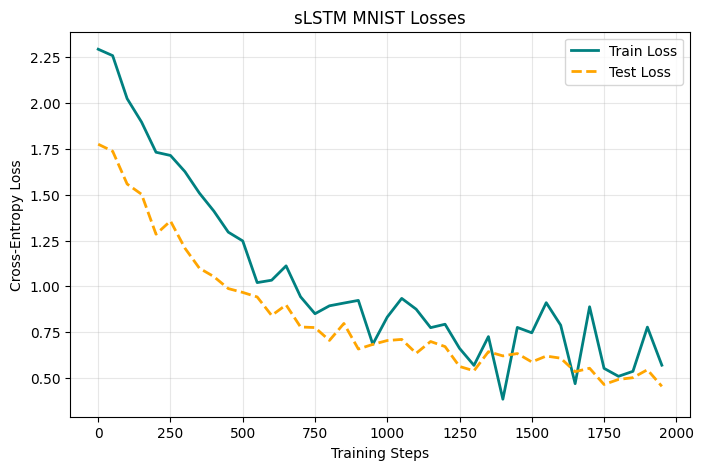

Step: 1950
Training loss: 0.5697634220123291
Validation loss: 0.4543968500235142
Accuracy measurement: 61.39823717948718


  0%|          | 0/3 [00:00<?, ?it/s]

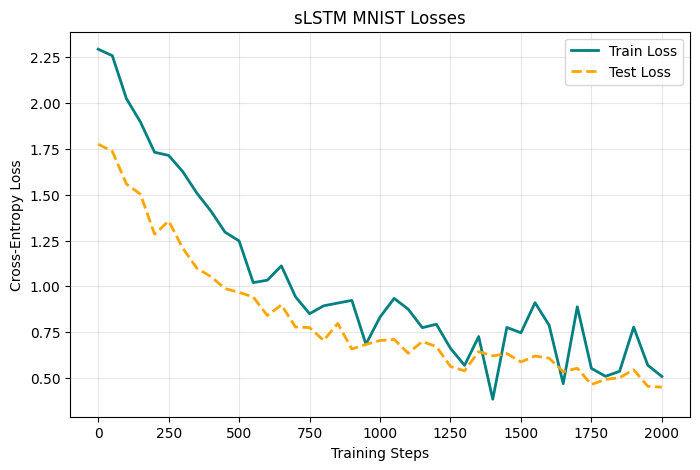

Step: 2000
Training loss: 0.5083585977554321
Validation loss: 0.4499037296344072
Accuracy measurement: 61.19791666666667


  0%|          | 0/3 [00:00<?, ?it/s]

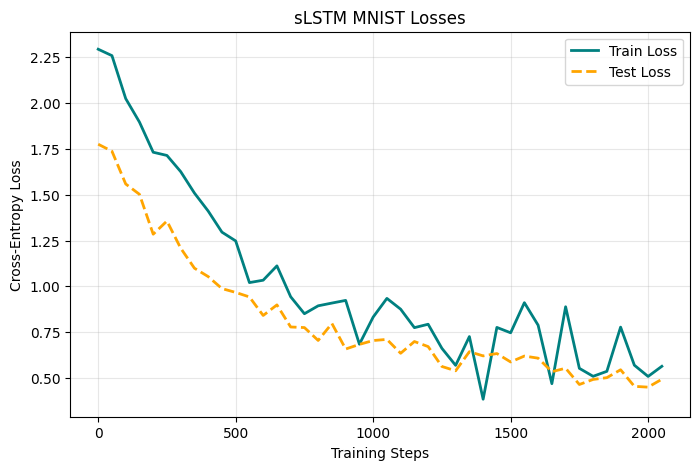

Step: 2050
Training loss: 0.5636886358261108
Validation loss: 0.49299036845182764
Accuracy measurement: 60.29647435897436


  0%|          | 0/3 [00:00<?, ?it/s]

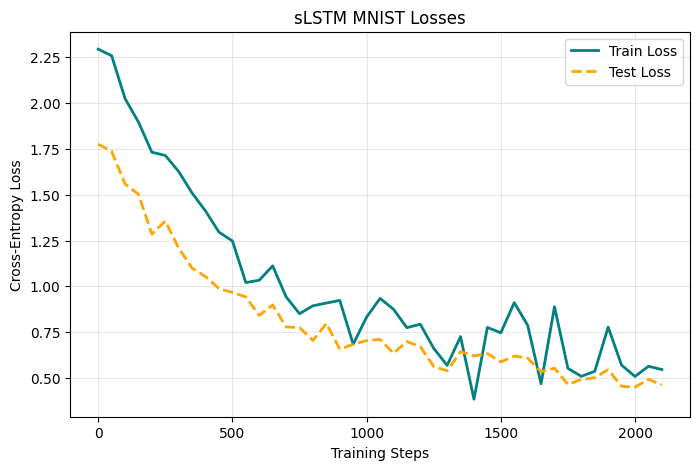

Step: 2100
Training loss: 0.5462455153465271
Validation loss: 0.46195954848558474
Accuracy measurement: 61.798878205128204


  0%|          | 0/234 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

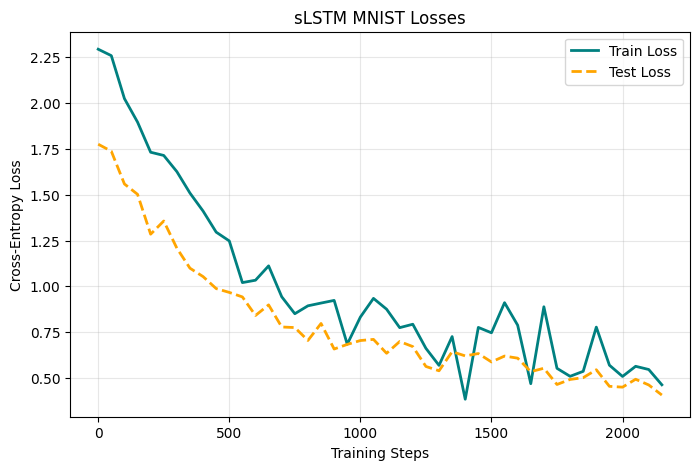

Step: 2150
Training loss: 0.4627736806869507
Validation loss: 0.40683230528464687
Accuracy measurement: 62.800480769230774


  0%|          | 0/3 [00:00<?, ?it/s]

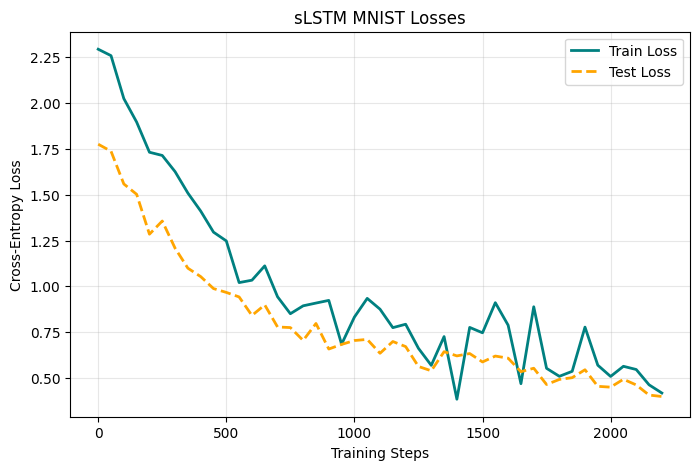

Step: 2200
Training loss: 0.4178897440433502
Validation loss: 0.39882390162883663
Accuracy measurement: 63.50160256410256


  0%|          | 0/3 [00:00<?, ?it/s]

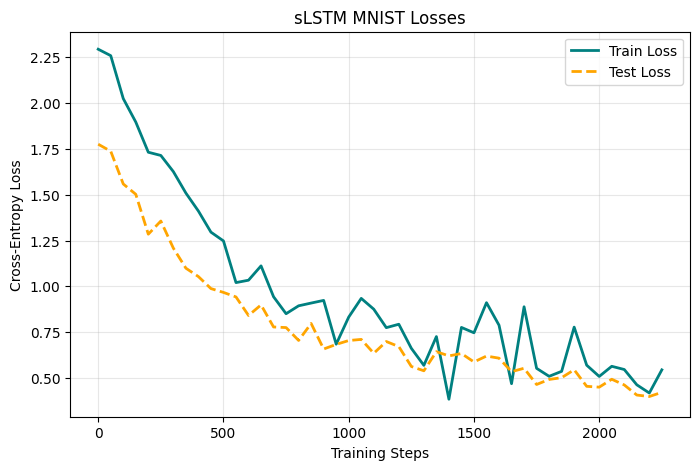

Step: 2250
Training loss: 0.5443840622901917
Validation loss: 0.4216702014972002
Accuracy measurement: 62.90064102564103


  0%|          | 0/3 [00:00<?, ?it/s]

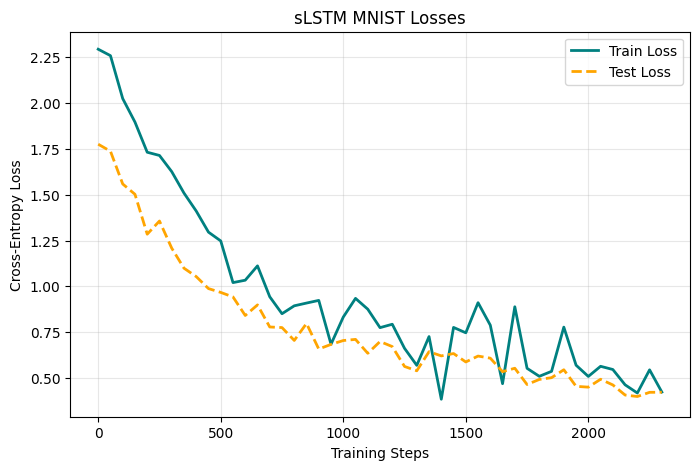

Step: 2300
Training loss: 0.4229803681373596
Validation loss: 0.42220091208433497
Accuracy measurement: 62.5


In [12]:
import custom_models_for_MNIST
import math

hid=256
lr=1e-3
epochs = 10
break_time=50
start_step =0

steps_history = []
train_history = []
test_history = []
acc_history=[]




sLSTM_model = custom_models_for_MNIST.sLSTM(vocab_dim=10, hid=hid, emb=1, device='cuda')
opt_sLSTM = torch.optim.Adam(sLSTM_model.parameters(), lr=lr)
#_ = load_model("eGRU_wikitext2_epoch_10000.pt", device='cuda', model=eGRU_model, optimizer=opt_eGRU)



for epoch in trange(10, 20):

    start_step = train_model(
        model=sLSTM_model,
        model_name="sLSTM",
        opt=opt_sLSTM,
        training_data_batched=train_data_batched,
        training_labels_batched=train_labels_batched,
        testing_data_batched=test_data_batched,
        testing_labels_batched=test_labels_batched,
        train_loss_history=train_history,
        test_loss_history=test_history,
        acc_history=acc_history,
        start_step=start_step,
        recorded_steps=steps_history,
        break_time=break_time,
        hid=hid,
        device=device
    )


## Testing


In [13]:
def eval_model_testing(model, batched_testing_data, batched_testing_labels):
    model.eval()
    with torch.no_grad():

        loss_sum = 0
        sum_test_acc = 0

        for i in trange(len(batched_testing_data)):

            inputs = batched_testing_data[i]
            outputs= batched_testing_labels[i]
            
            logits = model.forward(inputs)
            loss_t = F.cross_entropy(logits, outputs)

            loss_sum = loss_sum + loss_t.item()

            preds = torch.argmax(logits, dim=-1)
            correct = (preds == outputs).sum().item()

            test_accuracy = (correct / len(inputs)) * 100.0
            sum_test_acc = sum_test_acc + test_accuracy



        loss_avg = loss_sum/(len(batched_testing_data))
        acc_avg = sum_test_acc/(len(batched_testing_data))
        
    model.train()

    return loss_avg, acc_avg

In [14]:
def test_model(source_architecture, source_opt, model_name, start_step, stop_step, increment, test_data_batched, test_labels_batched, device):

    accuracies = dict()
    

    for i in trange(start_step, stop_step+1, increment):
        _ = load_model(
            filename=f"{model_name}_MNIST_epoch_{i}.pt",
            device=device,
            model=source_architecture,
            optimizer=source_opt
        )

        loss_avg, acc_avg = eval_model_testing(
            model=source_architecture, 
            batched_testing_data=test_data_batched,
            batched_testing_labels=test_labels_batched
        )

        accuracies[i] = acc_avg

    best_step = 0
    best_acc = 0

    for key, value in accuracies.items():
        print(f"{model_name} MNIST ACCURACY at STEP {key} = {value}")
        if value > best_acc:
            best_acc = value
            best_step = key

    print(f"BEST STEP: {best_step} = {best_acc}")




In [21]:
import custom_models_for_MNIST
import math

hid=256
lr=1e-3
epochs = 10
break_time=50
start_step =0

steps_history = []
train_history = []
test_history = []
acc_history=[]

eGRU_model = custom_models_for_MNIST.eGRU(vocab_dim=10, hid=hid, emb=1, device='cuda')
opt_eGRU = torch.optim.Adam(eGRU_model.parameters(), lr=lr)

test_model(
    source_architecture=eGRU_model,
    source_opt=opt_eGRU,
    model_name="eGRU",
    start_step=100,
    stop_step=2300,
    increment=100,
    test_data_batched=test_data_batched,
    test_labels_batched=test_labels_batched,
    device=device
)

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

eGRU MNIST ACCURACY at STEP 100 = 11.338404605263158
eGRU MNIST ACCURACY at STEP 200 = 14.802631578947368
eGRU MNIST ACCURACY at STEP 300 = 20.80592105263158
eGRU MNIST ACCURACY at STEP 400 = 22.378700657894736
eGRU MNIST ACCURACY at STEP 500 = 27.271792763157894
eGRU MNIST ACCURACY at STEP 600 = 35.567434210526315
eGRU MNIST ACCURACY at STEP 700 = 41.04646381578947
eGRU MNIST ACCURACY at STEP 800 = 45.49753289473684
eGRU MNIST ACCURACY at STEP 900 = 48.08799342105263
eGRU MNIST ACCURACY at STEP 1000 = 49.18791118421053
eGRU MNIST ACCURACY at STEP 1100 = 53.94736842105263
eGRU MNIST ACCURACY at STEP 1200 = 55.335115131578945
eGRU MNIST ACCURACY at STEP 1300 = 52.88856907894737
eGRU MNIST ACCURACY at STEP 1400 = 61.87294407894737
eGRU MNIST ACCURACY at STEP 1500 = 59.34416118421053
eGRU MNIST ACCURACY at STEP 1600 = 55.36595394736842
eGRU MNIST ACCURACY at STEP 1700 = 57.47327302631579
eGRU MNIST ACCURACY at STEP 1800 = 60.31044407894737
eGRU MNIST ACCURACY at STEP 1900 = 62.37664473684

In [22]:
import custom_models_for_MNIST
import math

hid=256
lr=1e-3
epochs = 10
break_time=50
start_step =0

steps_history = []
train_history = []
test_history = []
acc_history=[]

GRU_model = custom_models_for_MNIST.GRU_LM(vocab_dim=10, hid=hid, emb=1, device='cuda')
opt_GRU = torch.optim.Adam(GRU_model.parameters(), lr=lr)

test_model(
    source_architecture=GRU_model,
    source_opt=opt_GRU,
    model_name="GRU",
    start_step=100,
    stop_step=2300,
    increment=100,
    test_data_batched=test_data_batched,
    test_labels_batched=test_labels_batched,
    device=device
)

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

GRU MNIST ACCURACY at STEP 100 = 11.338404605263158
GRU MNIST ACCURACY at STEP 200 = 11.430921052631579
GRU MNIST ACCURACY at STEP 300 = 18.5546875
GRU MNIST ACCURACY at STEP 400 = 10.217927631578947
GRU MNIST ACCURACY at STEP 500 = 31.178042763157894
GRU MNIST ACCURACY at STEP 600 = 39.977384868421055
GRU MNIST ACCURACY at STEP 700 = 47.594572368421055
GRU MNIST ACCURACY at STEP 800 = 62.85978618421053
GRU MNIST ACCURACY at STEP 900 = 72.75904605263158
GRU MNIST ACCURACY at STEP 1000 = 76.53166118421052
GRU MNIST ACCURACY at STEP 1100 = 78.72121710526316
GRU MNIST ACCURACY at STEP 1200 = 81.16776315789474
GRU MNIST ACCURACY at STEP 1300 = 80.55098684210526
GRU MNIST ACCURACY at STEP 1400 = 80.05756578947368
GRU MNIST ACCURACY at STEP 1500 = 86.17393092105263
GRU MNIST ACCURACY at STEP 1600 = 86.71875
GRU MNIST ACCURACY at STEP 1700 = 87.80838815789474
GRU MNIST ACCURACY at STEP 1800 = 85.03289473684211
GRU MNIST ACCURACY at STEP 1900 = 91.18009868421052
GRU MNIST ACCURACY at STEP 2000

In [23]:
import custom_models_for_MNIST
import math

hid=256
lr=1e-3
epochs = 10
break_time=50
start_step =0

steps_history = []
train_history = []
test_history = []
acc_history=[]

sLSTM_model = custom_models_for_MNIST.sLSTM(vocab_dim=10, hid=hid, emb=1, device='cuda')
opt_sLSTM = torch.optim.Adam(sLSTM_model.parameters(), lr=lr)

test_model(
    source_architecture=sLSTM_model,
    source_opt=opt_sLSTM,
    model_name="sLSTM",
    start_step=100,
    stop_step=2300,
    increment=100,
    test_data_batched=test_data_batched,
    test_labels_batched=test_labels_batched,
    device=device
)

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

sLSTM MNIST ACCURACY at STEP 100 = 23.37582236842105
sLSTM MNIST ACCURACY at STEP 200 = 34.354440789473685
sLSTM MNIST ACCURACY at STEP 300 = 44.38733552631579
sLSTM MNIST ACCURACY at STEP 400 = 52.68297697368421
sLSTM MNIST ACCURACY at STEP 500 = 58.36759868421053
sLSTM MNIST ACCURACY at STEP 600 = 65.01850328947368
sLSTM MNIST ACCURACY at STEP 700 = 68.13322368421052
sLSTM MNIST ACCURACY at STEP 800 = 72.1217105263158
sLSTM MNIST ACCURACY at STEP 900 = 74.14679276315789
sLSTM MNIST ACCURACY at STEP 1000 = 72.72820723684211
sLSTM MNIST ACCURACY at STEP 1100 = 74.71217105263158
sLSTM MNIST ACCURACY at STEP 1200 = 72.95435855263158
sLSTM MNIST ACCURACY at STEP 1300 = 77.734375
sLSTM MNIST ACCURACY at STEP 1400 = 76.89144736842105
sLSTM MNIST ACCURACY at STEP 1500 = 78.515625
sLSTM MNIST ACCURACY at STEP 1600 = 76.76809210526316
sLSTM MNIST ACCURACY at STEP 1700 = 79.12212171052632
sLSTM MNIST ACCURACY at STEP 1800 = 81.5892269736842
sLSTM MNIST ACCURACY at STEP 1900 = 79.01932565789474


In [24]:
import custom_models_for_MNIST
import math

hid=256
lr=1e-3
epochs = 10
break_time=50
start_step =0

steps_history = []
train_history = []
test_history = []
acc_history=[]

MGU_model = custom_models_for_MNIST.MGU(vocab_dim=10, hid=hid, emb=1, device='cuda')
opt_MGU = torch.optim.Adam(MGU_model.parameters(), lr=lr)

test_model(
    source_architecture=MGU_model,
    source_opt=opt_MGU,
    model_name="MGU",
    start_step=100,
    stop_step=2300,
    increment=100,
    test_data_batched=test_data_batched,
    test_labels_batched=test_labels_batched,
    device=device
)

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

MGU MNIST ACCURACY at STEP 100 = 24.691611842105264
MGU MNIST ACCURACY at STEP 200 = 32.51439144736842
MGU MNIST ACCURACY at STEP 300 = 57.50411184210526
MGU MNIST ACCURACY at STEP 400 = 70.3638980263158
MGU MNIST ACCURACY at STEP 500 = 76.68585526315789
MGU MNIST ACCURACY at STEP 600 = 83.9329769736842
MGU MNIST ACCURACY at STEP 700 = 84.40583881578948
MGU MNIST ACCURACY at STEP 800 = 86.20476973684211
MGU MNIST ACCURACY at STEP 900 = 87.96258223684211
MGU MNIST ACCURACY at STEP 1000 = 90.91282894736842
MGU MNIST ACCURACY at STEP 1100 = 91.77631578947368
MGU MNIST ACCURACY at STEP 1200 = 93.82195723684211
MGU MNIST ACCURACY at STEP 1300 = 94.65460526315789
MGU MNIST ACCURACY at STEP 1400 = 93.8939144736842
MGU MNIST ACCURACY at STEP 1500 = 96.1451480263158
MGU MNIST ACCURACY at STEP 1600 = 96.64884868421052
MGU MNIST ACCURACY at STEP 1700 = 97.08059210526316
MGU MNIST ACCURACY at STEP 1800 = 96.77220394736842
MGU MNIST ACCURACY at STEP 1900 = 97.32730263157895
MGU MNIST ACCURACY at ST

In [25]:
import custom_models_for_MNIST
import math

hid=256
lr=1e-3
epochs = 10
break_time=50
start_step =0

steps_history = []
train_history = []
test_history = []
acc_history=[]

eMGU_model = custom_models_for_MNIST.eMGU(vocab_dim=10, hid=hid, emb=1, device='cuda')
opt_eMGU = torch.optim.Adam(eMGU_model.parameters(), lr=lr)

test_model(
    source_architecture=eMGU_model,
    source_opt=opt_eMGU,
    model_name="eMGU",
    start_step=100,
    stop_step=2300,
    increment=100,
    test_data_batched=test_data_batched,
    test_labels_batched=test_labels_batched,
    device=device
)

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

eMGU MNIST ACCURACY at STEP 100 = 31.527549342105264
eMGU MNIST ACCURACY at STEP 200 = 41.29317434210526
eMGU MNIST ACCURACY at STEP 300 = 51.84004934210526
eMGU MNIST ACCURACY at STEP 400 = 75.23643092105263
eMGU MNIST ACCURACY at STEP 500 = 79.94449013157895
eMGU MNIST ACCURACY at STEP 600 = 83.43955592105263
eMGU MNIST ACCURACY at STEP 700 = 87.08881578947368
eMGU MNIST ACCURACY at STEP 800 = 88.06537828947368
eMGU MNIST ACCURACY at STEP 900 = 92.35197368421052
eMGU MNIST ACCURACY at STEP 1000 = 93.73972039473684
eMGU MNIST ACCURACY at STEP 1100 = 95.53865131578948
eMGU MNIST ACCURACY at STEP 1200 = 96.57689144736842
eMGU MNIST ACCURACY at STEP 1300 = 95.32277960526316
eMGU MNIST ACCURACY at STEP 1400 = 96.8236019736842
eMGU MNIST ACCURACY at STEP 1500 = 96.58717105263158
eMGU MNIST ACCURACY at STEP 1600 = 97.20394736842105
eMGU MNIST ACCURACY at STEP 1700 = 97.08059210526316
eMGU MNIST ACCURACY at STEP 1800 = 97.72820723684211
eMGU MNIST ACCURACY at STEP 1900 = 97.36842105263158
eM

In [17]:
import custom_models_for_MNIST
import math

hid=256
lr=1e-3
epochs = 10
break_time=50
start_step =0

steps_history = []
train_history = []
test_history = []
acc_history=[]

LSTM_model = custom_models_for_MNIST.LSTM_LM(vocab_dim=10, hid=hid, emb=1, device='cuda')
opt_LSTM = torch.optim.Adam(LSTM_model.parameters(), lr=lr)

test_model(
    source_architecture=LSTM_model,
    source_opt=opt_LSTM,
    model_name="LSTM",
    start_step=100,
    stop_step=2300,
    increment=100,
    test_data_batched=test_data_batched,
    test_labels_batched=test_labels_batched,
    device=device
)

  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/19 [00:00<?, ?it/s]

LSTM MNIST ACCURACY at STEP 100 = 11.338404605263158
LSTM MNIST ACCURACY at STEP 200 = 11.338404605263158
LSTM MNIST ACCURACY at STEP 300 = 11.338404605263158
LSTM MNIST ACCURACY at STEP 400 = 11.338404605263158
LSTM MNIST ACCURACY at STEP 500 = 11.338404605263158
LSTM MNIST ACCURACY at STEP 600 = 11.338404605263158
LSTM MNIST ACCURACY at STEP 700 = 11.338404605263158
LSTM MNIST ACCURACY at STEP 800 = 11.338404605263158
LSTM MNIST ACCURACY at STEP 900 = 11.646792763157896
LSTM MNIST ACCURACY at STEP 1000 = 18.287417763157894
LSTM MNIST ACCURACY at STEP 1100 = 20.034950657894736
LSTM MNIST ACCURACY at STEP 1200 = 19.695723684210527
LSTM MNIST ACCURACY at STEP 1300 = 19.644325657894736
LSTM MNIST ACCURACY at STEP 1400 = 19.81907894736842
LSTM MNIST ACCURACY at STEP 1500 = 19.78824013157895
LSTM MNIST ACCURACY at STEP 1600 = 20.137746710526315
LSTM MNIST ACCURACY at STEP 1700 = 20.3125
LSTM MNIST ACCURACY at STEP 1800 = 19.695723684210527
LSTM MNIST ACCURACY at STEP 1900 = 18.657483552631